In [1]:
import ast
from collections import Counter
from gensim import utils, matutils 
from gensim.corpora.dictionary import Dictionary
from gensim.utils import deprecated
import itertools
from nltk.corpus import stopwords
import numpy as np
from numpy import linalg as LA
from numpy.random import binomial
from numpy import dot, float32 as REAL, memmap as np_memmap, \
    double, array, zeros, vstack, sqrt, newaxis, integer, \
    ndarray, sum as np_sum, prod, argmax
from numpy.linalg import norm
import math, copy, time
import warnings 

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_context(context="talk")
%matplotlib inline

from keras import backend as K
#from keras.models import load_model
from keras.preprocessing.sequence import pad_sequences
from keras import backend as K
import keras
from keras.utils import to_categorical
from keras.preprocessing import sequence

import os, sys, re, io, nltk, torch
import pandas as pd

from scipy import stats
from scipy.stats import bernoulli
from scipy.stats import ortho_group  # Requires version 0.18 of scipy
from scipy.spatial import distance
from sklearn.utils.class_weight import compute_class_weight
from sklearn.utils import class_weight
from sklearn.preprocessing import Normalizer, normalize
from sklearn.model_selection import KFold, train_test_split
from sklearn.metrics import accuracy_score,f1_score, confusion_matrix, recall_score, precision_score

from six import string_types, integer_types
from six.moves import zip, range
if not sys.warnoptions:
    warnings.simplefilter("ignore")

from tqdm import tqdm, trange
import time
import transformers
from transformers import (
    WEIGHTS_NAME,
    AdamW,
    BertConfig,
    BertForMaskedLM,
    BertForSequenceClassification,
    BertTokenizer,
    CamembertConfig,
    CamembertForMaskedLM,
    CamembertTokenizer,
    DistilBertConfig,
    DistilBertForMaskedLM,
    DistilBertTokenizer,
    GPT2Config,
    GPT2LMHeadModel,
    GPT2Tokenizer,
    OpenAIGPTConfig,
    OpenAIGPTLMHeadModel,
    OpenAIGPTTokenizer,
    RobertaConfig,
    RobertaForMaskedLM,
    RobertaTokenizer,
    get_linear_schedule_with_warmup,
)

import torch.nn.functional as F
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler
from torch.autograd import Variable
import re
from nltk.corpus import stopwords
from nltk import WordNetLemmatizer
from nltk.stem.snowball import SnowballStemmer
from nltk.stem.porter import *

stemmer_sn = SnowballStemmer("english")
stemmer = PorterStemmer()

stoplist = stopwords.words("english")
lemmatizer=WordNetLemmatizer()


'''
Compatible with tensorflow backend
gamma entre más alto más tolerante (queremos un gamma chico pero no demasiado! 0.25 - 5)
alpha pesos por clase (weights)
'''
def focal_loss(gamma=2., weights=1):   #weights np.asarray()
    weights= K.variable(weights)
    def focal_loss_fixed(y_true, y_pred):
        y_true = K.clip(y_true, K.epsilon(),1)
        y_pred = K.clip(y_pred,K.epsilon(),1)
        return - K.sum(weights* K.pow(1. - y_pred, gamma)* y_true * K.log(y_pred), axis=-1) 
    return focal_loss_fixed

keras.losses.focal_loss=keras.losses.MSE
keras.losses.focal_loss_fixed=keras.losses.MSE

n_gpu = torch.cuda.device_count()
torch.cuda.get_device_name(0)

if torch.cuda.is_available():     
    device = torch.device("cuda")
    print('There are',torch.cuda.device_count(),'GPU(s) available.')
    print('We will use the GPU:', torch.cuda.get_device_name(0))

else:
    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")

if not sys.warnoptions:
    warnings.simplefilter("ignore")
    
class Dummy_Embeddings(nn.Module):
    def __init__(self, d_model, dummy_vectors): 
        super(Dummy_Embeddings, self).__init__()
        aux = torch.from_numpy(dummy_vectors)#, dtype='float32'))
        self.index2dummy = nn.Embedding(aux.size()[0], d_model)
        self.index2dummy.weigth=nn.Parameter(aux)
        self.index2dummy.weigth.requires_grad=False
        self.d_model = d_model
        
    def forward(self, x):
        aux=x.numpy()
        new_x= aux #- np.ones(aux.shape)
        new_x= torch.from_numpy(new_x)
        return self.index2dummy(new_x.long()) * math.sqrt(self.d_model) #debiese retornar matriz de batch_size x [ind_tw, k1,k2,k3,k4,k5,k6] (si son 6 modelos)
    
def match(objetos,ejemplo):
    i=0
    for obj in objetos:
        if obj==ejemplo:
            return i
        i+=1
        
def plot_confusion_matrix(cm, target_names, title='Confusion matrix (f1-score)',cmap=None, normalize=True):    
    accuracy = np.trace(cm) / float(np.sum(cm))
    misclass = 1 - accuracy
    if cmap is None:
        cmap = plt.get_cmap('Blues')
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        
    plt.figure(figsize=(8, 6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap, vmin=0, vmax=1)
    plt.title(title)
    plt.colorbar()
    
    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45)
        plt.yticks(tick_marks, target_names)
    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if normalize:
            plt.text(j, i, "{:0.4f}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
        else:
            plt.text(j, i, "{:,}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label\naccuracy={:0.4f}; misclass={:0.4f}'.format(accuracy, misclass))
    plt.show()
    
    
class EncoderDecoderLogSoft(nn.Module):
    def __init__(self, encoder, src_embed, sequential):
        super(EncoderDecoderLogSoft, self).__init__()
        self.encoder = encoder
        self.linearSoft = sequential
        self.src_embed = src_embed
        
    def forward(self, src, src_mask):
        out=self.encode(src, src_mask)
        retorno=self.toSoftmax(out)
        return retorno
    
    def encode(self, src, src_mask):
        return self.encoder(self.src_embed(src), src_mask)
    
    def toSoftmax(self, tensor):
        a=tensor.size()[0]
        b=tensor.size()[-1]
        c=tensor.size()[-2]
        new_tensor= np.zeros((a, b))
        ini=True
        for ai in range(a):
            for ci in range(c):
                if ini:
                    new_tensor[ai]=tensor.data[ai][ci].numpy()
                    ini=False
                else: 
                    new_tensor[ai]*=tensor.data[ai][ci].numpy()
            ini=True
        new_tensor=torch.from_numpy(new_tensor)
        lineal=self.linearSoft(new_tensor.float())
        return F.log_softmax(lineal, dim = -1)
    
    def decode(self, memory, src_mask, tgt, tgt_mask):
        return self.decoder(self.tgt_embed(tgt), memory, src_mask, tgt_mask)
    
def clones(module, N):
    return nn.ModuleList([copy.deepcopy(module) for _ in range(N)])


class EncoderDecoderSoft(nn.Module):
    def __init__(self, encoder, src_embed, sequential):
        super(EncoderDecoderSoft, self).__init__()
        self.encoder = encoder
        self.linearSoft = sequential
        self.src_embed = src_embed
        
    def forward(self, src, src_mask):
        out=self.encode(src, src_mask)
        retorno=self.toSoftmax(out)
        return retorno
    
    def encode(self, src, src_mask):
        return self.encoder(self.src_embed(src), src_mask)
    
    def toSoftmax(self, tensor):
        a=tensor.size()[0]
        b=tensor.size()[-1]
        c=tensor.size()[-2]
        new_tensor= np.zeros((a, b))
        ini=True
        for ai in range(a):
            for ci in range(c):
                if ini:
                    new_tensor[ai]=tensor.data[ai][ci].numpy()
                    ini=False
                else: 
                    new_tensor[ai]*=tensor.data[ai][ci].numpy()
            ini=True
            
        new_tensor=torch.from_numpy(new_tensor)
        lineal=self.linearSoft(new_tensor.float())
        return F.softmax(lineal, dim = -1)
    
    def decode(self, memory, src_mask, tgt, tgt_mask):
        return self.decoder(self.tgt_embed(tgt), memory, src_mask, tgt_mask)
    
def clones(module, N):
    return nn.ModuleList([copy.deepcopy(module) for _ in range(N)])

class EncoderDecoder(nn.Module):
    def __init__(self, encoder, src_embed, generator):
        super(EncoderDecoder, self).__init__()
        self.encoder = encoder
        self.src_embed = src_embed
        self.generator = generator
        
    def forward(self, src, src_mask):
        return  self.encode(src, src_mask)

    def encode(self, src, src_mask):
        return self.encoder(self.src_embed(src), src_mask)
    
    def decode(self, memory, src_mask, tgt, tgt_mask):
        return self.decoder(self.tgt_embed(tgt), memory, src_mask, tgt_mask)
    
class Encoder(nn.Module):
    def __init__(self, layer, N):
        super(Encoder, self).__init__()
        self.layers = clones(layer, N)
        self.norm = LayerNorm(layer.size)
        
    def forward(self, x, mask):
        for layer in self.layers:
            x = layer(x, mask)
        return self.norm(x)
    
class LayerNorm(nn.Module):
    def __init__(self, features, eps=1e-6):
        super(LayerNorm, self).__init__()
        self.a_2 = nn.Parameter(torch.ones(features))
        self.b_2 = nn.Parameter(torch.zeros(features))
        self.eps = eps

    def forward(self, x):
        mean = x.mean(-1, keepdim=True)
        std = x.std(-1, keepdim=True)
        return self.a_2 * (x - mean) / (std + self.eps) + self.b_2
    
class SublayerConnection(nn.Module):
    def __init__(self, size, dropout):
        super(SublayerConnection, self).__init__()
        self.norm = LayerNorm(size)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x, sublayer):
        return x + self.dropout(sublayer(self.norm(x)))    
    
class EncoderLayer(nn.Module):
    def __init__(self, size, self_attn, feed_forward, dropout):
        super(EncoderLayer, self).__init__()
        self.self_attn = self_attn
        self.feed_forward = feed_forward
        self.sublayer = clones(SublayerConnection(size, dropout), 2)
        self.size = size

    def forward(self, x, mask):
        x = self.sublayer[0](x, lambda x: self.self_attn(x, x, x, mask))
        return self.sublayer[1](x, self.feed_forward)
    
def subsequent_mask(size):
    attn_shape = (1, size, size)
    subsequent_mask = np.triu(np.ones(attn_shape), k=1).astype('uint8')
    return torch.from_numpy(subsequent_mask) == 0

class Generator(nn.Module):
    def __init__(self, d_model, vocab):
        super(Generator, self).__init__()
        self.proj = nn.Linear(d_model, vocab)

    def forward(self, x):
        return F.log_softmax(self.proj(x), dim=-1)
    
def attention(query, key, value, mask=None, dropout=None):
    d_k = query.size(-1)
    scores = torch.matmul(query, key.transpose(-2, -1)) \
             / math.sqrt(d_k)
    if mask is not None:
        scores = scores.masked_fill(mask == 0, -1e9)
    p_attn = F.softmax(scores, dim = -1)
    if dropout is not None:
        p_attn = dropout(p_attn)
    return torch.matmul(p_attn, value), p_attn

class MultiHeadedAttention(nn.Module):
    def __init__(self, h, d_model, dropout=0.1):
        super(MultiHeadedAttention, self).__init__()
        assert d_model % h == 0
        self.d_k = d_model // h
        self.h = h
        self.linears = clones(nn.Linear(d_model, d_model), 4)
        self.attn = None
        self.dropout = nn.Dropout(p=dropout)
        
    def forward(self, query, key, value, mask=None):
        #print ("mask para attn...", mask)
        if mask is not None:
            mask = mask.unsqueeze(1)
        nbatches = query.size(0)
        
        query, key, value = \
            [l(x).view(nbatches, -1, self.h, self.d_k).transpose(1, 2)
             for l, x in zip(self.linears, (query, key, value))]
         
        x, self.attn = attention(query, key, value, mask=mask, 
                                 dropout=self.dropout)
        
        x = x.transpose(1, 2).contiguous() \
             .view(nbatches, -1, self.h * self.d_k)
        return self.linears[-1](x)
    
class PositionalText(nn.Module):
    def __init__(self, d_model, dropout, max_len=50):
        super(PositionalText, self).__init__()
        self.dropout = nn.Dropout(p=dropout)
        
    def forward(self, x):
        x_text=x.data[:,0][:,None,:]
        x_machines=x.data[:,1:]
        
        x_return = x_machines* x_text
        return self.dropout(x_return)
    
class PositionalText_concat(nn.Module):
    def __init__(self, d_model, dropout, max_len=50):
        super(PositionalText_concat, self).__init__()
        self.dropout = nn.Dropout(p=dropout)
        
    def forward(self, x):
        return self.dropout(x)   

    
global max_src_in_batch, max_tgt_in_batch

def batch_size_fn(new, count, sofar):
    global max_src_in_batch, max_tgt_in_batch
    if count == 1:
        max_src_in_batch = 0
        max_tgt_in_batch = 0
    max_src_in_batch = max(max_src_in_batch,  len(new.src))
    max_tgt_in_batch = max(max_tgt_in_batch,  len(new.trg) + 2)
    src_elements = count * max_src_in_batch
    tgt_elements = count * max_tgt_in_batch
    maximo=max(src_elements, tgt_elements)
    return maximo

class NoamOpt:
    "Optim wrapper that implements rate."
    def __init__(self, model_size, factor, warmup, optimizer):
        self.optimizer = optimizer
        self._step = 0
        self.warmup = warmup
        self.factor = factor
        self.model_size = model_size
        self._rate = 0
        
    def step(self):
        "Update parameters and rate"
        self._step += 1
        rate = self.rate()
        for p in self.optimizer.param_groups:
            p['lr'] = rate
        self._rate = rate
        #print ("Rate de Noam_opt", self._rate, self._step)
        self.optimizer.step()
        
    def rate(self, step = None):
        "Implement `lrate` above"
        if step is None:
            step = self._step
        return self.factor * \
            (self.model_size ** (-0.5) *
            min(step ** (-0.5), step * self.warmup ** (-1.5)))
        
def get_std_opt(model):
    return NoamOpt(model.src_embed[0].d_model, 2, 4000,
            torch.optim.Adam(model.parameters(), lr=0, betas=(0.9, 0.98), eps=1e-9))

class LabelSmoothing(nn.Module):
    "Implement label smoothing."
    def __init__(self, size, padding_idx, smoothing=0.0):
        super(LabelSmoothing, self).__init__()
        self.criterion = nn.KLDivLoss(size_average=False)
        self.padding_idx = padding_idx
        self.confidence = 1.0 - smoothing
        self.smoothing = smoothing
        self.size = size
        self.true_dist = None
        
    def forward(self, x, target):
        assert x.size(1) == self.size
        true_dist = x.data.clone()
        true_dist.fill_(self.smoothing / (self.size - 2))
        true_dist.scatter_(1, target.data.unsqueeze(1), self.confidence)
        mask = torch.nonzero(target.data == self.padding_idx)
        self.true_dist = true_dist
        return self.criterion(x, Variable(true_dist, requires_grad=False))
    
class LabelCCE(nn.Module):
    def __init__(self, class_weights):
        super(LabelCCE, self).__init__()
        self.criterion = nn.CrossEntropyLoss(weight=class_weights)
                       
    def forward(self, x, target):
        return self.criterion(x, target)
    
class FocalLoss(nn.Module):
    def __init__(self, weights, gamma=2.0, reduce=True):#, logits=False, reduce=True):
        super(FocalLoss, self).__init__()
        self.weights = weights
        self.gamma = gamma
        #self.logits = logits
        self.reduce = reduce

    def forward(self, x, y):
        tensors = []
        for l in y:
            tensors.append(torch.zeros(4).scatter_(0, torch.tensor(l), 1))
        result = torch.stack(tensors, 0)
        
        CCE_loss = F.cross_entropy(x, result.long().argmax(dim=-1), reduction='none', weight=self.weights.float())
        pt = torch.exp(-CCE_loss)
        factor= (1-pt)**self.gamma * CCE_loss
        
        F_loss = factor  #*self.weights.float()-- peso esta dentro de la funcion

        if self.reduce:
            return torch.mean(F_loss)
        else:
            return F_loss
        
class SimpleLossComputeFL:
    "A simple loss compute and train function."
    def __init__(self, criterion, opt=None):
        self.criterion = criterion
        self.opt = opt
        
    def __call__(self, x, y, norm, mode):
        y_new=(y.float()-torch.ones((y.shape))).int() 
        #print ("nuevo Y en simplelosscompute", y_new, "antes era", y)
        # ahora
        #y_new=(y.float()).int()
        ac=accuracy_scorer(x, y_new)
        f1=f_scorer(x, y_new)
        cm=compute_confusion_matrix(x, y_new)
        tempa= x.contiguous().view(-1, x.size(-1))
        tempb= y_new.long().contiguous().view(-1)
        loss = self.criterion(tempa, tempb) #/ norm
        if mode!='Test':
            loss.backward()
        if self.opt is not None:
            self.opt.step()
            self.opt.optimizer.zero_grad()
        return [loss.data, ac ,f1, cm] #*norm #[0] * norm
    
class PositionwiseFeedForward(nn.Module):
    "Implements FFN equation."
    def __init__(self, d_model, d_ff, dropout=0.1):
        super(PositionwiseFeedForward, self).__init__()
        self.w_1 = nn.Linear(d_model, d_ff)
        self.w_2 = nn.Linear(d_ff, d_model)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x):
        return self.w_2(self.dropout(F.relu(self.w_1(x))))
    
def accuracy_scorer(predicho, target):
    predicho= torch.argmax(predicho, dim=1)
    return accuracy_score(target.numpy(),predicho.numpy())

def f_scorer(predicho, target):
    predicho= torch.argmax(predicho, dim=1)
    return f1_score(target.numpy(),predicho.numpy(), average=None, labels=[0,1,2,3])

def compute_confusion_matrix(predicho, target):
    predicho= torch.argmax(predicho, dim=1)
    return confusion_matrix(target.numpy(), predicho.numpy(), labels=[0,1,2,3])

def data_gen(batch_size,mode,n_machines,new_matrix):  
    """ESTA FUNCION DEBERÁ RETORNAR MATRICES DE TAMAÑO BATCH_SIZE * TW,M1,M2,M3,M4,M5,M6
    CADA EJEMPLO DEBERÁ SER ESTILO [ID_T, 1,2,1,2,1,2] SIENDO 1 CUANDO LA CLASE PREDICHA ES LA 0
    2 PARA CLASE PREDICHA 1, ETC. ID_T DEBEŔA INICIAR EN 5 PARA REFERIRSE AL PRIMER TW (EL PRIMERO DE TRAIN)"""
    x_data=[] 
    y_data=[]
    if mode=='Train':
        max_objs=matrix.shape[1]
        x_list=np.arange(max_objs)
        np.random.shuffle(x_list)        #indices desordenados de seccion train
        objs=ids_train
        labels=etiq     #np.load("matrices/y_train_num_4.npy")
        labels=np.asarray(labels) #+ np.ones(labels.shape),dtype='uint8')
    if mode=='Val':
        max_objs=matrix_val.shape[1] 
        x_list=np.arange(max_objs)
        x_list=[x+matrix.shape[1] for x in x_list]   
        np.random.shuffle(x_list)        #indices desordenados de seccion val
        objs=val['Tw_id']    #df_val['Unnamed: 0'].values        
        labels=np.asarray(etiq_v)     #np.load("matrices/y_val_num_4.npy")
        labels=np.asarray(labels) #+ np.ones(labels.shape),dtype='uint8') 
    if mode=='Test':
        max_objs=matrix_test.shape[1] 
        x_list=np.arange(max_objs)
        x_list=[x+matrix.shape[1]+matrix_val.shape[1] for x in x_list]
        total=matrix.shape[1]+matrix_val.shape[1]
        objs=test['Tw_id']     #np.arange(total, total+max_objs)
        
    #----------------------------------- COMPLETA MINI BATCHES ----------------------    
    if len(x_list)%batch_size==0:
        n_batches=len(x_list)/batch_size
        for nb in range(n_batches): 
            x_data.append(x_list[nb*batch_size:(nb+1)*batch_size])
    else:
        n_batches=int(len(x_list)/batch_size)
        resto=int(len(x_list)-n_batches*batch_size)
        to_repeat=batch_size-resto        
        for nb in range(n_batches): 
            x_data.append(x_list[nb*batch_size:(nb+1)*batch_size])
        cola=list(x_list[(nb+1)*batch_size:])
        for i in range(to_repeat):
            indice= np.random.randint(len(x_list))
            cola.append(x_list[indice])
        x_data.append(np.asarray(cola))
        if mode=='Test':
            print ("SE TUVIERON QUE REPETIR", to_repeat, "EJEMPLOS")
    #print ("los indices de train k voy a acceder random son", x_data[0])
            
    #-------------------------------- CONSTRUCCION MINI BATCHES (X,Y)----------------------   
    new_x_data=[] 
    for batch in x_data:
        #print ("transformando batch", batch)
        temp=[]
        for pos in batch:
            #print("en especifico el numerito", pos)
            temp2=[index_embeddings[pos+5]]#fromId2num[objs[exam]]] ### obj evaluado en maquinas  
            #print ("me dice que es el embed en index", temp2)
            for m in range(n_machines): 
                #print ("machine ",m,"dice:", np.argmax(new_matrix[m][pos])+1)
                temp2= temp2 + [np.argmax(new_matrix[m][pos])+1] 
                #matrix[4][cosa-5])+1)
            temp.append(temp2)
        new_x_data.append(temp)   

    if mode=='Train' or mode=='Val':    
        y_data=[]
        for conjunto in range(len(new_x_data)):
            batch=new_x_data[conjunto]
            temp_y=[]
            for linea in range(len(batch)):
                indice=x_data[conjunto][linea]  #pos
                lab=d_lab[lab_str_embeddings[indice+5]]+1 #labels_train
                temp_y.append([lab])       
            y_data.append(temp_y)
            
        y_data=np.asarray(y_data)
        
    new_x_data=np.asarray(new_x_data)
    #print ("primer batch X.Y", new_x_data[0], y_data[0])
    if mode=='Test':
        for x in new_x_data:
            src = Variable(torch.from_numpy(np.asarray(x)), requires_grad=False)
            yield Batch(src, None, 0)        
    else:          
        for x,y in zip(new_x_data, y_data):
            src = Variable(torch.from_numpy(np.asarray(x)), requires_grad=False)
            har = Variable(torch.from_numpy(np.asarray(y)), requires_grad=False)
            yield Batch(src, har, 0)
            

def make_model_concat(target, N=2, d_model=768, d_ff=1024, h=4, dropout=0.3, soft=True):  #recibir src_vocab si lo utiliza dummy_Emb
    c = copy.deepcopy
    attn = MultiHeadedAttention(h, d_model)
    ff = PositionwiseFeedForward(d_model, d_ff, dropout)
    position = PositionalText_concat(d_model, dropout)
    if soft:
        print ("Creando modelo con salida Softmax")
        model = EncoderDecoderSoft(
            Encoder(EncoderLayer(d_model, c(attn), c(ff), dropout), N),
            nn.Sequential(Dummy_Embeddings(d_model, K_list_new), c(position)),
            nn.Linear(d_model, 4))
    else:
        print ("")
        print ("Creando modelo con salida Log_softmax")
        model = EncoderDecoderLogSoft(
            Encoder(EncoderLayer(d_model, c(attn), c(ff), dropout), N),
            nn.Sequential(Dummy_Embeddings(d_model, K_list_new), c(position)),
            nn.Linear(d_model, 4))

    for p in model.parameters():
        if p.dim() > 1:
            nn.init.xavier_uniform(p)
    return model

class Batch:
    def __init__(self, src, trg=None, pad=0):
        self.src = src
        self.src_mask = (src != pad).unsqueeze(-2)
        if trg is not None:
            self.trg = trg[:, :]
            self.trg_y = trg[:, 0:]
            self.trg_mask = \
                self.make_std_mask(self.trg, pad)
            self.ntokens = (self.trg_y != pad).data.sum()
            
    @staticmethod
    def make_std_mask(tgt, pad):
        tgt_mask = (tgt != pad).unsqueeze(-2)
        tgt_mask = tgt_mask & Variable(
            subsequent_mask(tgt.size(-1)).type_as(tgt_mask.data))
        return tgt_mask
    
def run_epoch(data_iter, model, loss_compute, mode):
    if mode=='Test':
        with torch.no_grad():
            start = time.time()
            pred_classes=[]
            for i, batch in enumerate(data_iter):
                #print ("batch.src_mask en run epoch", batch.src_mask)
                out = model.forward(batch.src, batch.src_mask)
                pred_classes.append(out.argmax(dim=-1).numpy())
                #la loss del batch es sobre todos los ejemplos o es promedio en batch?
            return pred_classes
    
    else:
        start = time.time()
        total_learners = 0
        total_datos = 0
        total_loss = 0
        total_acc=0
        total_fm1=0
        total_fs=0
        n_batches = 0
        cm_last=np.zeros((4,4))
        for i, batch in enumerate(data_iter):
            #print ("BATCH\n", i, '\n', batch.src)
            out = model.forward(batch.src, batch.src_mask)
            loss,acc,f1,cm = loss_compute(out, batch.trg_y, batch.ntokens, mode)
            cm_last+=cm
            f_ma=np.mean(f1)
            total_loss += loss
            total_acc += np.array(acc)
            total_fm1 += np.sum(f1)/4.0    #4 clases (macro)
            total_fs += f1                 #none  
            total_datos += batch.ntokens
            n_batches += 1
        return total_loss/n_batches, torch.from_numpy(np.array(total_acc))/n_batches, torch.from_numpy(np.array(total_fm1))/n_batches, torch.from_numpy(np.array(total_fs))/n_batches, cm_last

emoji_pattern = re.compile("["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           "]+", flags=re.UNICODE)

def cleaner(post): 
    #re.sub(r'([a-z])\1+', r'\1', "user i think that ' s all you loooooove ")
    s= re.sub(r"http\S+", " <html> ", post)   ##########elimina http    
    s= re.sub(r'#\w+ ?', " <hashtag> ", s) ########3
    s= re.sub(r'@\w+ ?', " <user> ", s)##############    
    s= s.lower()
    s=emoji_pattern.sub(r'', s)
    s=re.sub(r"'\b", " ' ", s)
    s=re.sub(r"\b'\b", " ' ", s)
    s=re.sub(r"“\b", " “ ", s)
    #“
    s=re.sub(r"\b’", " ’ ", s)
    s=re.sub(r"‘\b", " ‘ ", s)
    s=re.sub(r"\b’\b", " ‘ ", s)
    s = re.sub(r"-", " - ", s)
    s = re.sub(r"\(", " ", s)
    s = re.sub(r"\)", " ", s)
    s = re.sub(r"\?", " ? ", s)    
    s = re.sub(r"\/", " ", s)
    s = re.sub(r"' ", " ' ", s)
    s = re.sub(r" '", " ' ", s)
    s = re.sub(r"\!", " ! ", s)
    s=re.sub("[\.]+", " . ", s)
    s=re.sub("[\,]+", " , ", s)
    s=re.sub("[\;]+", " ; ", s)
    s=re.sub("[\:]+", " : ", s)
    s=re.sub('[\"]+', ' " ', s)
    s=re.sub(r'\b[0-9]\b', " <number> ",  s)
    s=re.sub(r'\b[0-9]*[0-9]\b', " <number> ",  s)    
    s=re.sub(r'\b”', ' " ', s)
    sl= list(s.split())
    sl_2=[]
    for wd in sl:
        try: 
            q=Word2Index_valid[wd]
            sl_2.append(wd)
        except:
            try: 
                if stemmer.stem(wd) in Word2Index_valid.keys():
                    sl_2.append(stemmer.stem(wd))
                elif lemmatizer.lemmatize(wd) in Word2Index_valid.keys():
                    sl_2.append(lemmatizer.lemmatize(wd))
                else:
                    sl_2.append(wd)
            except:
                sl_2.append(wd)
    sl=sl_2
    s=' '.join([word for word in sl])# if word not in stoplist])
    return s, sl

embeddings_index = {}
f = open(os.path.join("glove.twitter.27B.200d.txt"))#'glove.twitter.27B.100d.txt'))
for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()

print('Se encontraron %s terminos con sus vectores de embedding.' % len(embeddings_index))

Using TensorFlow backend.
/home/casapanshop/anaconda2/envs/newpy3_tf1/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/casapanshop/anaconda2/envs/newpy3_tf1/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/casapanshop/anaconda2/envs/newpy3_tf1/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16

There are 1 GPU(s) available.
We will use the GPU: GeForce GTX 1060 6GB
Se encontraron 1193514 terminos con sus vectores de embedding.


In [2]:
dict_cl=dict()
dict_cl[0]='support'
dict_cl[1]='denying'
dict_cl[2]='questioning'
dict_cl[3]='commenting'

#sdqc
d_lab=dict()
d_lab["support"]=0
d_lab["denying"]=1
d_lab["questioning"]=2
d_lab["commenting"]=3

train =pd.read_csv("../Tesis_exp/Fine-Tuning/CSV_Stance/train_semeval_raw.csv")
val=pd.read_csv("../Tesis_exp/Fine-Tuning/CSV_Stance/dev_semeval_raw.csv")
test=pd.read_csv("../Tesis_exp/Fine-Tuning/CSV_Stance/test_semeval_raw.csv")


word_index=dict()
j=1
for frase in train["Tweet"].values:
    frase=cleaner(frase)[-1]
    #print (frase)
    for term in frase:
        if term not in word_index.keys():
            word_index[term]=j
            j+=1

for frase in val["Tweet"].values:
    frase=cleaner(frase)[-1]
    #print (frase)
    for term in frase:
        if term not in word_index.keys():
            word_index[term]=j
            j+=1
            
for frase in test["Tweet"].values:
    frase=cleaner(frase)[-1]
    #print (frase)
    for term in frase:
        if term not in word_index.keys():
            word_index[term]=j
            j+=1
            
len(word_index.keys())

7239

In [3]:
not_found=[]
pos_tag_nf=[]
Word2Index={}
Word2Index_valid={}
idx_2_token={}
idx_2_token_valid={}

g_dim=200
emb_matrix = np.zeros((len(word_index.keys())+1, g_dim))  

k=1
for word, i in word_index.items():
    vector = embeddings_index.get(word)
    if vector is not None:
        # words sin match en Glove, serán vectores de ceros.
        emb_matrix[i] = vector
        Word2Index[word]=i
        Word2Index_valid[word]=k
        idx_2_token_valid[k]=word
        k+=1
        idx_2_token[i]=word
        
    else:
        Word2Index[word]=i
        idx_2_token[i]=word
        not_found.append(word)
        pos_tag_nf.append(nltk.pos_tag([word])[0][-1])

        
glove_matrix = np.zeros((k, g_dim))

for word, i in Word2Index_valid.items():
    vector = embeddings_index.get(word)    
    glove_matrix[i] = vector
    
glove_matrix.shape

(6715, 200)

In [4]:
print (len(Word2Index_valid.keys()))

6714


In [5]:
len(Word2Index.keys())

7239

In [6]:
#transf = Normalizer().fit(glove_matrix) 
#M_GLOVE_space=transf.transform(glove_matrix)
M_GLOVE_space= glove_matrix

def my_tokenizer(lista):
    encoded_sent=[]
    to_return_ide=[]
    for wd in lista:
        try:               
            to_return_ide.append(Word2Index_valid[wd])
            encoded_sent.append(wd)
        except: 
            continue   
           
    return to_return_ide, encoded_sent

def predict_data(trained, x_train, x_val, x_test, etiq, etiq_v, etiq_t, name_model):
    etiq = etiq.astype("int")
    trainPredict = trained.predict(x_train, batch_size=32)
    trainPredict=[np.argmax(pred) for pred in trainPredict]
    acc= accuracy_score(etiq, trainPredict)  
    f1=f1_score(etiq, trainPredict, average=None)  # labels=np.unique(trainPredict)
    f1_ma=f1_score(etiq, trainPredict, average='macro')  # labels=np.unique(trainPredict)
    #matriz=normalize(confusion_matrix(etiq, trainPredict))
    print ("")
    print ("Accuracy sobre Train", name_model, ":",acc)  
    print ("F1-score None sobre Train", name_model, ":",f1)
    print ("F1-score macro sobre Train", name_model, ":",f1_ma)
    ########################################
    trainPredict = trained.predict(x_val, batch_size=32)
    trainPredict=[np.argmax(pred) for pred in trainPredict]
    acc= accuracy_score(etiq_v, trainPredict)  
    f1=f1_score(etiq_v, trainPredict, average=None)  # labels=np.unique(trainPredict)
    f1_ma=f1_score(etiq_v, trainPredict, average='macro')  # labels=np.unique(trainPredict)
    #matriz=normalize(confusion_matrix(etiq_v, trainPredict))
    print ("")
    print ("Accuracy sobre Val", name_model, ":",acc)  
    print ("F1-score None sobre Val", name_model, ":",f1)
    print ("F1-score macro sobre Val", name_model, ":",f1_ma)
    ########################################
    trainPredict = trained.predict(x_test, batch_size=32)
    trainPredict=[np.argmax(pred) for pred in trainPredict]
    acc_t= accuracy_score(etiq_t, trainPredict)  
    f1_t=f1_score(etiq_t, trainPredict, average=None)  # labels=np.unique(trainPredict)
    f1_ma_t=f1_score(etiq_t, trainPredict, average='macro')  # labels=np.unique(trainPredict)
    matriz_t=normalize(confusion_matrix(etiq_t, trainPredict))
    print ("")
    print ("Accuracy sobre Test", name_model, ":",acc_t)  
    print ("F1-score None sobre Test", name_model, ":",f1_t)
    print ("F1-score macro sobre Test", name_model, ":",f1_ma_t)
    
    return f1_ma_t, f1_t, acc_t, matriz_t

In [7]:
from models import *

if not sys.warnoptions:
    warnings.simplefilter("ignore")
    
class Dummy_Embeddings(nn.Module):
    def __init__(self, d_model, dummy_vectors): 
        super(Dummy_Embeddings, self).__init__()
        aux = torch.from_numpy(dummy_vectors)#, dtype='float32'))
        self.index2dummy = nn.Embedding(aux.size()[0], d_model)
        self.index2dummy.weigth=nn.Parameter(aux)
        self.index2dummy.weigth.requires_grad=False
        self.d_model = d_model
        
    def forward(self, x):
        aux=x.numpy()
        #print ("aux original", aux)
        #print ("aux restado...",aux-np.ones(aux.shape))
        new_x= aux #- np.ones(aux.shape)
        new_x= torch.from_numpy(new_x)
        return self.index2dummy(new_x.long()) * math.sqrt(self.d_model) #debiese retornar matriz de batch_size x [ind_tw, k1,k2,k3,k4,k5,k6] (si son 6 modelos)
    
def match(objetos,ejemplo):
    i=0
    for obj in objetos:
        if obj==ejemplo:
            return i
        i+=1
        
def plot_confusion_matrix(cm, target_names, title='Confusion matrix (f1-score)',cmap=None, normalize=True):    
    accuracy = np.trace(cm) / float(np.sum(cm))
    misclass = 1 - accuracy
    if cmap is None:
        cmap = plt.get_cmap('Blues')
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        
    plt.figure(figsize=(8, 6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap, vmin=0, vmax=1)
    plt.title(title)
    plt.colorbar()
    
    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45)
        plt.yticks(tick_marks, target_names)
    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if normalize:
            plt.text(j, i, "{:0.4f}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
        else:
            plt.text(j, i, "{:,}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label\naccuracy={:0.4f}; misclass={:0.4f}'.format(accuracy, misclass))
    plt.show()
    
MAX_LEN = 37

print ("Conteo por stance val\n", Counter(val['Label']))
print ("Conteo por stance test\n", Counter(test['Label']))


Conteo por stance val
 Counter({'commenting': 173, 'support': 69, 'questioning': 28, 'denying': 11})
Conteo por stance test
 Counter({'commenting': 778, 'questioning': 106, 'denying': 69, 'support': 68})


In [8]:
ids_train=train['Tw_id']
tws_train=train['Tweet']
labels_train=[d_lab[lb] for lb in train['Label']]
#class_weights= compute_class_weight('balanced', np.unique(labels_train), labels_train)
class_weights= [1.0, 1.0, 1.0, 1.0]
class_weights=np.asarray(class_weights)
print ("Pesos de clases:", class_weights)
#print ("Pesos de clases:", class_weights)

etiq=labels_train.copy()
etiq=np.asarray(etiq)
sentences = tws_train
n_labels = np.array(etiq)
y_train=to_categorical(n_labels,num_classes=4)


input_ids=[]
for sent in sentences:
    encoded_sent, sent_valid = my_tokenizer(cleaner(sent)[1])  
    input_ids.append(encoded_sent) 
    
input_ids = pad_sequences(input_ids,maxlen=MAX_LEN,dtype="long",value=0, truncating="post", padding="post")
shape=np.asarray(input_ids).shape
x_train=np.zeros((shape[0], shape[1], 200))
j=0
for in_id in input_ids:
    x_train[j]=M_GLOVE_space[in_id]
    j+=1

Pesos de clases: [1. 1. 1. 1.]


In [9]:
ids_val=val['Tw_id']
tws_val=val['Tweet']
labels_val=[d_lab[lb] for lb in val['Label']]

etiq_v=labels_val.copy()
etiq_v=np.asarray(etiq_v)
sentences_val = tws_val
n_labels_val = np.array(etiq_v)
y_val=to_categorical(n_labels_val,num_classes=4)

input_ids_val=[]
for sent in sentences_val:
    encoded_sent, sent_valid =my_tokenizer(cleaner(sent)[1])  
    input_ids_val.append(encoded_sent)

ids_test=test['Tw_id']
tws_test=test['Tweet']
labels_test=[d_lab[lb] for lb in test['Label']]

etiq_t=labels_test.copy()
etiq_t=np.asarray(etiq_t)
sentences_test = tws_test
n_labels_test = np.array(etiq_t)
y_test=to_categorical(n_labels_test,num_classes=4)

input_ids_test=[]
for sent in sentences_test:
    encoded_sent, sent_valid = my_tokenizer(cleaner(sent)[1])
    input_ids_test.append(encoded_sent)
    
input_ids_val = pad_sequences(input_ids_val,maxlen=MAX_LEN,dtype="long",value=0, truncating="post", padding="post")
input_ids_test = pad_sequences(input_ids_test,maxlen=MAX_LEN,dtype="long",value=0, truncating="post", padding="post")


shape_val=np.asarray(input_ids_val).shape
x_val=np.zeros((shape_val[0], shape_val[1], 200))
i=0
for in_id in input_ids_val:
    x_val[i]=M_GLOVE_space[in_id]
    i+=1
    
shape_test=np.asarray(input_ids_test).shape
x_test=np.zeros((shape_test[0], shape_test[1], 200))
i=0
for in_id in input_ids_test:
    x_test[i]=M_GLOVE_space[in_id]
    i+=1

x_test.shape

(1021, 37, 200)

In [10]:
del embeddings_index

In [11]:
from bert_serving.client import BertClient
bc = BertClient()

In [12]:
#class_weights

### 0.0 No CW

Entrenando Run # 1





Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.4271, dtype=torch.float64) 	F-macro_val: tensor(0.2298, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.6215, dtype=torch.float64) 	F-macro_val: tensor(0.3341, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.7014, dtype=torch.float64) 	F-macro_val: tensor(0.4294, dtype=torch.float64)
Epoch 30 	acc_val: tensor(0.7257, dtype=torch.float64) 	F-macro_val: tensor(0.5092, dtype=torch.float64)
Epoch 40 	acc_val: tensor(0.7396, dtype=torch.float64) 	F-macro_val: tensor(0.5034, dtype=torch.float64)
Epoch 50 	acc_val: tensor(0.7361, dtype=torch.float64) 	F-macro_val: tensor(0.5010, dtype=torch.float64)
Epoch 60 	acc_val:

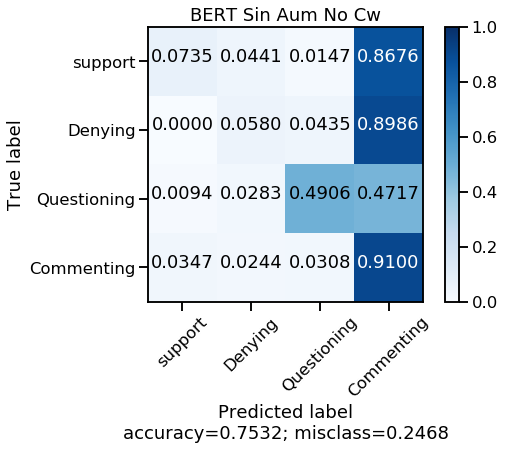

Test_ acc: 0.7531831537708129
Test_ f1 none: [0.0990099  0.08163265 0.55913978 0.85455643]
Test_ f1 macro: 0.3985846915689434
Encoder Layer Attention head 0


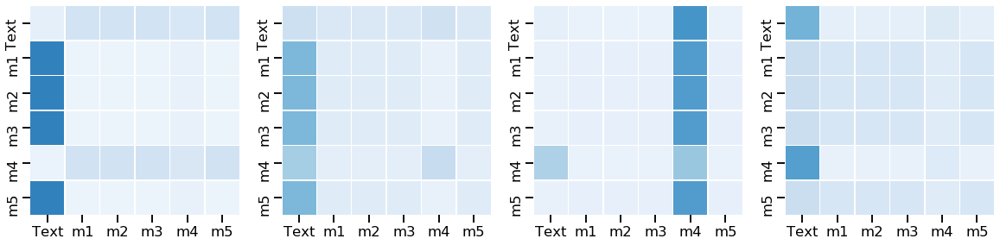

Encoder Layer Attention head 1


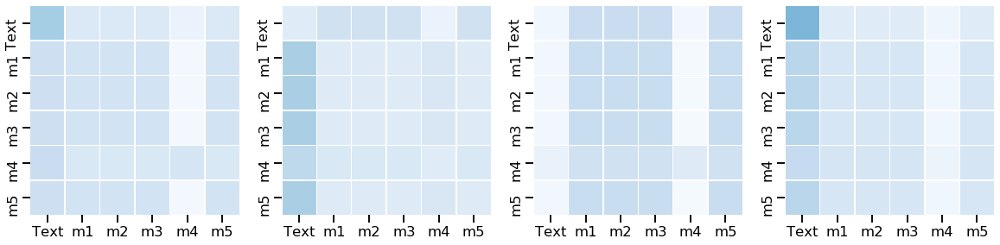

Entrenando Run # 2
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.1736, dtype=torch.float64) 	F-macro_val: tensor(0.1688, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.6840, dtype=torch.float64) 	F-macro_val: tensor(0.4216, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.6910, dtype=torch.float64) 	F-macro_val: tensor(0.4645, dtype=torch.float64)
Epoch 30 	acc_val: tensor(0.6910, dtype=torch.float64) 	F-macro_val: tensor(0.4711, dtype=torch.float64)
Epoch 40 	acc_val: tensor(0.6979, dtype=torch.float64) 	F-macro_val: tensor(0.5024, dtype=torch.float64)
Epoch 50 	acc_val: tensor(0.7118, dtype=torch.float64) 	F-macro_val: tensor(0.5104, dtype=torch.float64)
Epoch 60 	acc_val: tensor(0.6944, dtype=torch.float64) 	F-macro_val: tensor(0.4852, dtype=torch.float64)
Epoch 70 	acc_val: tensor(0.7153, dtype=torch.float64) 	F-macro_val: tensor(0.5359, dtype=torch.float64)
Testing run # 2
SE TUVIE

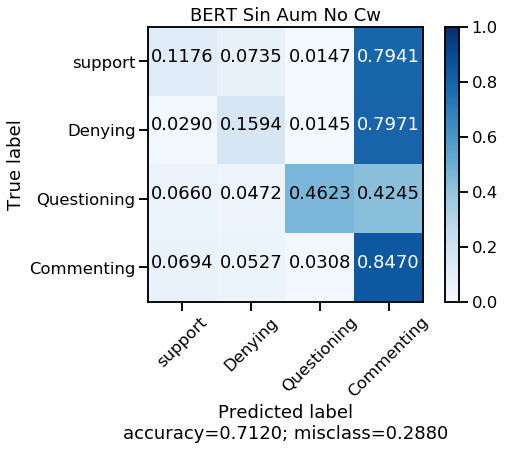

Test_ acc: 0.7120470127326151
Test_ f1 none: [0.11510791 0.16793893 0.54143646 0.82840981]
Test_ f1 macro: 0.41322327855229096
Encoder Layer Attention head 0


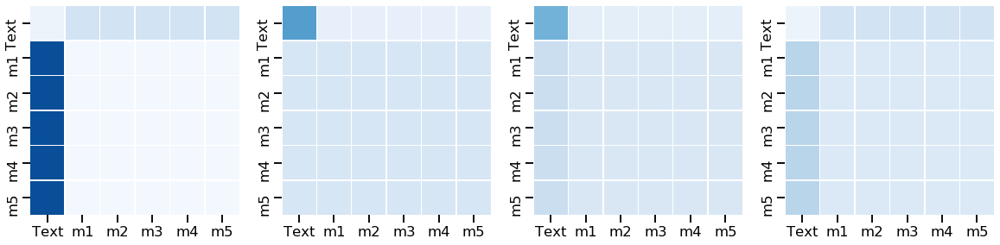

Encoder Layer Attention head 1


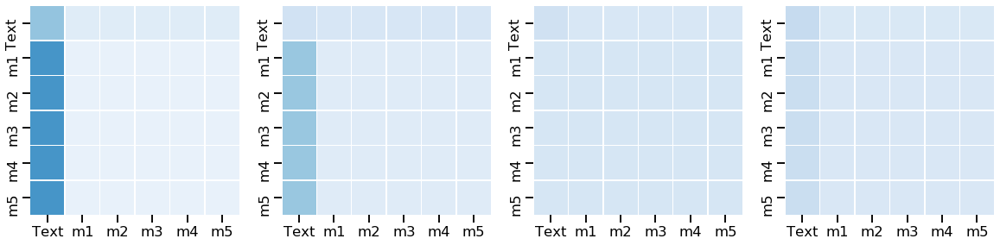

Entrenando Run # 3
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.5347, dtype=torch.float64) 	F-macro_val: tensor(0.2488, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.6319, dtype=torch.float64) 	F-macro_val: tensor(0.2212, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.6701, dtype=torch.float64) 	F-macro_val: tensor(0.4059, dtype=torch.float64)
Epoch 30 	acc_val: tensor(0.7188, dtype=torch.float64) 	F-macro_val: tensor(0.5261, dtype=torch.float64)
Epoch 40 	acc_val: tensor(0.7188, dtype=torch.float64) 	F-macro_val: tensor(0.5212, dtype=torch.float64)
Epoch 50 	acc_val: tensor(0.7257, dtype=torch.float64) 	F-macro_val: tensor(0.5622, dtype=torch.float64)
Epoch 60 	acc_val: tensor(0.7292, dtype=torch.float64) 	F-macro_val: tensor(0.5694, dtype=torch.float64)
Epoch 70 	acc_val: tensor(0.7396, dtype=torch.float64) 	F-macro_val: tensor(0.6214, dtype=torch.float64)
Testing run # 3
SE TUVIE

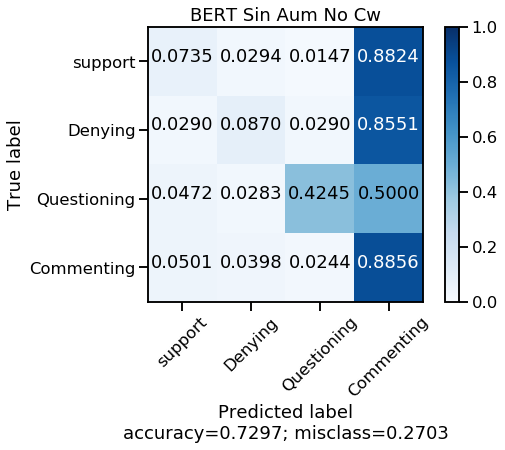

Test_ acc: 0.7296767874632712
Test_ f1 none: [0.08403361 0.10810811 0.52023121 0.84075656]
Test_ f1 macro: 0.3882823735759207
Encoder Layer Attention head 0


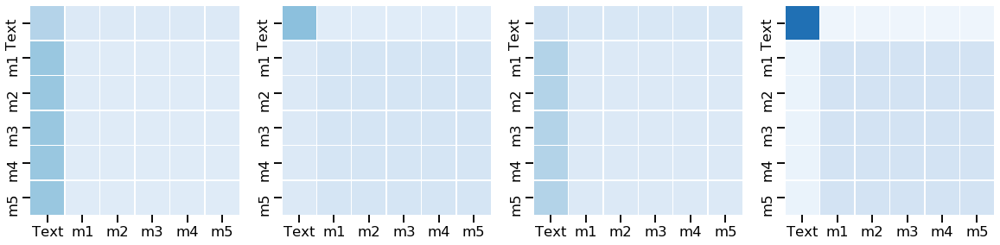

Encoder Layer Attention head 1


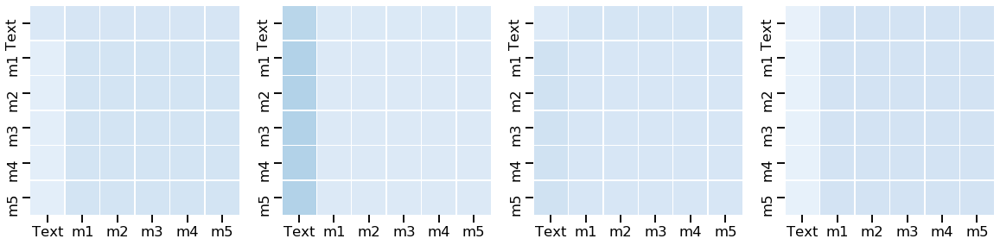

Entrenando Run # 4
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.1910, dtype=torch.float64) 	F-macro_val: tensor(0.1429, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.7118, dtype=torch.float64) 	F-macro_val: tensor(0.4600, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.7049, dtype=torch.float64) 	F-macro_val: tensor(0.4411, dtype=torch.float64)
Epoch 30 	acc_val: tensor(0.7014, dtype=torch.float64) 	F-macro_val: tensor(0.4646, dtype=torch.float64)
Epoch 40 	acc_val: tensor(0.7049, dtype=torch.float64) 	F-macro_val: tensor(0.4510, dtype=torch.float64)
Epoch 50 	acc_val: tensor(0.7049, dtype=torch.float64) 	F-macro_val: tensor(0.4627, dtype=torch.float64)
Epoch 60 	acc_val: tensor(0.7083, dtype=torch.float64) 	F-macro_val: tensor(0.4385, dtype=torch.float64)
Epoch 70 	acc_val: tensor(0.7083, dtype=torch.float64) 	F-macro_val: tensor(0.4823, dtype=torch.float64)
Testing run # 4
SE TUVIE

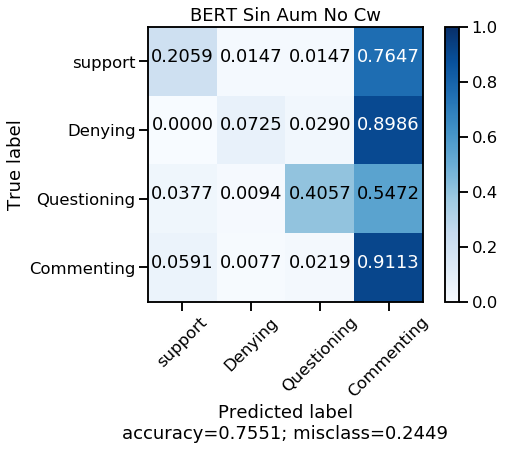

Test_ acc: 0.7551420176297747
Test_ f1 none: [0.21212121 0.12195122 0.50887574 0.85473177]
Test_ f1 macro: 0.4244199843506372
Encoder Layer Attention head 0


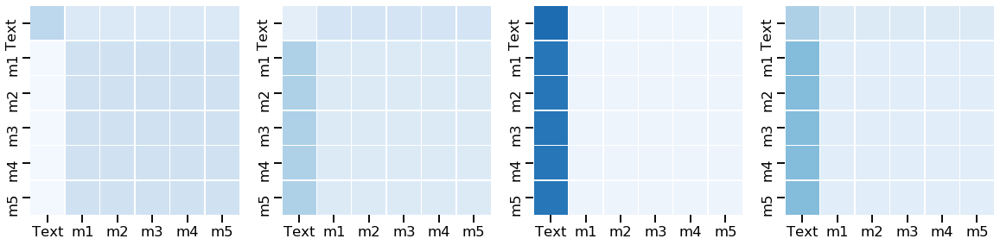

Encoder Layer Attention head 1


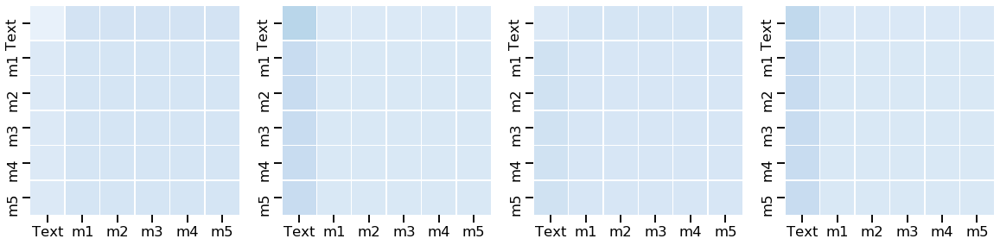

Entrenando Run # 5
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.4792, dtype=torch.float64) 	F-macro_val: tensor(0.2583, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.6979, dtype=torch.float64) 	F-macro_val: tensor(0.3946, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.7118, dtype=torch.float64) 	F-macro_val: tensor(0.4413, dtype=torch.float64)
Epoch 30 	acc_val: tensor(0.7049, dtype=torch.float64) 	F-macro_val: tensor(0.4536, dtype=torch.float64)
Epoch 40 	acc_val: tensor(0.7083, dtype=torch.float64) 	F-macro_val: tensor(0.4292, dtype=torch.float64)
Epoch 50 	acc_val: tensor(0.7188, dtype=torch.float64) 	F-macro_val: tensor(0.4987, dtype=torch.float64)
Epoch 60 	acc_val: tensor(0.7257, dtype=torch.float64) 	F-macro_val: tensor(0.4732, dtype=torch.float64)
Epoch 70 	acc_val: tensor(0.7083, dtype=torch.float64) 	F-macro_val: tensor(0.4696, dtype=torch.float64)
Testing run # 5
SE TUVIE

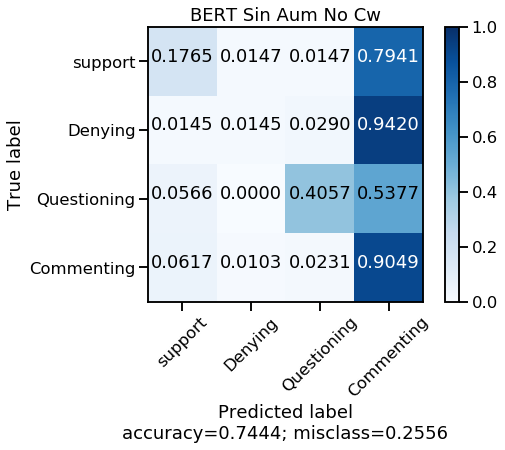

Test_ acc: 0.7443682664054848
Test_ f1 none: [0.17777778 0.02531646 0.50588235 0.84921592]
Test_ f1 macro: 0.38954812730342736
Encoder Layer Attention head 0


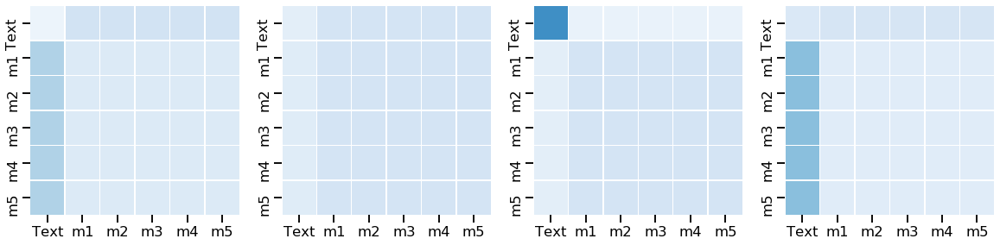

Encoder Layer Attention head 1


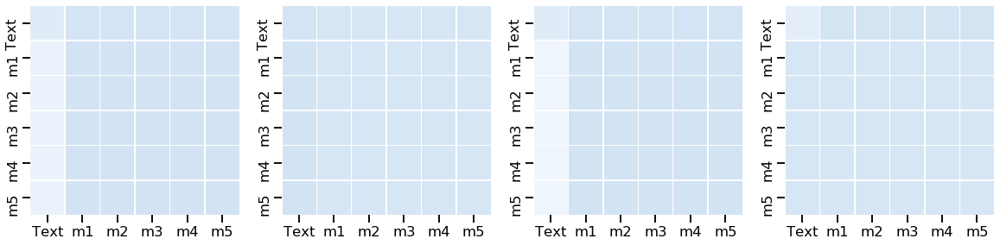

In [13]:
global_accs=[]
global_fnones=[]
global_fmacros=[]
global_cms=[]
global_attn=[]
dict_attn_enc={'00':[], '01':[], '02':[], '03':[], '10':[], '11':[], '12':[], '13':[]}
  
prob=0.0

for trans in range(1,6): 
    print ("Entrenando Run #", trans)
    cnn1 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'/cnn1_'+str(trans)+'-exec.h5')
    cnn2 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'/cnn2_'+str(trans)+'-exec.h5')
    rnn1 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'/rnn1_'+str(trans)+'-exec.h5')
    rnn2 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'/rnn2_'+str(trans)+'-exec.h5')
    rnn3 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'/rnn3_'+str(trans)+'-exec.h5')

    list_models=['cnn1', 'cnn2', 'rnn1', 'rnn2', 'rnn3']
    index_models=np.arange(5)
    dict_models=dict((key, value) for (key, value) in zip(index_models,list_models))
    modelos=[cnn1, cnn2, rnn1, rnn2, rnn3]
    ind=np.arange(5)
    dict_trainedModel=dict((key, value) for (key, value) in zip(ind,modelos))

    bs=32
    b_dim=768
    predicciones_all=[]
    predicciones_all_val=[]
    predicciones_all_test=[]
    
    print ("agregando predicciones Train")
    for i in dict_trainedModel.keys(): 
        a_evaluar=dict_models[i]
        predicciones_all.append(dict_trainedModel[i].predict(x_train, batch_size=bs))
    print ("agregando predicciones Val")
    for i in dict_trainedModel.keys(): 
        a_evaluar=dict_models[i]
        predicciones_all_val.append(dict_trainedModel[i].predict(x_val, batch_size=bs))
    print ("agregando predicciones Test")
    for i in dict_trainedModel.keys(): 
        a_evaluar=dict_models[i]
        predicciones_all_test.append(dict_trainedModel[i].predict(x_test, batch_size=bs))

    matrix=np.asarray(predicciones_all)
    matrix_val=np.asarray(predicciones_all_val)
    matrix_test=np.asarray(predicciones_all_test)
    new_matrix=np.concatenate([matrix,matrix_val,matrix_test], axis=1)
    
    
    espacio=[np.ones(b_dim)]
    #Ks=np.load("../../BERTransformer/Orthogonals_768.npy")
    
    espacio=[np.ones(b_dim)]
    Ks= ortho_group.rvs(dim=b_dim)
    random=np.random.randint(Ks.shape[0], size=4)
    K_list=Ks[random]
    K_list_ext=espacio+list(K_list)
    index_embeddings=[0,1,2,3,4]
    lab_str_embeddings=['','','','','']

    for i in range(len(sentences)):
        #ide=ids_train[i]
        tw_tr=tws_train[i]
        clase=dict_cl[labels_train[i]]
        encoded_tok, sentence_valid = my_tokenizer(cleaner(tw_tr)[1])  #cleaner: raw, no cleaner:augmented version
                
        final=' '
        frase=[final.join(sentence_valid)]
        try: 
            vector= bc.encode(frase)[0]  
            #norm=np.linalg.norm(vector)
            final_bert= vector #/ norm
        except: 
            final_bert= np.zeros(b_dim)
            
        index_embeddings.append(i+5)
        lab_str_embeddings.append(clase)
        K_list_ext.append(final_bert)
    
    objs_val=val['Tw_id']      #df_val['Unnamed: 0'].values
    objs_test=test['Tw_id']    #np.arange(df_test.shape[0])
    lab_val=val['Label']
    lab_test=test['Label']
    tw_val=val['Tweet']
    tw_test=test['Tweet']
    llaves=np.concatenate([objs_val,objs_test])
    clases=np.concatenate([lab_val,lab_test])
    sent_all=np.concatenate([tw_val,tw_test])
      
    for num in range(len(llaves)):
        i=llaves[num]
        clase=clases[num]
        tw_tr=sent_all[num]
        #vector=np.load("../BaS_Original/Original/"+str(i)+".npy")
        encoded_tok, tokens_valid =my_tokenizer(cleaner(tw_tr)[1])
    
        final=' '
        frase=[final.join(tokens_valid)]
        try: 
            vector= bc.encode(frase)[0]    
            #norm=np.linalg.norm(vector)
            final_bert= vector #/ norm
        except: 
            final_bert= np.zeros(b_dim)

        index_embeddings.append(num+5+train.shape[0])
        lab_str_embeddings.append(clase)
        K_list_ext.append(final_bert)

    K_list_new= np.asarray(K_list_ext, dtype='float32')
    
    ###################################### TRANSFORMER ###############################
    V = 4
    pesos = torch.from_numpy(class_weights).float()
    criterion = FocalLoss(weights=pesos)
    model = make_model_concat(4, N=2,d_model=b_dim, d_ff=128, h=4, dropout=0.35)
    model_opt = NoamOpt(model.src_embed[0].d_model, 1, 6000, torch.optim.Adam(model.parameters(), lr=0, betas=(0.9, 0.98), eps=1e-5))

    
    for epoch in range(75):
        model.train()
        DATA=data_gen(bs, 'Train', 5, new_matrix)
        loss_train, acc_train,fma_train, f_none, cm_train=run_epoch(DATA, model, SimpleLossComputeFL(criterion, model_opt), 'Train')
        
        model.eval()
        loss_val, acc_val,fma_val, f_val_none, cm_val=run_epoch(data_gen(bs, 'Val', 5, new_matrix), model, SimpleLossComputeFL(criterion, None),'Val')
        if epoch%10==0:
            print ("Epoch",epoch, "\tacc_val:",acc_val, "\tF-macro_val:",fma_val)
    
    model.eval()
    print ("Testing run #",trans)
    predicciones = run_epoch(data_gen(bs, 'Test', 5, new_matrix), model, SimpleLossComputeFL(criterion, None),'Test')
    predicciones=np.concatenate(predicciones, axis=-1)
    
    glo_acc=accuracy_score(etiq_t, predicciones[:-3])
    glo_fno=f1_score(etiq_t,predicciones[:-3], average=None)
    glo_fma=f1_score(etiq_t,predicciones[:-3], average='macro')

    glo_cm=confusion_matrix(etiq_t, predicciones[:-3])

    plot_confusion_matrix(glo_cm,["support","Denying","Questioning","Commenting"],"BERT Sin Aum No Cw")
    global_accs.append(glo_acc)
    global_fnones.append(glo_fno)
    global_fmacros.append(glo_fma)
    global_cms.append(glo_cm)
    print("Test_ acc:",glo_acc) 
    print("Test_ f1 none:",glo_fno) 
    print("Test_ f1 macro:",glo_fma) 

    label=[['Text', 'm1', 'm2','m3','m4','m5']]
    for layer in range(2):
        fig, axs = plt.subplots(1,4, figsize=(20, 10))
        print ("Encoder Layer Attention head", layer)
        for head in range(4):
            matriz_attn=model.encoder.layers[layer].self_attn.attn[0,head].data
            dict_attn_enc[str(layer)+str(head)].append(matriz_attn)
            sns.heatmap(matriz_attn, xticklabels=label[0], yticklabels=label[0],
                        vmin=0.0, vmax=1.0, linewidths=.5, cmap="Blues", cbar=False, square=True, ax=axs[head]) #, annot=False,cbar_kws={"orientation": "horizontal","pad": 0.25})
        plt.show()

In [14]:
print ("Acc:",np.mean(np.asarray(global_accs)))
print ("F-score:", np.mean(np.asarray(global_fmacros)))
sup=np.mean(np.asarray(global_fnones)[:,0])
den=np.mean(np.asarray(global_fnones)[:,1])
que=np.mean(np.asarray(global_fnones)[:,2])
com=np.mean(np.asarray(global_fnones)[:,3])

print ("(0.0_No CW) S-D-Q-C:", sup,den,que,com)

print ("\n\nConfusion counts")
m_temp=np.zeros((4,4))
for m in global_cms:
    m_temp+=np.asarray(m)
    
m_temp

Acc: 0.7388834476003917
F-score: 0.40281169107024395
(0.0_No CW) S-D-Q-C: 0.13761008360070637 0.10098947353508803 0.5271131110987227 0.8455340960464586


Confusion counts


array([[  44.,   12.,    5.,  279.],
       [   5.,   27.,   10.,  303.],
       [  23.,   12.,  232.,  263.],
       [ 214.,  105.,  102., 3469.]])

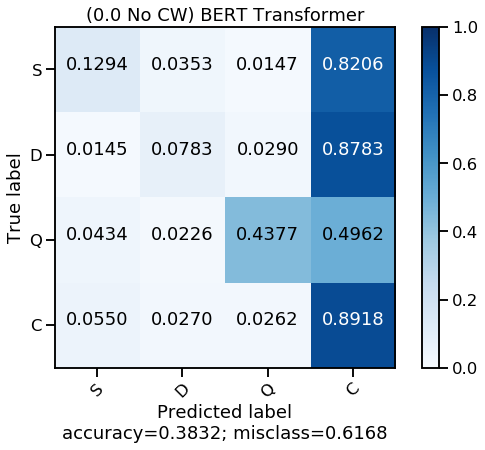

In [15]:
plot_confusion_matrix(normalize(m_temp),["S","D","Q","C"],"(0.0 No CW) BERT Transformer", cmap='Blues')

Encoder Layer Attention head 0


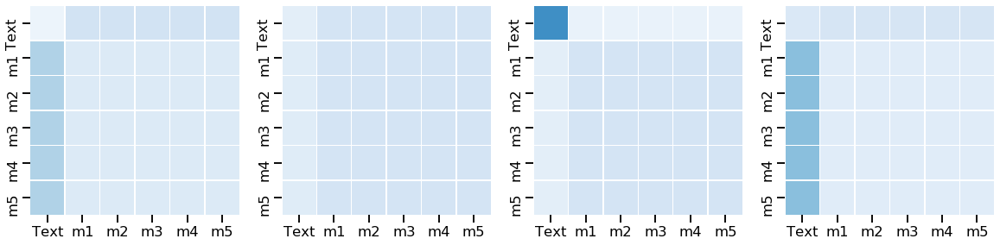

Encoder Layer Attention head 1


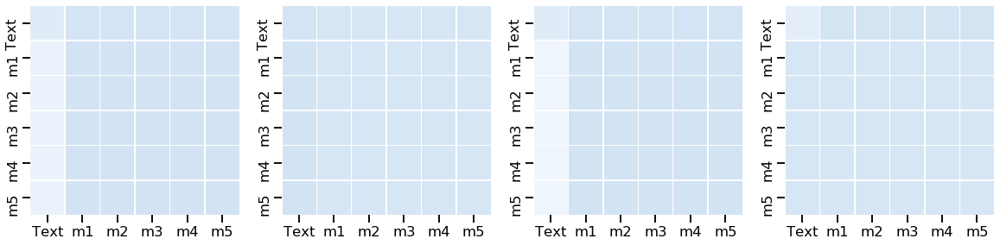

In [16]:
label=[['Text', 'm1', 'm2','m3','m4','m5']]
for layer in range(2):
    fig, axs = plt.subplots(1,4, figsize=(20, 10))
    print ("Encoder Layer Attention head", layer)
    for head in range(4):
        matriz_attn=model.encoder.layers[layer].self_attn.attn[0,head].data
        dict_attn_enc[str(layer)+str(head)].append(matriz_attn)
        sns.heatmap(matriz_attn, xticklabels=label[0], yticklabels=label[0],
                    vmin=0.0, vmax=1.0, linewidths=.5, cmap="Blues", cbar=False, square=True, ax=axs[head]) #, annot=False,cbar_kws={"orientation": "horizontal","pad": 0.25})
    plt.show()

In [17]:
for h in range(2):
    for hy in range(4):
        to_mean=dict_attn_enc[str(h)+str(hy)]
        at=np.zeros((6,6))
        for m in to_mean:
            at+=m.numpy() 
        global_attn.append(at/5.)
        
np.save("Attn_SinAum_BERT_NoCW.npy", global_attn)

In [18]:
np.asarray(global_attn).shape

(8, 6, 6)

### 0.0 Con CW

----------------- ejecucion 1 --------------------
CNN1: [0.19047619 0.19512195 0.6147541  0.74216524] - 0.4356293705554001
CNN2: [0.07407407 0.21917808 0.55414013 0.7003012 ] - 0.38692337211841676
RNN1: [0.1010101  0.19480519 0.29239766 0.30704522] - 0.22381454304914375
RNN2: [0.19318182 0.21449275 0.42615012 0.53068592] - 0.341127653361999
RNN3: [0.14814815 0.         0.60465116 0.86181818] - 0.4036543731892569

TRANSFORMER: [0.14074074 0.22222222 0.53459119 0.06451613] - 0.24051757174094363

----------------- ejecucion 2 --------------------
CNN1: [0.14765101 0.25531915 0.57615894 0.76265146] - 0.4354451392998998
CNN2: [0.19277108 0.23398329 0.625      0.66613799] - 0.42947308924276045
RNN1: [0.17957746 0.21374046 0.46475196 0.33333333] - 0.297850803590469
RNN2: [0.15044248 0.21714286 0.39583333 0.38133874] - 0.28618935268645146
RNN3: [0.26751592 0.         0.50410959 0.78980014] - 0.3903564126109875

TRANSFORMER: [0.16886544 0.23602484 0.52046784 0.4004004 ] - 0.3314396291836019

----------------- ejecucion 3 --------------------
CNN1: [0.15827338 0.2027027  0.63878327 0.80563003] - 0.4513473451923239
CNN2: [0.0862069  0.19230769 0.58608059 0.76539792] - 0.4074982747038588
RNN1: [0.20418848 0.18421053 0.48538012 0.55746141] - 0.3578101328670642
RNN2: [0.21804511 0.2481203  0.53741497 0.64309211] - 0.4116681211958468
RNN3: [0.10526316 0.         0.         0.85665914] - 0.24048057502673162

TRANSFORMER: [0.19271949 0.21495327 0.62121212 0.51412944] - 0.3857535805648854

----------------- ejecucion 4 --------------------
CNN1: [0.16       0.26347305 0.61728395 0.81106613] - 0.46295578284127503
CNN2: [0.02380952 0.20905923 0.55102041 0.73057371] - 0.3786157190970335
RNN1: [0.17391304 0.17085427 0.57142857 0.59221658] - 0.3771031170819785
RNN2: [0.23280423 0.28451883 0.54268293 0.70139969] - 0.4403514192608483
RNN3: [0.21705426 0.         0.         0.84695052] - 0.26600119535062133

TRANSFORMER: [0.15194346 0.2392638  0.56187291 0.1480611 ] - 0.2752853202150871

----------------- ejecucion 5 --------------------
CNN1: [0.16969697 0.20408163 0.60869565 0.79214624] - 0.4436551242267883
CNN2: [0.1221374  0.26190476 0.64573991 0.7729805 ] - 0.4506906445478934
RNN1: [0.21568627 0.18376068 0.46334311 0.43926142] - 0.3255128714070355
RNN2: [0.17886179 0.26086957 0.51298701 0.54273128] - 0.3738624110888325
RNN3: [0.10752688 0.         0.48351648 0.86219081] - 0.36330854448944044

TRANSFORMER: [0.18808777 0.22580645 0.55892256 0.30967742] - 0.32062355104624296



In [12]:
class_weights= compute_class_weight('balanced', np.unique(labels_train), labels_train)

print ("Pesos de clases:", class_weights)
#print ("Pesos de clases:", class_weights)

Pesos de clases: [1.25980975 3.18168168 3.21060606 0.38752743]




ENTRENANDO CON MINI BATCH  32 


Entrenando Run # 1
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	None: [0.16489456 0.10213244 0.01851852 0.37602129] 	F-ma: 0.1653917013812512
Epoch 10 	None: [0.43650761 0.1465553  0.64188713 0.35760657] 	F-ma: 0.39563915131407695
Epoch 20 	None: [0.4688762  0.12972583 0.63712522 0.41455812] 	F-ma: 0.412571342046765
Epoch 30 	None: [0.50963818 0.1984127  0.55911681 0.63638916] 	F-ma: 0.4758892118719344
Epoch 40 	None: [0.51731575 0.17460317 0.66251804 0.63608212] 	F-ma: 0.4976297707697779
Epoch 50 	None: [0.52392443 0.14285714 0.62604618 0.65284511] 	F-ma: 0.4864182138487694
Epoch 60 	None: [0.54375236 0.27777778 0.6367583  0.65145374] 	F-ma: 0.5274355440676626
Epoch 70 	None: [0.55108255 0.16666667 0.58226311 0.63052919] 	F-ma: 0.4826353772324705
Testing run # 1
SE TUVIERON QUE REPETIR 3 EJEMPLOS


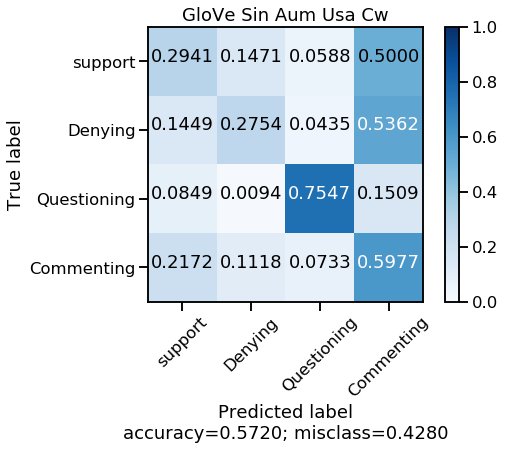

Test_ acc: 0.5719882468168462
Test_ f1 none: [0.14492754 0.20430108 0.64       0.69924812]
Test_ f1 macro: 0.42211918295036327


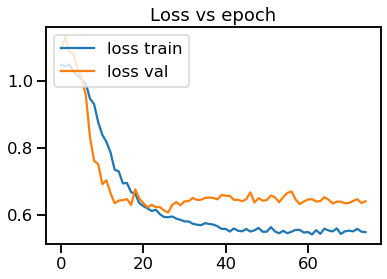

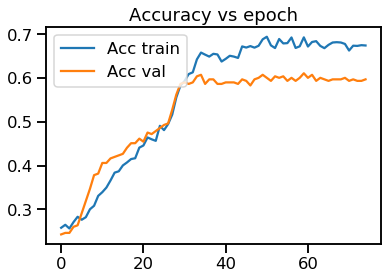

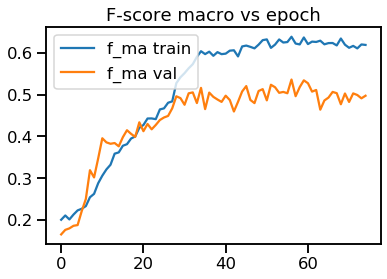

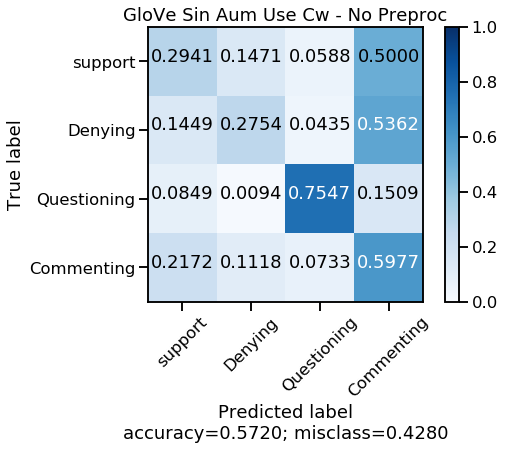

Test_ acc: 0.5719882468168462
Test_ f1 none: [0.14492754 0.20430108 0.64       0.69924812]
Test_ f1 macro: 0.42211918295036327
Encoder Layer Attention head 0
Encoder Layer Attention head 1
Entrenando Run # 2
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	None: [0.12435867 0.04444444 0.03174603 0.50142724] 	F-ma: 0.1754940943613403
Epoch 10 	None: [0.1627584  0.21322751 0.04487179 0.50726044] 	F-ma: 0.2320295369045284
Epoch 20 	None: [0.54956494 0.15952381 0.60482604 0.70932638] 	F-ma: 0.505810292117791
Epoch 30 	None: [0.55305379 0.11111111 0.65529101 0.67091003] 	F-ma: 0.49759148341123954
Epoch 40 	None: [0.53503296 0.12830688 0.75070547 0.65944658] 	F-ma: 0.5183729727201765
Epoch 50 	None: [0.54020082 0.13227513 0.670194   0.67198016] 	F-ma: 0.5036625286992744
Epoch 60 	None: [0.52944832 0.20582011 0.63152033 0.64603018] 	F-ma: 0.5032047348459991
Epoch 70 	None: [0.54695755 0.12557319 0.63054353 0.6550031

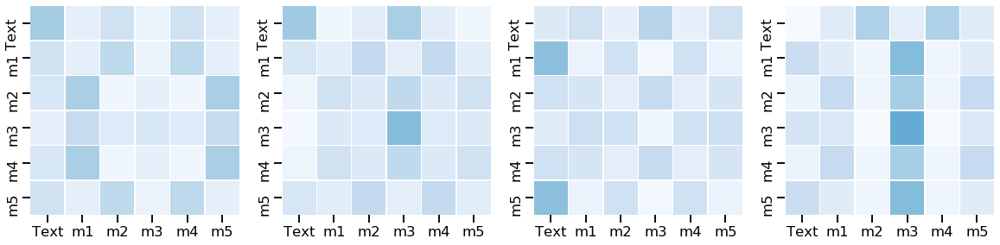

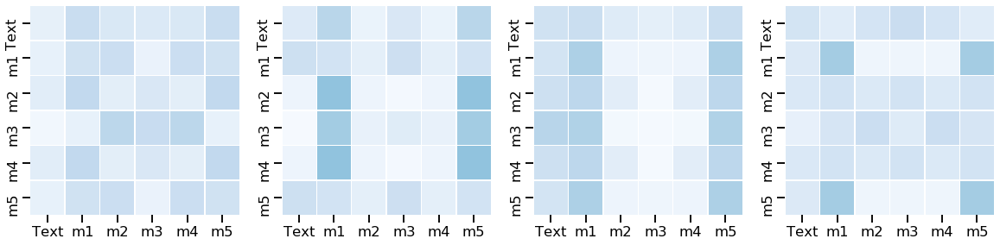

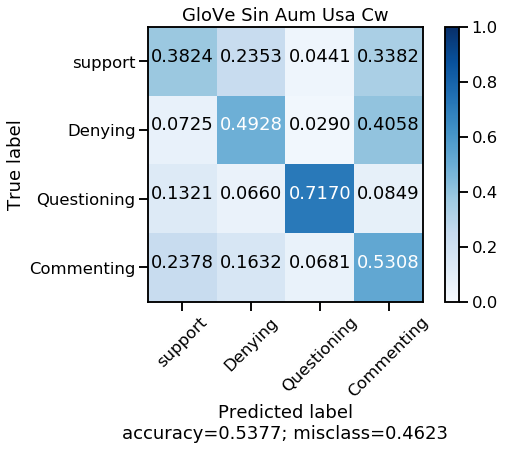

Test_ acc: 0.5377081292850147
Test_ f1 none: [0.17449664 0.2687747  0.63333333 0.66027178]
Test_ f1 macro: 0.4342191159399721


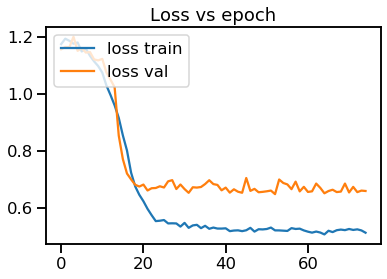

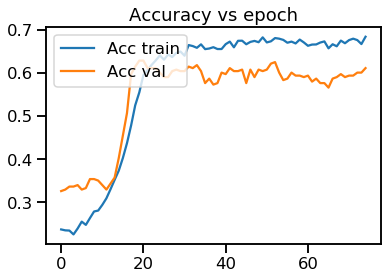

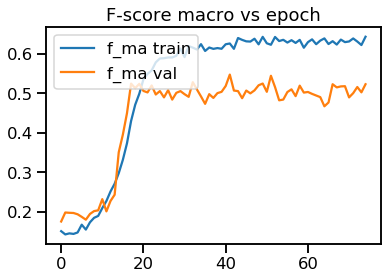

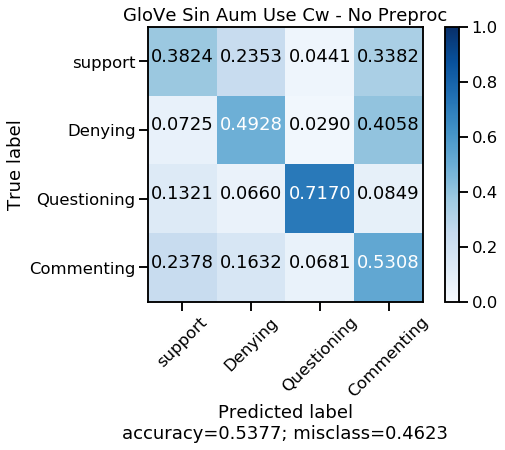

Test_ acc: 0.5377081292850147
Test_ f1 none: [0.17449664 0.2687747  0.63333333 0.66027178]
Test_ f1 macro: 0.4342191159399721
Encoder Layer Attention head 0
Encoder Layer Attention head 1
Entrenando Run # 3
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	None: [0.36930446 0.02222222 0.04950142 0.60176741] 	F-ma: 0.2606988802192078
Epoch 10 	None: [0.61977035 0.11111111 0.48700374 0.68838745] 	F-ma: 0.47656816199201263
Epoch 20 	None: [0.55918728 0.25       0.67407407 0.63452544] 	F-ma: 0.5294466978023864
Epoch 30 	None: [0.56880231 0.20740741 0.69911817 0.63923587] 	F-ma: 0.5286409375656688
Epoch 40 	None: [0.55977188 0.22962963 0.72380952 0.64619786] 	F-ma: 0.53985222500392
Epoch 50 	None: [0.55720993 0.32222222 0.72120472 0.61769436] 	F-ma: 0.5545828074584652
Epoch 60 	None: [0.56394158 0.29259259 0.6428293  0.62434219] 	F-ma: 0.5309264140776266
Epoch 70 	None: [0.56132275 0.21296296 0.70061728 0.61430791]

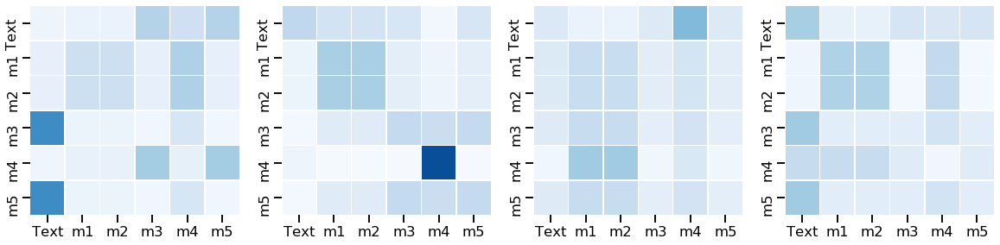

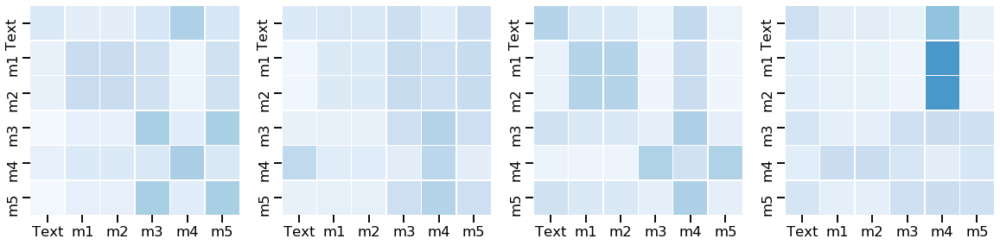

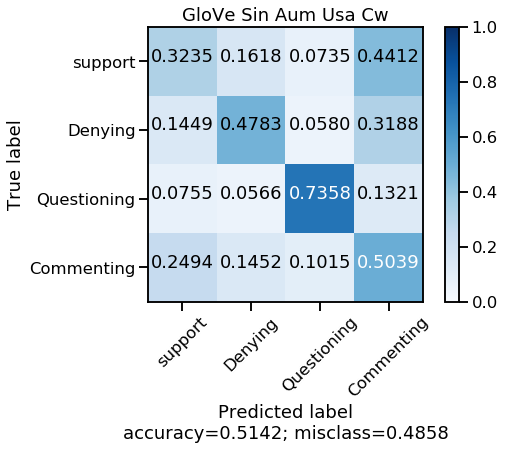

Test_ acc: 0.5142017629774731
Test_ f1 none: [0.14569536 0.28448276 0.57352941 0.63430421]
Test_ f1 macro: 0.4095029354358868


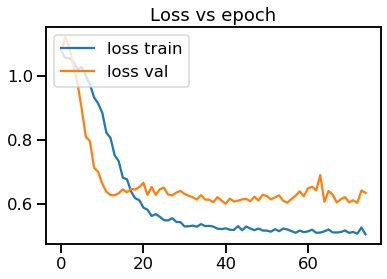

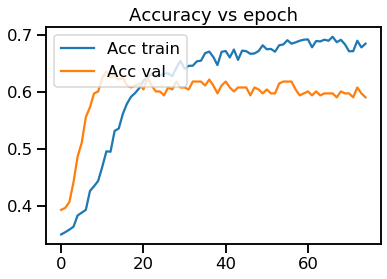

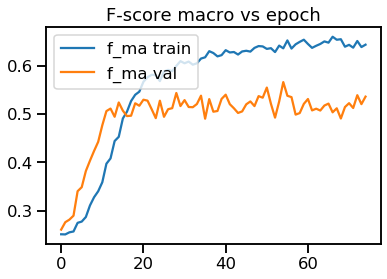

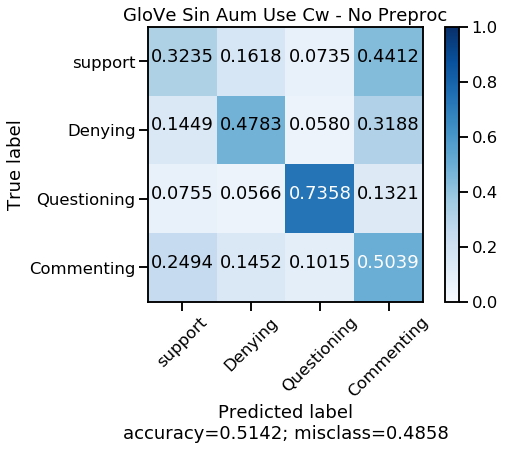

Test_ acc: 0.5142017629774731
Test_ f1 none: [0.14569536 0.28448276 0.57352941 0.63430421]
Test_ f1 macro: 0.4095029354358868
Encoder Layer Attention head 0
Encoder Layer Attention head 1
Entrenando Run # 4
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	None: [0.11835017 0.08790242 0.03174603 0.2613365 ] 	F-ma: 0.12483377888197407
Epoch 10 	None: [0.36089384 0.17400192 0.64500561 0.24178784] 	F-ma: 0.3554223045506538
Epoch 20 	None: [0.45975395 0.22962963 0.68580247 0.28659268] 	F-ma: 0.4154446827704885
Epoch 30 	None: [0.49789078 0.17946128 0.6456229  0.45462755] 	F-ma: 0.44440062608894865
Epoch 40 	None: [0.52313871 0.25555556 0.59102934 0.57860183] 	F-ma: 0.48708135910455436
Epoch 50 	None: [0.53376891 0.22486772 0.65458554 0.5684533 ] 	F-ma: 0.49541886646771705
Epoch 60 	None: [0.50581534 0.24814815 0.61904762 0.56789669] 	F-ma: 0.4852269475189377
Epoch 70 	None: [0.52536658 0.25555556 0.70893058 0.5693

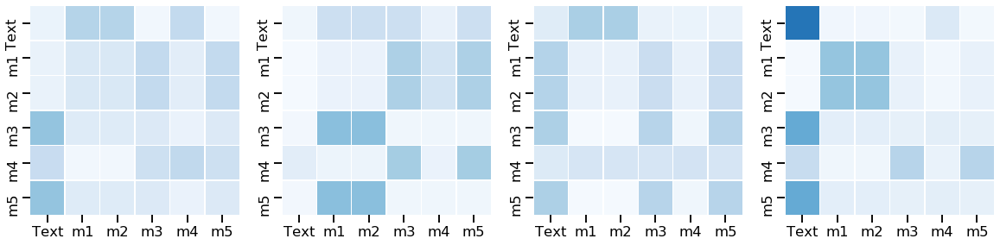

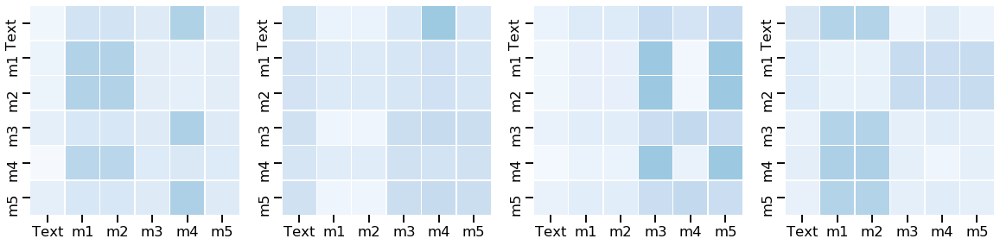

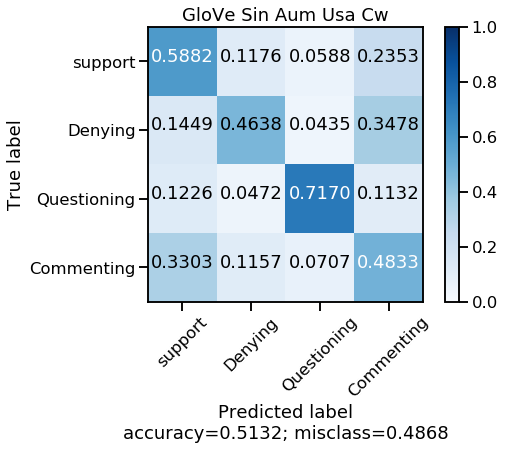

Test_ acc: 0.5132223310479922
Test_ f1 none: [0.20618557 0.31372549 0.62295082 0.62354892]
Test_ f1 macro: 0.4416026997337259


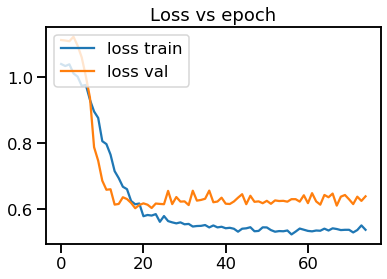

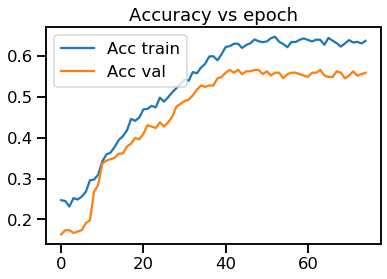

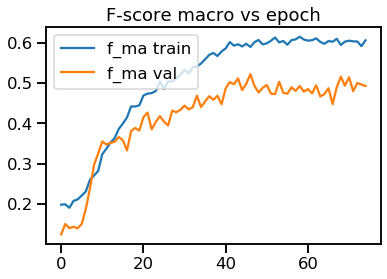

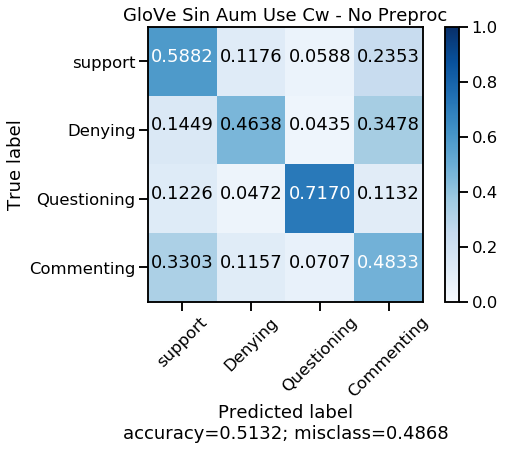

Test_ acc: 0.5132223310479922
Test_ f1 none: [0.20618557 0.31372549 0.62295082 0.62354892]
Test_ f1 macro: 0.4416026997337259
Encoder Layer Attention head 0
Encoder Layer Attention head 1
Entrenando Run # 5
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	None: [0.03931624 0.06666667 0.05018538 0.53545867] 	F-ma: 0.17290673726731753
Epoch 10 	None: [0.49677781 0.04444444 0.32849928 0.67887165] 	F-ma: 0.3871482934882795
Epoch 20 	None: [0.5389803  0.21851852 0.71111111 0.68274564] 	F-ma: 0.5378388919734034
Epoch 30 	None: [0.56388753 0.17037037 0.6984127  0.67798537] 	F-ma: 0.5276639938710725
Epoch 40 	None: [0.55972038 0.2037037  0.64071299 0.67114075] 	F-ma: 0.518819457674414
Epoch 50 	None: [0.55442855 0.13703704 0.74439634 0.67929307] 	F-ma: 0.5287887498630923
Epoch 60 	None: [0.5577826  0.3        0.69708995 0.67702679] 	F-ma: 0.557974834822745
Epoch 70 	None: [0.53630943 0.23703704 0.69891068 0.67864477]

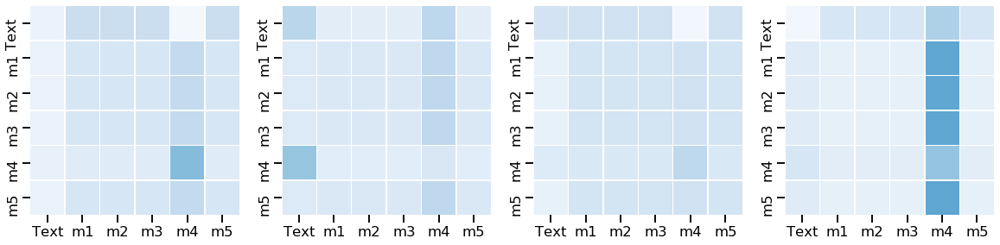

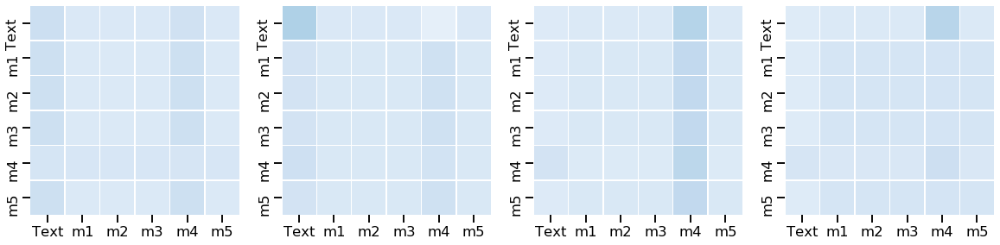

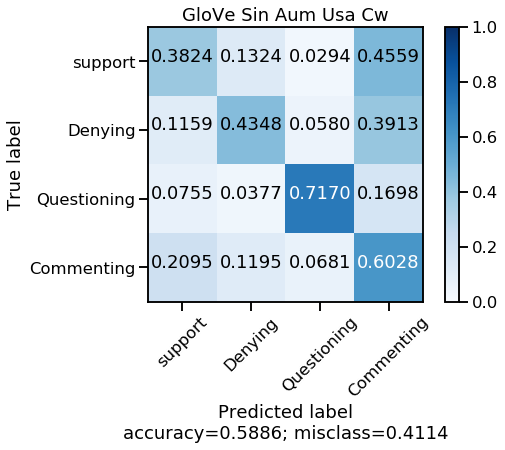

Test_ acc: 0.5886385896180215
Test_ f1 none: [0.19047619 0.29268293 0.63070539 0.70899471]
Test_ f1 macro: 0.4557148051227598


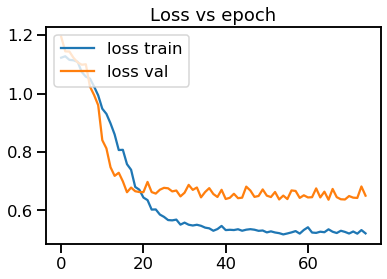

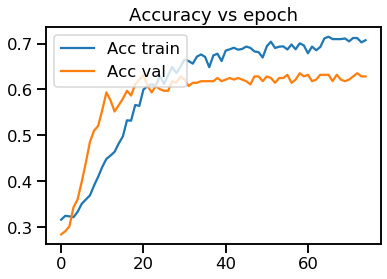

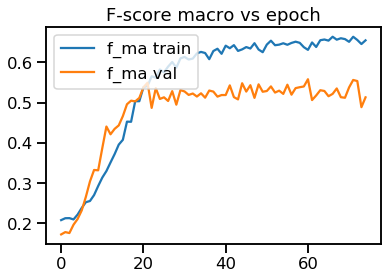

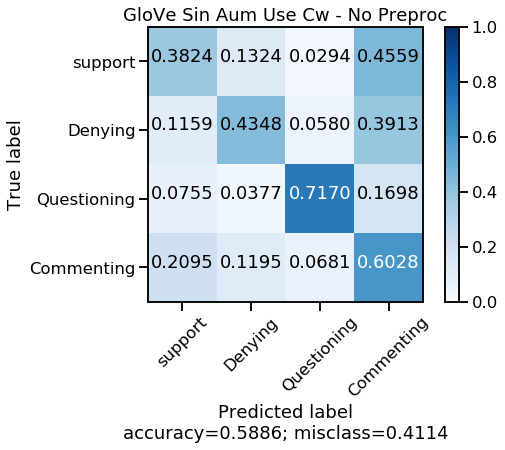

Test_ acc: 0.5886385896180215
Test_ f1 none: [0.19047619 0.29268293 0.63070539 0.70899471]
Test_ f1 macro: 0.4557148051227598
Encoder Layer Attention head 0
Encoder Layer Attention head 1


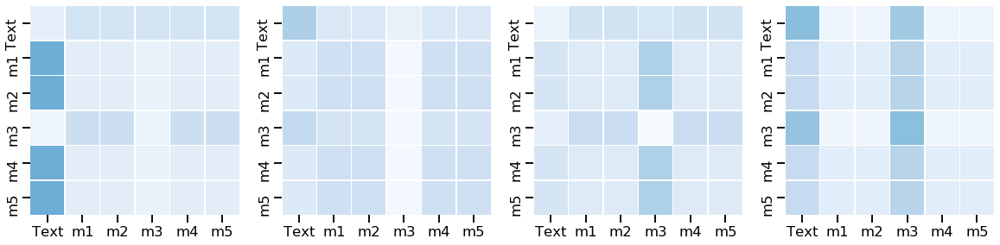

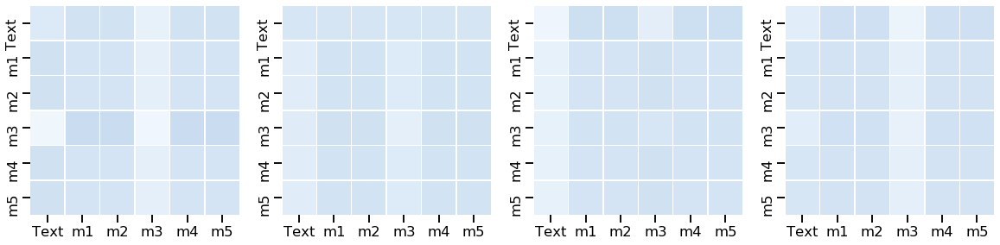

In [15]:
bs=32
print ("\n\nENTRENANDO CON MINI BATCH ", bs, "\n\n")
global_accs=[]
global_fnones=[]
global_fmacros=[]
global_cms=[]
global_attn=[]
dict_attn_enc={'00':[], '01':[], '02':[], '03':[], '10':[], '11':[], '12':[], '13':[]}

prob=0.0

for trans in range(1,6): 
    print ("Entrenando Run #", trans)
    cnn1 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'_cw/cnn1_'+str(trans)+'-exec.h5')
    cnn2 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'_cw/cnn2_'+str(trans)+'-exec.h5')
    rnn1 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'_cw/rnn1_'+str(trans)+'-exec.h5')
    rnn2 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'_cw/rnn2_'+str(trans)+'-exec.h5')
    rnn3 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'_cw/rnn3_'+str(trans)+'-exec.h5')

    list_models=['cnn1', 'cnn2', 'rnn1', 'rnn2', 'rnn3']
    index_models=np.arange(5)
    dict_models=dict((key, value) for (key, value) in zip(index_models,list_models))
    modelos=[cnn1, cnn2, rnn1, rnn2, rnn3]
    ind=np.arange(5)
    dict_trainedModel=dict((key, value) for (key, value) in zip(ind,modelos))

    #bs=64
    b_dim=768

    predicciones_all=[]
    predicciones_all_val=[]
    predicciones_all_test=[]

    print ("agregando predicciones Train")
    for i in dict_trainedModel.keys(): 
        a_evaluar=dict_models[i]
        predicciones_all.append(dict_trainedModel[i].predict(x_train, batch_size=bs))
    print ("agregando predicciones Val")
    for i in dict_trainedModel.keys(): 
        a_evaluar=dict_models[i]
        predicciones_all_val.append(dict_trainedModel[i].predict(x_val, batch_size=bs))
    print ("agregando predicciones Test")
    for i in dict_trainedModel.keys(): 
        a_evaluar=dict_models[i]
        predicciones_all_test.append(dict_trainedModel[i].predict(x_test, batch_size=bs))

    matrix=np.asarray(predicciones_all)
    matrix_val=np.asarray(predicciones_all_val)
    matrix_test=np.asarray(predicciones_all_test)
    new_matrix=np.concatenate([matrix,matrix_val,matrix_test], axis=1)


    espacio=[np.ones(b_dim)]
    #Ks=np.load("../../BERTransformer/Orthogonals_768.npy")

    espacio=[np.ones(b_dim)]
    Ks= ortho_group.rvs(dim=b_dim)
    random=np.random.randint(Ks.shape[0], size=4)
    K_list=Ks[random]
    K_list_ext=espacio+list(K_list)
    index_embeddings=[0,1,2,3,4]
    lab_str_embeddings=['','','','','']

    for i in range(len(sentences)):
        #ide=ids_train[i]
        tw_tr=tws_train[i]
        clase=dict_cl[labels_train[i]]
        final_bert= bc.encode([tw_tr])[0]
        """encoded_tok, sentence_valid = my_tokenizer(cleaner(tw_tr)[1])  #cleaner: raw, no cleaner:augmented version

        final=' '
        frase=[final.join(sentence_valid)]
        try: 
            vector= bc.encode(frase)[0]  
            #norm=np.linalg.norm(vector)
            final_bert= vector #/ norm
        except: 
            final_bert= np.zeros(b_dim)
        """
        index_embeddings.append(i+5)
        lab_str_embeddings.append(clase)
        K_list_ext.append(final_bert)

    objs_val=val['Tw_id']      #df_val['Unnamed: 0'].values
    objs_test=test['Tw_id']    #np.arange(df_test.shape[0])
    lab_val=val['Label']
    lab_test=test['Label']
    tw_val=val['Tweet']
    tw_test=test['Tweet']
    llaves=np.concatenate([objs_val,objs_test])
    clases=np.concatenate([lab_val,lab_test])
    sent_all=np.concatenate([tw_val,tw_test])

    for num in range(len(llaves)):
        i=llaves[num]
        clase=clases[num]
        tw_tr=sent_all[num]
        final_bert= bc.encode([tw_tr])[0]
        #vector=np.load("../BaS_Original/Original/"+str(i)+".npy")
        """encoded_tok, tokens_valid =my_tokenizer(cleaner(tw_tr)[1])

        final=' '
        frase=[final.join(tokens_valid)]
        try: 
            vector= bc.encode(frase)[0]    
            #norm=np.linalg.norm(vector)
            final_bert= vector #/ norm
        except: 
            final_bert= np.zeros(b_dim)
        """
        index_embeddings.append(num+5+train.shape[0])
        lab_str_embeddings.append(clase)
        K_list_ext.append(final_bert)

    K_list_new= np.asarray(K_list_ext, dtype='float32')

    ###################################### TRANSFORMER ###############################
    hist_train_loss=[]
    hist_train_acc=[]
    hist_train_fma=[]
    hist_val_loss=[]
    hist_val_acc=[]
    hist_val_fma=[]
    V = 4
    pesos = torch.from_numpy(class_weights).float()
    criterion = FocalLoss(weights=pesos)
    model = make_model_concat(4, N=2,d_model=b_dim, d_ff=128, h=4, dropout=0.35)
    model_opt = NoamOpt(model.src_embed[0].d_model, 1, 6000, torch.optim.Adam(model.parameters(), lr=0, betas=(0.9, 0.98), eps=1e-5))

    for epoch in range(75):
        model.train()
        DATA=data_gen(bs, 'Train', 5, new_matrix)
        loss_train, acc_train,fma_train, f_none, cm_train=run_epoch(DATA, model, SimpleLossComputeFL(criterion, model_opt), 'Train')
        hist_train_loss.append(loss_train)
        hist_train_acc.append(acc_train)
        hist_train_fma.append(fma_train)

        model.eval()
        loss_val, acc_val,fma_val, f_val_none, cm_val=run_epoch(data_gen(bs, 'Val', 5, new_matrix), model, SimpleLossComputeFL(criterion, None),'Val')
        if epoch%10==0:
            print ("Epoch",epoch, "\tNone:",f_val_none.numpy(), "\tF-ma:",fma_val.numpy())
        hist_val_loss.append(loss_val)
        hist_val_acc.append(acc_val)
        hist_val_fma.append(fma_val)

    model.eval()
    print ("Testing run #",trans)
    predicciones = run_epoch(data_gen(bs, 'Test', 5, new_matrix), model, SimpleLossComputeFL(criterion, None),'Test')
    predicciones=np.concatenate(predicciones, axis=-1)

    glo_acc=accuracy_score(etiq_t, predicciones[:-3])
    glo_fno=f1_score(etiq_t,predicciones[:-3], average=None)
    glo_fma=f1_score(etiq_t,predicciones[:-3], average='macro')

    glo_cm=confusion_matrix(etiq_t, predicciones[:-3])

    plot_confusion_matrix(glo_cm,["support","Denying","Questioning","Commenting"],"GloVe Sin Aum Usa Cw")
    global_accs.append(glo_acc)
    global_fnones.append(glo_fno)
    global_fmacros.append(glo_fma)
    global_cms.append(glo_cm)
    print("Test_ acc:",glo_acc) 
    print("Test_ f1 none:",glo_fno) 
    print("Test_ f1 macro:",glo_fma) 

    plt.plot(hist_train_loss, label='loss train')
    plt.plot(hist_val_loss,label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch")
    plt.show()

    plt.plot(hist_train_acc, label='Acc train')
    plt.plot(hist_val_acc, label='Acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch")
    plt.show()

    plt.plot(hist_train_fma, label='f_ma train')
    plt.plot(hist_val_fma, label='f_ma val')
    plt.legend(loc='upper left')
    plt.title("F-score macro vs epoch")
    plt.show()
    #"""

    plot_confusion_matrix(glo_cm,["support","Denying","Questioning","Commenting"],"GloVe Sin Aum Use Cw - No Preproc")
    global_accs.append(glo_acc)
    global_fnones.append(glo_fno)
    global_fmacros.append(glo_fma)
    global_cms.append(glo_cm)
    print("Test_ acc:",glo_acc) 
    print("Test_ f1 none:",glo_fno) 
    print("Test_ f1 macro:",glo_fma) 

    label=[['Text', 'm1', 'm2','m3','m4','m5']]
    for layer in range(2):
        fig, axs = plt.subplots(1,4, figsize=(20, 10))
        print ("Encoder Layer Attention head", layer)
        for head in range(4):
            matriz_attn=model.encoder.layers[layer].self_attn.attn[0,head].data
            dict_attn_enc[str(layer)+str(head)].append(matriz_attn)
            sns.heatmap(matriz_attn, xticklabels=label[0], yticklabels=label[0],
                        vmin=0.0, vmax=1.0, linewidths=.5, cmap="Blues", cbar=False, square=True, ax=axs[head]) #, annot=False,cbar_kws={"orientation": "horizontal","pad": 0.25})
        #plt.show()



In [16]:
#CIARP - sin preprocesar para bert as service
print ("Acc:",np.mean(np.asarray(global_accs)))
print ("F-score:", np.mean(np.asarray(global_fmacros)))
sup=np.mean(np.asarray(global_fnones)[:,0])
den=np.mean(np.asarray(global_fnones)[:,1])
que=np.mean(np.asarray(global_fnones)[:,2])
com=np.mean(np.asarray(global_fnones)[:,3])

print ("(0.0_Use CW no preproc) S-D-Q-C:", sup,den,que,com)

print ("\n\nConfusion counts")
m_temp=np.zeros((4,4))
for m in global_cms:
    m_temp+=np.asarray(m)

m_temp

Acc: 0.5451518119490695
F-score: 0.4326317478365416
(0.0_Use CW no preproc) S-D-Q-C: 0.17235626045041927 0.27279339089443316 0.6201037917922083 0.6652735482091054


Confusion counts


array([[ 268.,  108.,   36.,  268.],
       [  86.,  296.,   32.,  276.],
       [ 104.,   46.,  772.,  138.],
       [1936., 1020.,  594., 4230.]])

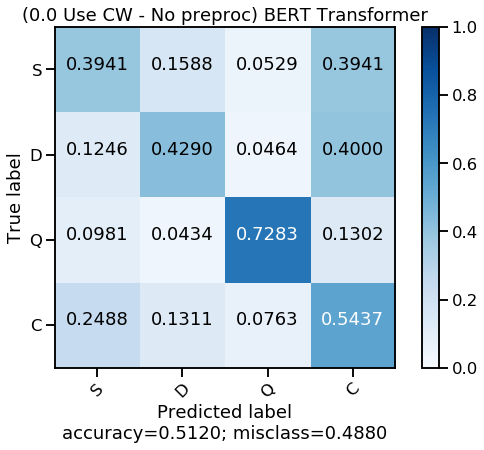

In [17]:
plot_confusion_matrix(normalize(m_temp),["S","D","Q","C"],"(0.0 Use CW - No preproc) BERT Transformer", cmap='Blues')



ENTRENANDO CON MINI BATCH  32 


Entrenando Run # 1





Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	None: tensor([0.2304, 0.0444, 0.0983, 0.2176], dtype=torch.float64) 	F-ma: tensor(0.1477, dtype=torch.float64)
Epoch 10 	None: tensor([0.5237, 0.0873, 0.3799, 0.4417], dtype=torch.float64) 	F-ma: tensor(0.3582, dtype=torch.float64)
Epoch 20 	None: tensor([0.5653, 0.1407, 0.5890, 0.5818], dtype=torch.float64) 	F-ma: tensor(0.4692, dtype=torch.float64)
Epoch 30 	None: tensor([0.5438, 0.0897, 0.6617, 0.5771], dtype=torch.float64) 	F-ma: tensor(0.4681, dtype=torch.float64)
Epoch 40 	None: tensor([0.5322, 0.2481, 0.5563, 0.6270], dtype=torch.float64) 	F-ma: tensor(0.4909, dtype=torch.float64)
Epoch 50

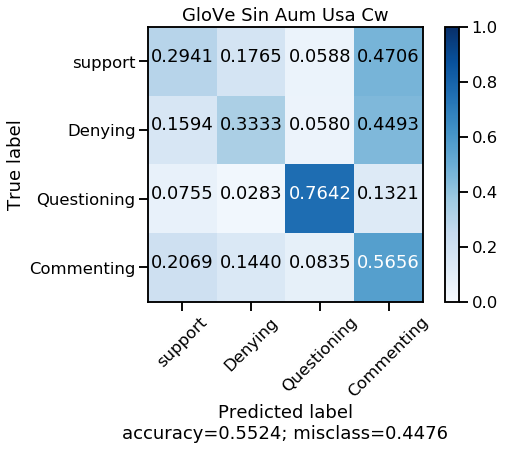

Test_ acc: 0.5523996082272282
Test_ f1 none: [0.14925373 0.21004566 0.62307692 0.67953668]
Test_ f1 macro: 0.4154782490143357


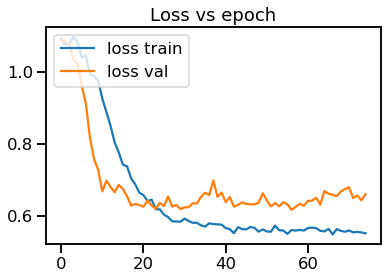

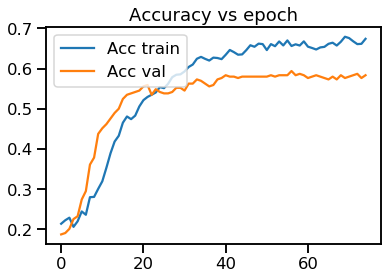

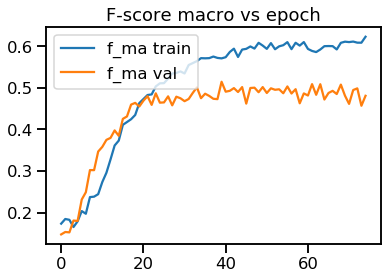

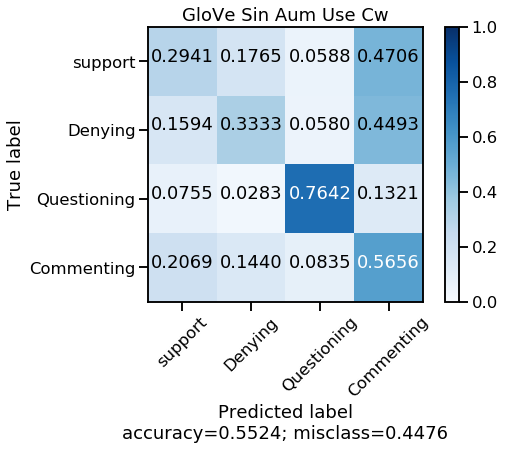

Test_ acc: 0.5523996082272282
Test_ f1 none: [0.14925373 0.21004566 0.62307692 0.67953668]
Test_ f1 macro: 0.4154782490143357
Encoder Layer Attention head 0
Encoder Layer Attention head 1
Entrenando Run # 2
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	None: tensor([0.2355, 0.0159, 0.0424, 0.2160], dtype=torch.float64) 	F-ma: tensor(0.1275, dtype=torch.float64)
Epoch 10 	None: tensor([0.4595, 0.0519, 0.5502, 0.0607], dtype=torch.float64) 	F-ma: tensor(0.2806, dtype=torch.float64)
Epoch 20 	None: tensor([0.4603, 0.1199, 0.6696, 0.2138], dtype=torch.float64) 	F-ma: tensor(0.3659, dtype=torch.float64)
Epoch 30 	None: tensor([0.5305, 0.1138, 0.7060, 0.5496], dtype=torch.float64) 	F-ma: tensor(0.4750, dtype=torch.float64)
Epoch 40 	None: tensor([0.5608, 0.0870, 0.6228, 0.6346], dtype=torch.float64) 	F-ma: tensor(0.4763, dtype=torch.float64)
Epoch 50 	None: tensor([0.5551, 0.1111, 0.6111, 0.6426], dtype=torch.fl

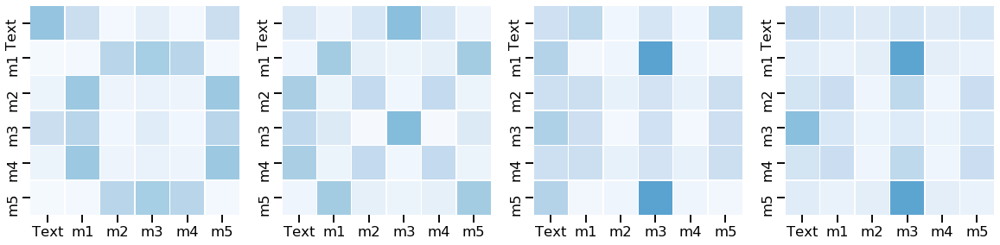

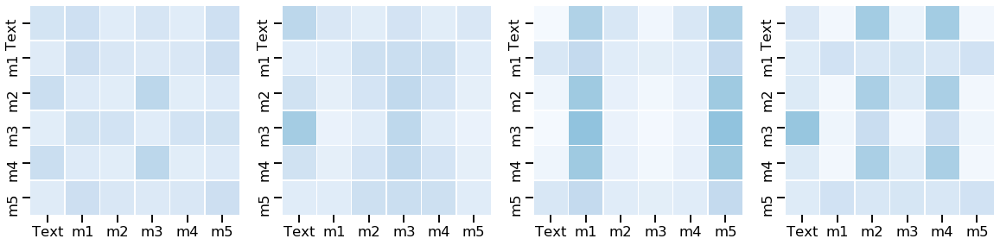

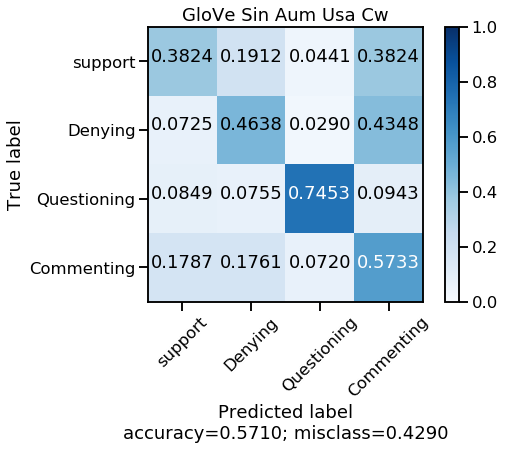

Test_ acc: 0.5710088148873653
Test_ f1 none: [0.21052632 0.24710425 0.64227642 0.69147287]
Test_ f1 macro: 0.4478449634687507


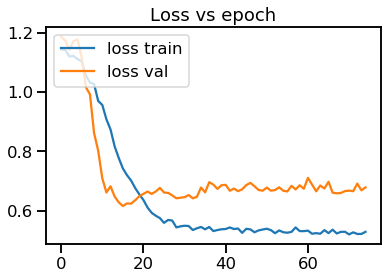

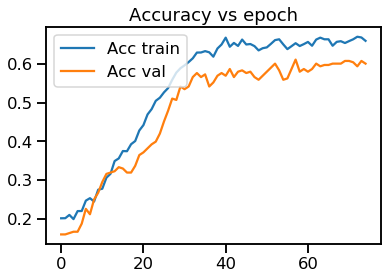

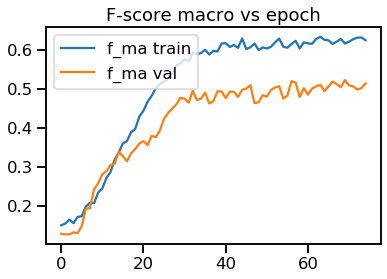

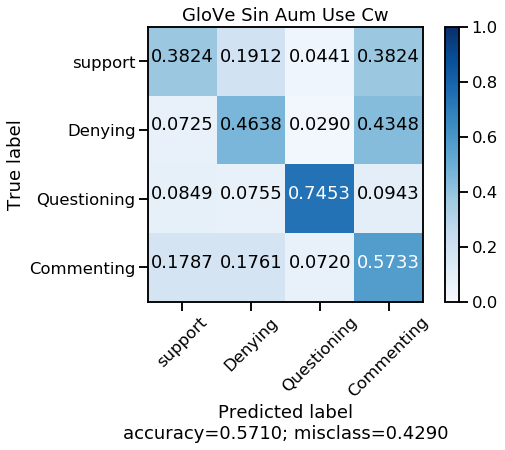

Test_ acc: 0.5710088148873653
Test_ f1 none: [0.21052632 0.24710425 0.64227642 0.69147287]
Test_ f1 macro: 0.4478449634687507
Encoder Layer Attention head 0
Encoder Layer Attention head 1
Entrenando Run # 3
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	None: tensor([0.4676, 0.0617, 0.2646, 0.2808], dtype=torch.float64) 	F-ma: tensor(0.2687, dtype=torch.float64)
Epoch 10 	None: tensor([0.5011, 0.2540, 0.3809, 0.0836], dtype=torch.float64) 	F-ma: tensor(0.3049, dtype=torch.float64)
Epoch 20 	None: tensor([0.5593, 0.1577, 0.5865, 0.5511], dtype=torch.float64) 	F-ma: tensor(0.4637, dtype=torch.float64)
Epoch 30 	None: tensor([0.5353, 0.1820, 0.6548, 0.5953], dtype=torch.float64) 	F-ma: tensor(0.4919, dtype=torch.float64)
Epoch 40 	None: tensor([0.5339, 0.2185, 0.6634, 0.6016], dtype=torch.float64) 	F-ma: tensor(0.5044, dtype=torch.float64)
Epoch 50 	None: tensor([0.5579, 0.2317, 0.6845, 0.6056], dtype=torch.fl

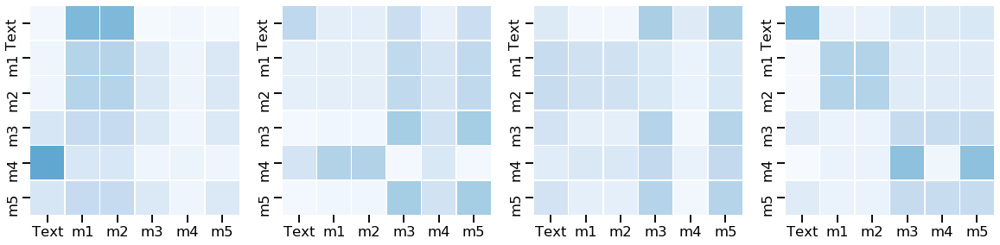

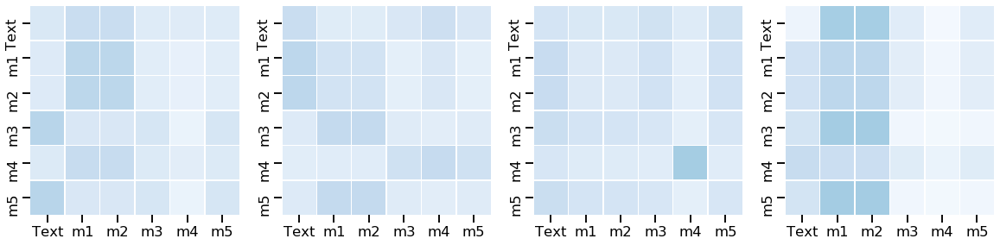

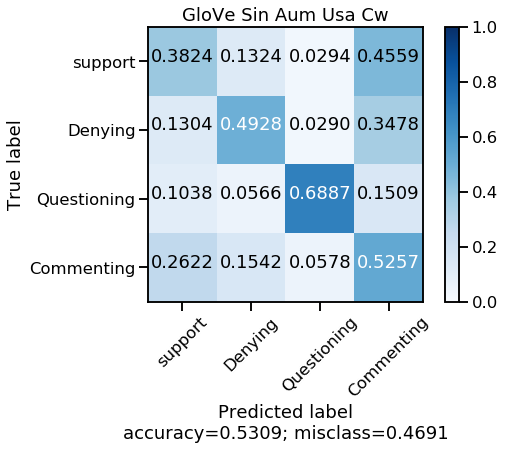

Test_ acc: 0.5308521057786484
Test_ f1 none: [0.16352201 0.28571429 0.64035088 0.65023847]
Test_ f1 macro: 0.4349564123134425


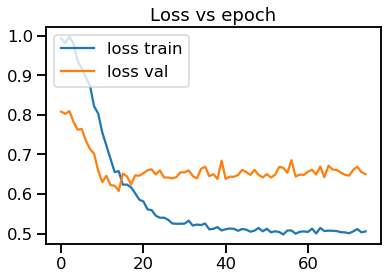

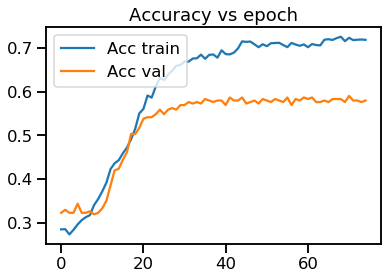

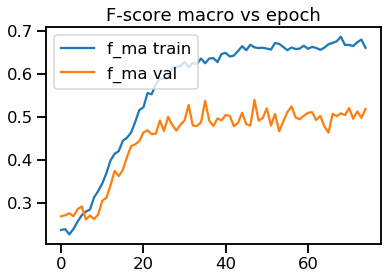

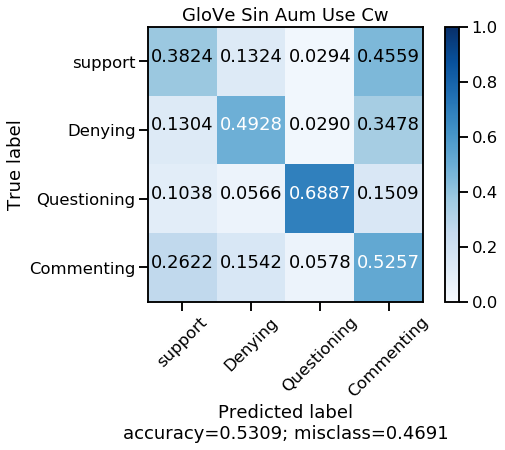

Test_ acc: 0.5308521057786484
Test_ f1 none: [0.16352201 0.28571429 0.64035088 0.65023847]
Test_ f1 macro: 0.4349564123134425
Encoder Layer Attention head 0
Encoder Layer Attention head 1
Entrenando Run # 4
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	None: tensor([0.2266, 0.1503, 0.1000, 0.4404], dtype=torch.float64) 	F-ma: tensor(0.2293, dtype=torch.float64)
Epoch 10 	None: tensor([0.4118, 0.1481, 0.5397, 0.2756], dtype=torch.float64) 	F-ma: tensor(0.3438, dtype=torch.float64)
Epoch 20 	None: tensor([0.5173, 0.1521, 0.6828, 0.4586], dtype=torch.float64) 	F-ma: tensor(0.4527, dtype=torch.float64)
Epoch 30 	None: tensor([0.5381, 0.1833, 0.6105, 0.5592], dtype=torch.float64) 	F-ma: tensor(0.4728, dtype=torch.float64)
Epoch 40 	None: tensor([0.5183, 0.1556, 0.7019, 0.5966], dtype=torch.float64) 	F-ma: tensor(0.4931, dtype=torch.float64)
Epoch 50 	None: tensor([0.5442, 0.1737, 0.6216, 0.5326], dtype=torch.fl

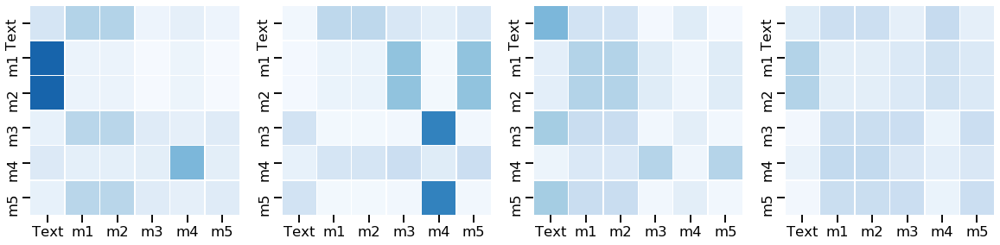

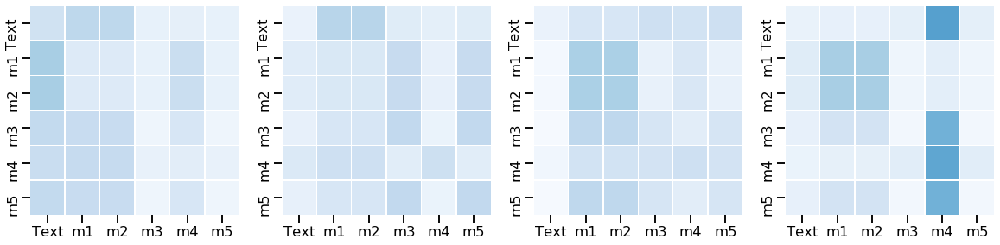

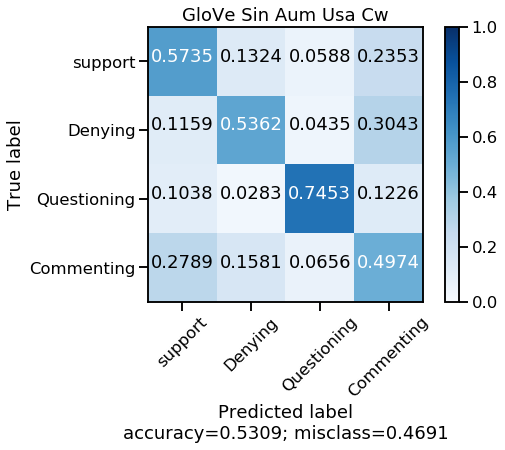

Test_ acc: 0.5308521057786484
Test_ f1 none: [0.22740525 0.30705394 0.65020576 0.63703704]
Test_ f1 macro: 0.45542549701900853


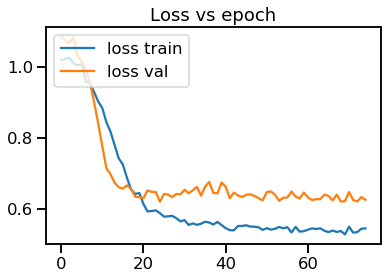

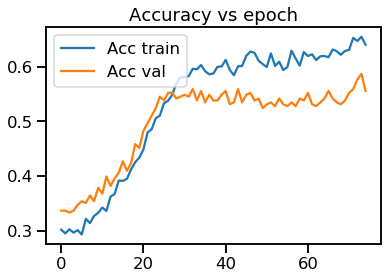

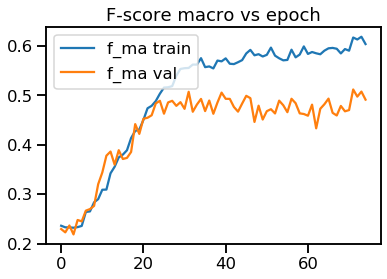

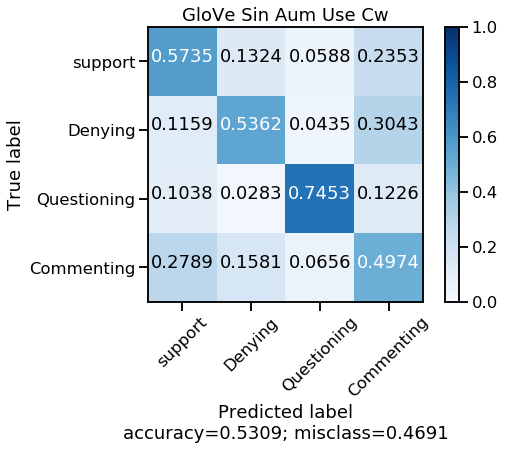

Test_ acc: 0.5308521057786484
Test_ f1 none: [0.22740525 0.30705394 0.65020576 0.63703704]
Test_ f1 macro: 0.45542549701900853
Encoder Layer Attention head 0
Encoder Layer Attention head 1
Entrenando Run # 5
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	None: tensor([0.0577, 0.0316, 0.1200, 0.0944], dtype=torch.float64) 	F-ma: tensor(0.0759, dtype=torch.float64)
Epoch 10 	None: tensor([0.5102, 0.0500, 0.3680, 0.3224], dtype=torch.float64) 	F-ma: tensor(0.3126, dtype=torch.float64)
Epoch 20 	None: tensor([0.5546, 0.1000, 0.6184, 0.6568], dtype=torch.float64) 	F-ma: tensor(0.4824, dtype=torch.float64)
Epoch 30 	None: tensor([0.5496, 0.1270, 0.6675, 0.6853], dtype=torch.float64) 	F-ma: tensor(0.5074, dtype=torch.float64)
Epoch 40 	None: tensor([0.5823, 0.1500, 0.6146, 0.6993], dtype=torch.float64) 	F-ma: tensor(0.5116, dtype=torch.float64)
Epoch 50 	None: tensor([0.5465, 0.1614, 0.6962, 0.6725], dtype=torch.f

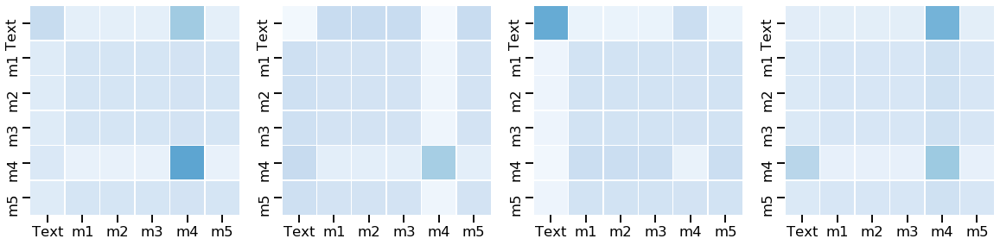

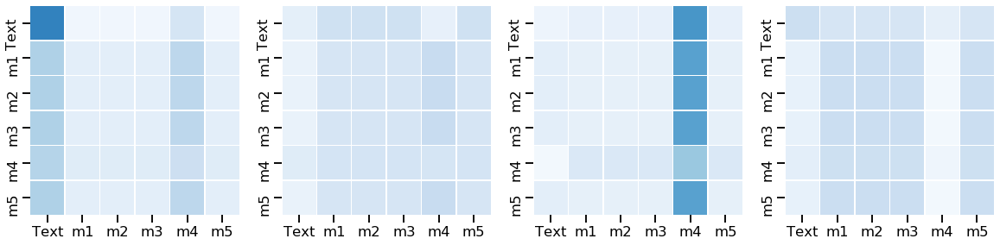

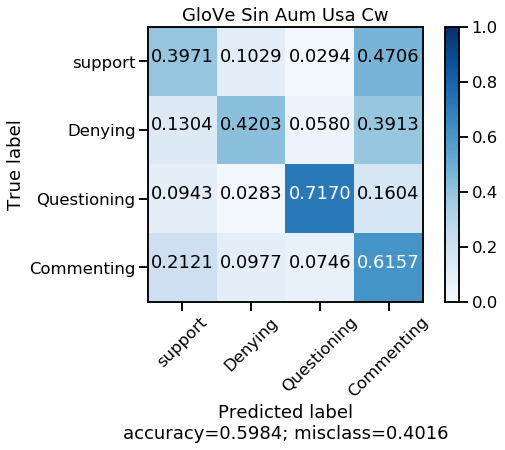

Test_ acc: 0.5984329089128305
Test_ f1 none: [0.19354839 0.31521739 0.61788618 0.71867967]
Test_ f1 macro: 0.4613329067950975


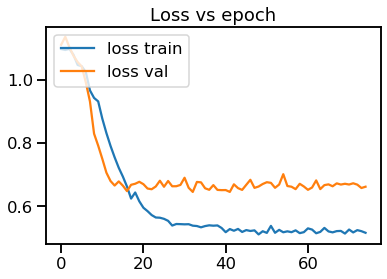

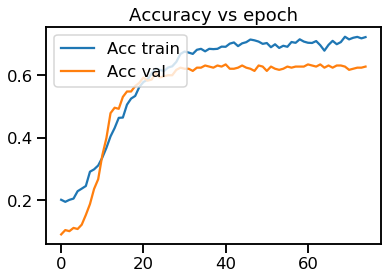

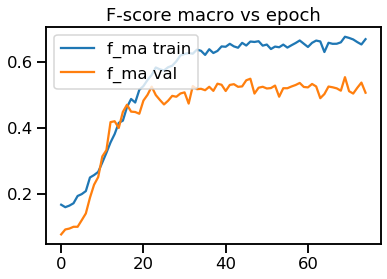

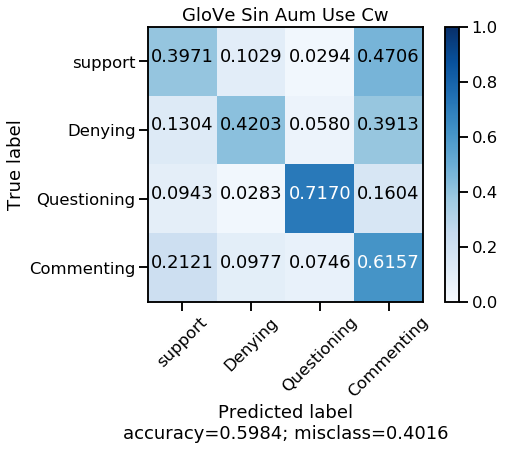

Test_ acc: 0.5984329089128305
Test_ f1 none: [0.19354839 0.31521739 0.61788618 0.71867967]
Test_ f1 macro: 0.4613329067950975
Encoder Layer Attention head 0
Encoder Layer Attention head 1
Acc: 0.5567091087169441
F-score: 0.44300760572212694
(0.0_Use CW) S-D-Q-C: 0.18885113892431177 0.27302710562641014 0.6347592326425588 0.6753929456952272


Confusion counts


ENTRENANDO CON MINI BATCH  50 


Entrenando Run # 1
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	None: tensor([0.1330, 0.0381, 0.3624, 0.1399], dtype=torch.float64) 	F-ma: tensor(0.1683, dtype=torch.float64)
Epoch 10 	None: tensor([0.2484, 0.0637, 0.5540, 0.1765], dtype=torch.float64) 	F-ma: tensor(0.2607, dtype=torch.float64)
Epoch 20 	None: tensor([0.4248, 0.1967, 0.6202, 0.1462], dtype=torch.float64) 	F-ma: tensor(0.3470, dtype=torch.float64)
Epoch 30 	None: tensor([0.4328, 0.1772, 0.6238, 0.2037], dtype=torch.float64) 	F-ma: tensor(0.3594, dtype=

ValueError: Found input variables with inconsistent numbers of samples: [1021, 1047]

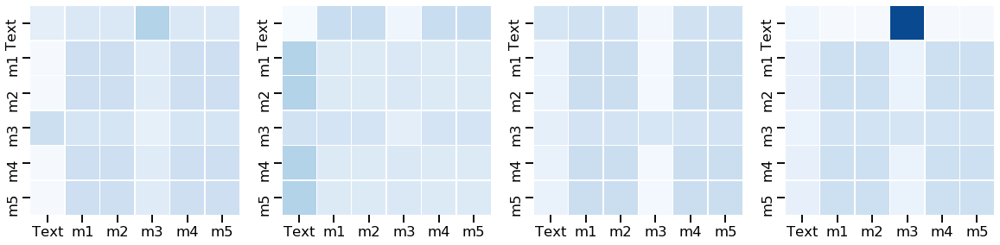

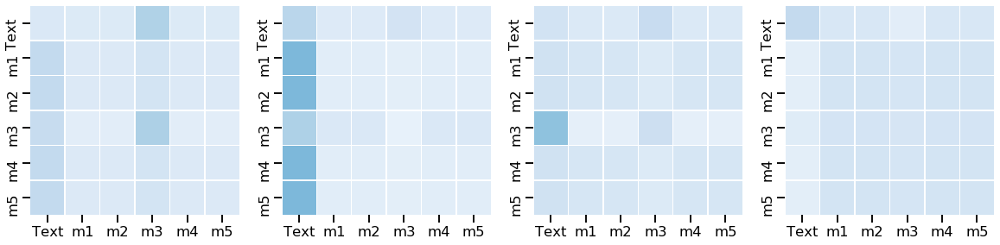

In [14]:
bss=[32, 50, 64]

for bs in bss:
    print ("\n\nENTRENANDO CON MINI BATCH ", bs, "\n\n")
    global_accs=[]
    global_fnones=[]
    global_fmacros=[]
    global_cms=[]
    global_attn=[]
    dict_attn_enc={'00':[], '01':[], '02':[], '03':[], '10':[], '11':[], '12':[], '13':[]}

    prob=0.0

    for trans in range(1,6): 
        print ("Entrenando Run #", trans)
        cnn1 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'_cw/cnn1_'+str(trans)+'-exec.h5')
        cnn2 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'_cw/cnn2_'+str(trans)+'-exec.h5')
        rnn1 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'_cw/rnn1_'+str(trans)+'-exec.h5')
        rnn2 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'_cw/rnn2_'+str(trans)+'-exec.h5')
        rnn3 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'_cw/rnn3_'+str(trans)+'-exec.h5')

        list_models=['cnn1', 'cnn2', 'rnn1', 'rnn2', 'rnn3']
        index_models=np.arange(5)
        dict_models=dict((key, value) for (key, value) in zip(index_models,list_models))
        modelos=[cnn1, cnn2, rnn1, rnn2, rnn3]
        ind=np.arange(5)
        dict_trainedModel=dict((key, value) for (key, value) in zip(ind,modelos))

        #bs=64
        b_dim=768

        predicciones_all=[]
        predicciones_all_val=[]
        predicciones_all_test=[]

        print ("agregando predicciones Train")
        for i in dict_trainedModel.keys(): 
            a_evaluar=dict_models[i]
            predicciones_all.append(dict_trainedModel[i].predict(x_train, batch_size=bs))
        print ("agregando predicciones Val")
        for i in dict_trainedModel.keys(): 
            a_evaluar=dict_models[i]
            predicciones_all_val.append(dict_trainedModel[i].predict(x_val, batch_size=bs))
        print ("agregando predicciones Test")
        for i in dict_trainedModel.keys(): 
            a_evaluar=dict_models[i]
            predicciones_all_test.append(dict_trainedModel[i].predict(x_test, batch_size=bs))

        matrix=np.asarray(predicciones_all)
        matrix_val=np.asarray(predicciones_all_val)
        matrix_test=np.asarray(predicciones_all_test)
        new_matrix=np.concatenate([matrix,matrix_val,matrix_test], axis=1)


        espacio=[np.ones(b_dim)]
        #Ks=np.load("../../BERTransformer/Orthogonals_768.npy")

        espacio=[np.ones(b_dim)]
        Ks= ortho_group.rvs(dim=b_dim)
        random=np.random.randint(Ks.shape[0], size=4)
        K_list=Ks[random]
        K_list_ext=espacio+list(K_list)
        index_embeddings=[0,1,2,3,4]
        lab_str_embeddings=['','','','','']

        for i in range(len(sentences)):
            #ide=ids_train[i]
            tw_tr=tws_train[i]
            clase=dict_cl[labels_train[i]]
            encoded_tok, sentence_valid = my_tokenizer(cleaner(tw_tr)[1])  #cleaner: raw, no cleaner:augmented version

            final=' '
            frase=[final.join(sentence_valid)]
            try: 
                vector= bc.encode(frase)[0]  
                #norm=np.linalg.norm(vector)
                final_bert= vector #/ norm
            except: 
                final_bert= np.zeros(b_dim)

            index_embeddings.append(i+5)
            lab_str_embeddings.append(clase)
            K_list_ext.append(final_bert)

        objs_val=val['Tw_id']      #df_val['Unnamed: 0'].values
        objs_test=test['Tw_id']    #np.arange(df_test.shape[0])
        lab_val=val['Label']
        lab_test=test['Label']
        tw_val=val['Tweet']
        tw_test=test['Tweet']
        llaves=np.concatenate([objs_val,objs_test])
        clases=np.concatenate([lab_val,lab_test])
        sent_all=np.concatenate([tw_val,tw_test])

        for num in range(len(llaves)):
            i=llaves[num]
            clase=clases[num]
            tw_tr=sent_all[num]
            #vector=np.load("../BaS_Original/Original/"+str(i)+".npy")
            encoded_tok, tokens_valid =my_tokenizer(cleaner(tw_tr)[1])

            final=' '
            frase=[final.join(tokens_valid)]
            try: 
                vector= bc.encode(frase)[0]    
                #norm=np.linalg.norm(vector)
                final_bert= vector #/ norm
            except: 
                final_bert= np.zeros(b_dim)

            index_embeddings.append(num+5+train.shape[0])
            lab_str_embeddings.append(clase)
            K_list_ext.append(final_bert)

        K_list_new= np.asarray(K_list_ext, dtype='float32')

        ###################################### TRANSFORMER ###############################
        hist_train_loss=[]
        hist_train_acc=[]
        hist_train_fma=[]
        hist_val_loss=[]
        hist_val_acc=[]
        hist_val_fma=[]
        V = 4
        pesos = torch.from_numpy(class_weights).float()
        criterion = FocalLoss(weights=pesos)
        model = make_model_concat(4, N=2,d_model=b_dim, d_ff=128, h=4, dropout=0.35)
        model_opt = NoamOpt(model.src_embed[0].d_model, 1, 6000, torch.optim.Adam(model.parameters(), lr=0, betas=(0.9, 0.98), eps=1e-5))

        for epoch in range(75):
            model.train()
            DATA=data_gen(bs, 'Train', 5, new_matrix)
            loss_train, acc_train,fma_train, f_none, cm_train=run_epoch(DATA, model, SimpleLossComputeFL(criterion, model_opt), 'Train')
            hist_train_loss.append(loss_train)
            hist_train_acc.append(acc_train)
            hist_train_fma.append(fma_train)

            model.eval()
            loss_val, acc_val,fma_val, f_val_none, cm_val=run_epoch(data_gen(bs, 'Val', 5, new_matrix), model, SimpleLossComputeFL(criterion, None),'Val')
            if epoch%10==0:
                print ("Epoch",epoch, "\tNone:",f_val_none, "\tF-ma:",fma_val)
            hist_val_loss.append(loss_val)
            hist_val_acc.append(acc_val)
            hist_val_fma.append(fma_val)

        model.eval()
        print ("Testing run #",trans)
        predicciones = run_epoch(data_gen(bs, 'Test', 5, new_matrix), model, SimpleLossComputeFL(criterion, None),'Test')
        predicciones=np.concatenate(predicciones, axis=-1)

        glo_acc=accuracy_score(etiq_t, predicciones[:-3])
        glo_fno=f1_score(etiq_t,predicciones[:-3], average=None)
        glo_fma=f1_score(etiq_t,predicciones[:-3], average='macro')

        glo_cm=confusion_matrix(etiq_t, predicciones[:-3])

        plot_confusion_matrix(glo_cm,["support","Denying","Questioning","Commenting"],"GloVe Sin Aum Usa Cw")
        global_accs.append(glo_acc)
        global_fnones.append(glo_fno)
        global_fmacros.append(glo_fma)
        global_cms.append(glo_cm)
        print("Test_ acc:",glo_acc) 
        print("Test_ f1 none:",glo_fno) 
        print("Test_ f1 macro:",glo_fma) 

        plt.plot(hist_train_loss, label='loss train')
        plt.plot(hist_val_loss,label='loss val')
        plt.legend(loc='upper left')
        plt.title("Loss vs epoch")
        plt.show()

        plt.plot(hist_train_acc, label='Acc train')
        plt.plot(hist_val_acc, label='Acc val')
        plt.legend(loc='upper left')
        plt.title("Accuracy vs epoch")
        plt.show()

        plt.plot(hist_train_fma, label='f_ma train')
        plt.plot(hist_val_fma, label='f_ma val')
        plt.legend(loc='upper left')
        plt.title("F-score macro vs epoch")
        plt.show()
        #"""

        plot_confusion_matrix(glo_cm,["support","Denying","Questioning","Commenting"],"GloVe Sin Aum Use Cw")
        global_accs.append(glo_acc)
        global_fnones.append(glo_fno)
        global_fmacros.append(glo_fma)
        global_cms.append(glo_cm)
        print("Test_ acc:",glo_acc) 
        print("Test_ f1 none:",glo_fno) 
        print("Test_ f1 macro:",glo_fma) 

        label=[['Text', 'm1', 'm2','m3','m4','m5']]
        for layer in range(2):
            fig, axs = plt.subplots(1,4, figsize=(20, 10))
            print ("Encoder Layer Attention head", layer)
            for head in range(4):
                matriz_attn=model.encoder.layers[layer].self_attn.attn[0,head].data
                dict_attn_enc[str(layer)+str(head)].append(matriz_attn)
                sns.heatmap(matriz_attn, xticklabels=label[0], yticklabels=label[0],
                            vmin=0.0, vmax=1.0, linewidths=.5, cmap="Blues", cbar=False, square=True, ax=axs[head]) #, annot=False,cbar_kws={"orientation": "horizontal","pad": 0.25})
            #plt.show()

    #CIARP
    print ("Acc:",np.mean(np.asarray(global_accs)))
    print ("F-score:", np.mean(np.asarray(global_fmacros)))
    sup=np.mean(np.asarray(global_fnones)[:,0])
    den=np.mean(np.asarray(global_fnones)[:,1])
    que=np.mean(np.asarray(global_fnones)[:,2])
    com=np.mean(np.asarray(global_fnones)[:,3])

    print ("(0.0_Use CW) S-D-Q-C:", sup,den,que,com)

    print ("\n\nConfusion counts")
    m_temp=np.zeros((4,4))
    for m in global_cms:
        m_temp+=np.asarray(m)

    m_temp

In [25]:
#CIARP
print ("Acc:",np.mean(np.asarray(global_accs)))
print ("F-score:", np.mean(np.asarray(global_fmacros)))
sup=np.mean(np.asarray(global_fnones)[:,0])
den=np.mean(np.asarray(global_fnones)[:,1])
que=np.mean(np.asarray(global_fnones)[:,2])
com=np.mean(np.asarray(global_fnones)[:,3])

print ("(0.0_Use CW) S-D-Q-C:", sup,den,que,com)

print ("\n\nConfusion counts")
m_temp=np.zeros((4,4))
for m in global_cms:
    m_temp+=np.asarray(m)
    
m_temp

Acc: 0.28932419196865816
F-score: 0.30733181295869855
(0.0_Use CW) S-D-Q-C: 0.15798831070438193 0.23965278553381344 0.5751181849856813 0.2565679706109175


Confusion counts


array([[ 394.,  142.,   68.,   76.],
       [ 164.,  368.,   46.,  112.],
       [ 114.,   62.,  834.,   50.],
       [3710., 1802.,  910., 1358.]])



ENTRENANDO CON MINI BATCH 32 y WARMUP 4000 


Entrenando Run # 1
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	None: tensor([0.3205, 0.0000, 0.0000, 0.1177], dtype=torch.float64) 	F-ma: tensor(0.1095, dtype=torch.float64)
Epoch 10 	None: tensor([0.4250, 0.0833, 0.4684, 0.0327], dtype=torch.float64) 	F-ma: tensor(0.2523, dtype=torch.float64)
Epoch 20 	None: tensor([0.4989, 0.1190, 0.6252, 0.4852], dtype=torch.float64) 	F-ma: tensor(0.4321, dtype=torch.float64)
Epoch 30 	None: tensor([0.5371, 0.1667, 0.6210, 0.6053], dtype=torch.float64) 	F-ma: tensor(0.4825, dtype=torch.float64)
Epoch 40 	None: tensor([0.5228, 0.1802, 0.6332, 0.5663], dtype=torch.float64) 	F-ma: tensor(0.4756, dtype=torch.float64)
Epoch 50 	None: tensor([0.5408, 0.1611, 0.6044, 0.6054], dtype=torch.float64) 	F-ma: tensor(0.4779, dtype=torch.float64)
Epoch 60 	None: tensor([0.5379, 0.1506, 0.6259, 0.6272], dtype=torch.float64) 	F-ma: tenso

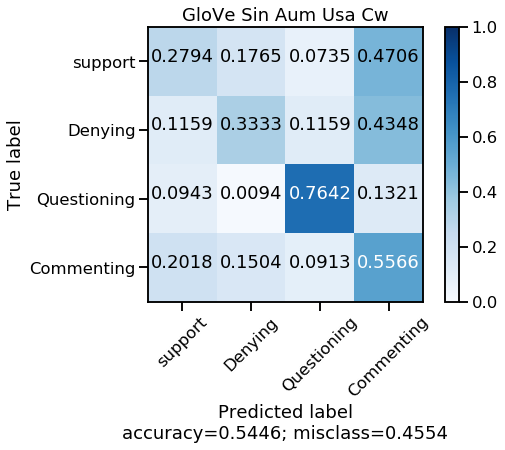

Test_ acc: 0.544564152791381
Test_ f1 none: [0.14503817 0.20720721 0.59778598 0.67288267]
Test_ f1 macro: 0.40572850647214753


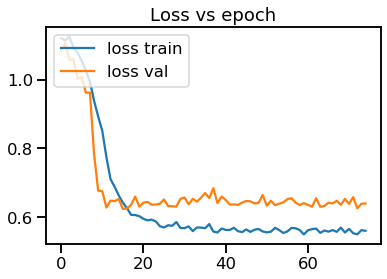

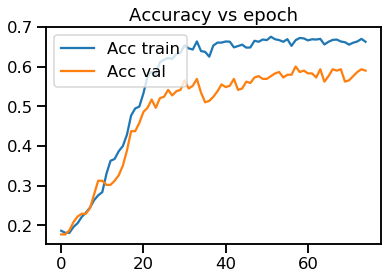

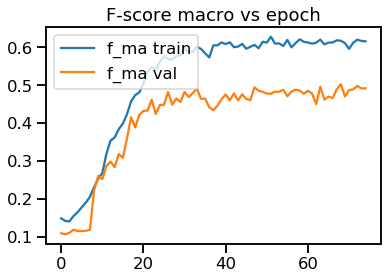

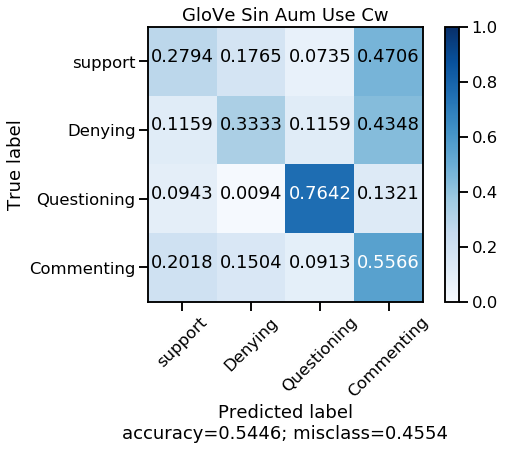

Test_ acc: 0.544564152791381
Test_ f1 none: [0.14503817 0.20720721 0.59778598 0.67288267]
Test_ f1 macro: 0.40572850647214753
Encoder Layer Attention head 0
Encoder Layer Attention head 1
Entrenando Run # 2
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	None: tensor([0.3293, 0.0556, 0.0772, 0.1336], dtype=torch.float64) 	F-ma: tensor(0.1489, dtype=torch.float64)
Epoch 10 	None: tensor([0.4527, 0.1185, 0.5564, 0.3546], dtype=torch.float64) 	F-ma: tensor(0.3706, dtype=torch.float64)
Epoch 20 	None: tensor([0.4954, 0.1774, 0.6769, 0.5247], dtype=torch.float64) 	F-ma: tensor(0.4686, dtype=torch.float64)
Epoch 30 	None: tensor([0.5261, 0.1593, 0.6929, 0.5956], dtype=torch.float64) 	F-ma: tensor(0.4935, dtype=torch.float64)
Epoch 40 	None: tensor([0.5033, 0.2151, 0.5685, 0.5822], dtype=torch.float64) 	F-ma: tensor(0.4673, dtype=torch.float64)
Epoch 50 	None: tensor([0.5010, 0.1852, 0.6000, 0.5879], dtype=torch.fl

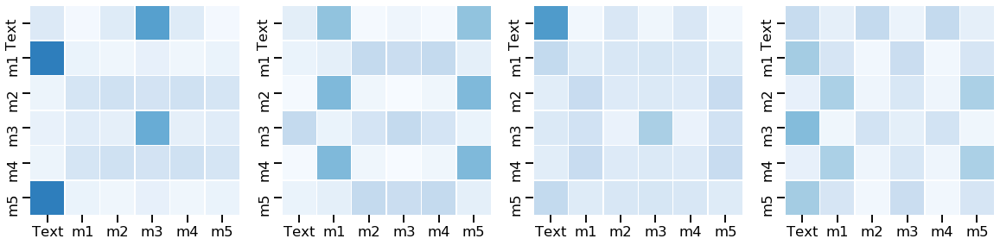

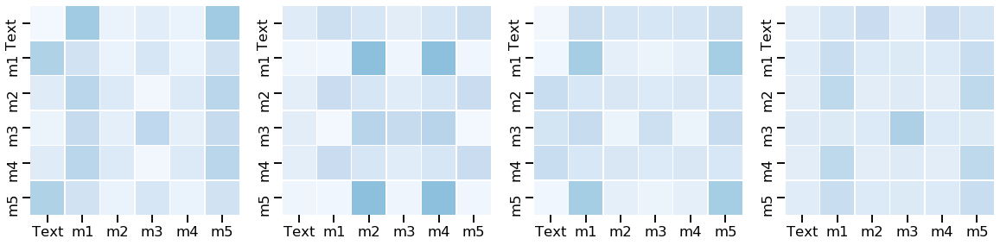

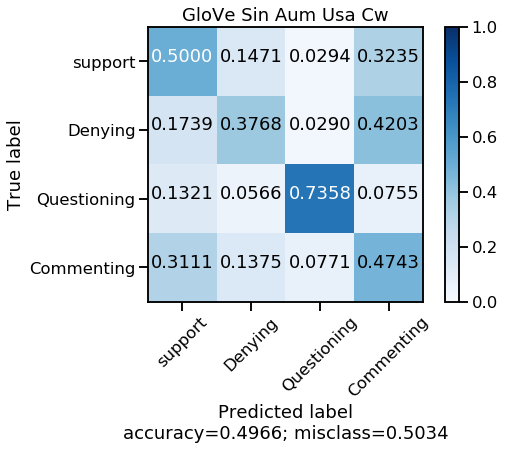

Test_ acc: 0.49657198824681686
Test_ f1 none: [0.18378378 0.23853211 0.62903226 0.6119403 ]
Test_ f1 macro: 0.4158221126118765


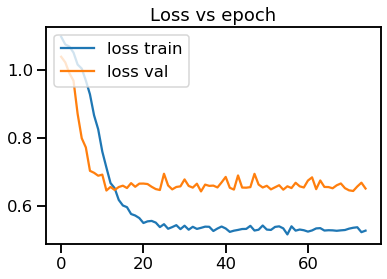

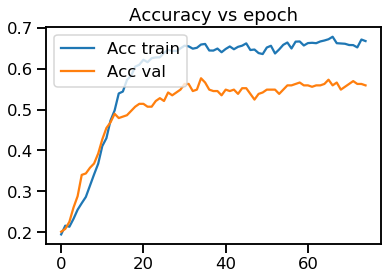

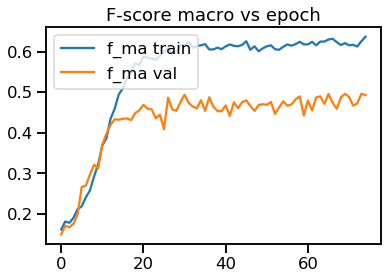

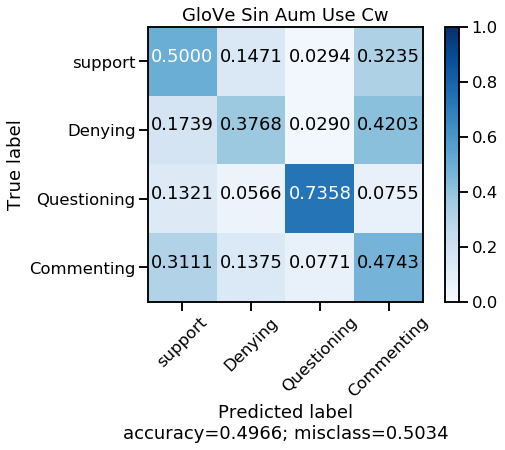

Test_ acc: 0.49657198824681686
Test_ f1 none: [0.18378378 0.23853211 0.62903226 0.6119403 ]
Test_ f1 macro: 0.4158221126118765
Encoder Layer Attention head 0
Encoder Layer Attention head 1
Entrenando Run # 3
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	None: tensor([0.3095, 0.1379, 0.1742, 0.2604], dtype=torch.float64) 	F-ma: tensor(0.2205, dtype=torch.float64)
Epoch 10 	None: tensor([0.4871, 0.1384, 0.5782, 0.3152], dtype=torch.float64) 	F-ma: tensor(0.3797, dtype=torch.float64)
Epoch 20 	None: tensor([0.5136, 0.2481, 0.6958, 0.5479], dtype=torch.float64) 	F-ma: tensor(0.5014, dtype=torch.float64)
Epoch 30 	None: tensor([0.5471, 0.3296, 0.7429, 0.6112], dtype=torch.float64) 	F-ma: tensor(0.5577, dtype=torch.float64)
Epoch 40 	None: tensor([0.5727, 0.1421, 0.6981, 0.6046], dtype=torch.float64) 	F-ma: tensor(0.5044, dtype=torch.float64)
Epoch 50 	None: tensor([0.5151, 0.1963, 0.7031, 0.5978], dtype=torch.f

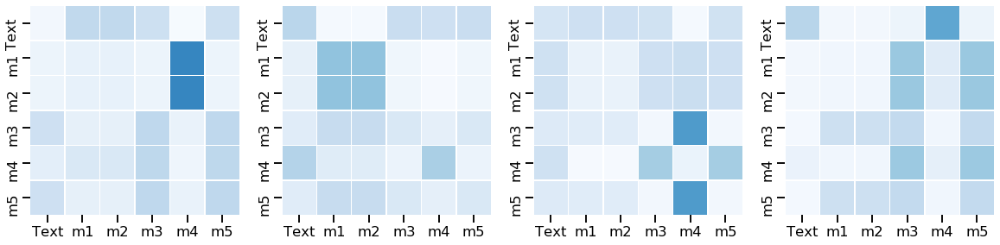

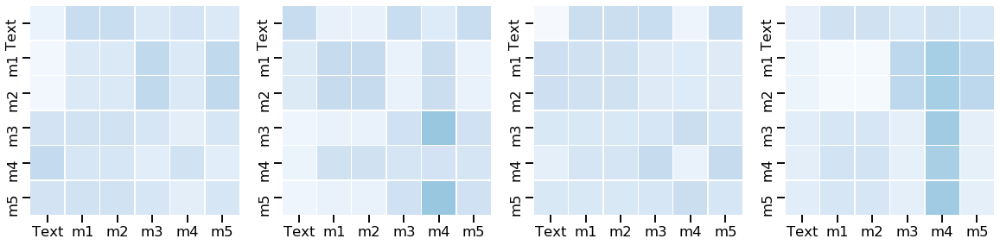

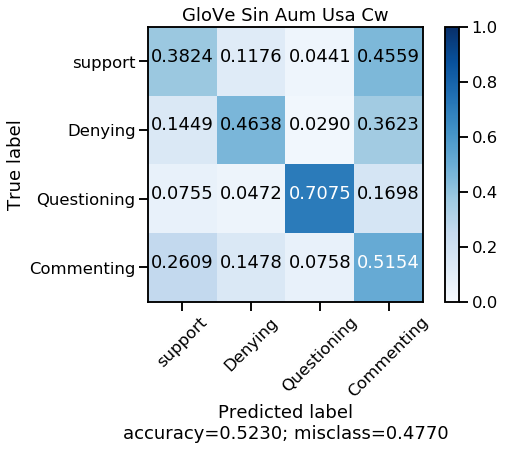

Test_ acc: 0.5230166503428012
Test_ f1 none: [0.16507937 0.27947598 0.6122449  0.64006385]
Test_ f1 macro: 0.42421602308476425


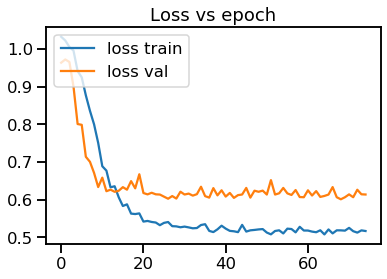

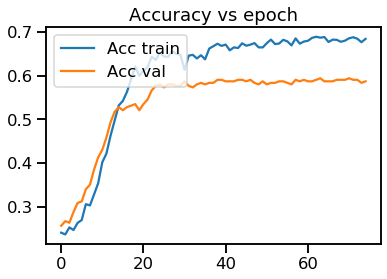

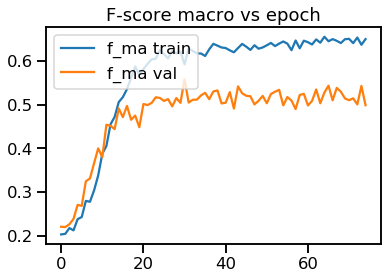

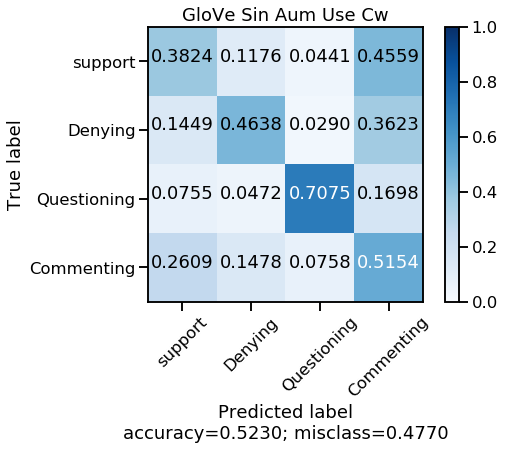

Test_ acc: 0.5230166503428012
Test_ f1 none: [0.16507937 0.27947598 0.6122449  0.64006385]
Test_ f1 macro: 0.42421602308476425
Encoder Layer Attention head 0
Encoder Layer Attention head 1
Entrenando Run # 4
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	None: tensor([0.3793, 0.0860, 0.0712, 0.0979], dtype=torch.float64) 	F-ma: tensor(0.1586, dtype=torch.float64)
Epoch 10 	None: tensor([0.5400, 0.1328, 0.5433, 0.4218], dtype=torch.float64) 	F-ma: tensor(0.4095, dtype=torch.float64)
Epoch 20 	None: tensor([0.5538, 0.1741, 0.5774, 0.4801], dtype=torch.float64) 	F-ma: tensor(0.4463, dtype=torch.float64)
Epoch 30 	None: tensor([0.5407, 0.2147, 0.6155, 0.5157], dtype=torch.float64) 	F-ma: tensor(0.4716, dtype=torch.float64)
Epoch 40 	None: tensor([0.5135, 0.2556, 0.6172, 0.5705], dtype=torch.float64) 	F-ma: tensor(0.4892, dtype=torch.float64)
Epoch 50 	None: tensor([0.5651, 0.1605, 0.6497, 0.5571], dtype=torch.f

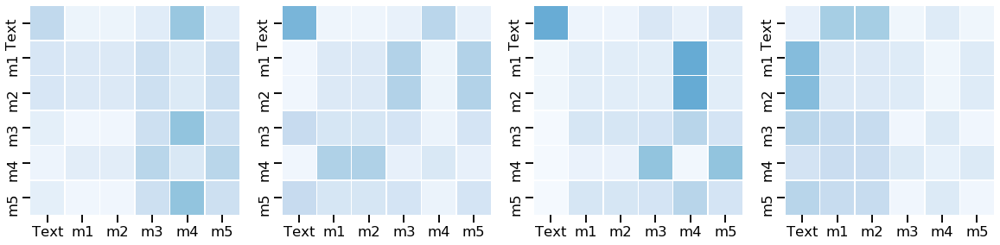

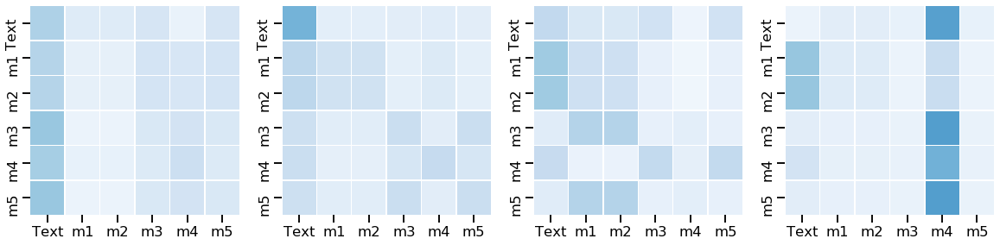

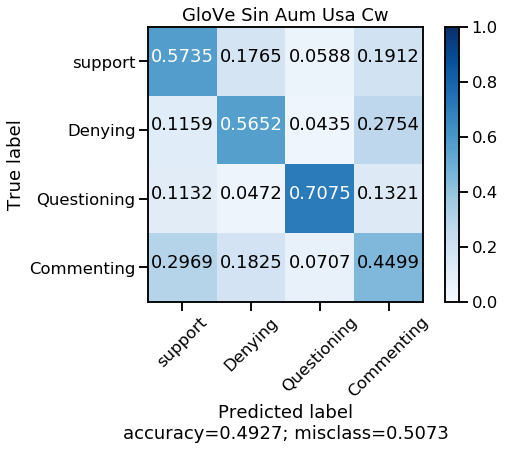

Test_ acc: 0.4926542605288932
Test_ f1 none: [0.21787709 0.29213483 0.61728395 0.59625213]
Test_ f1 macro: 0.4308870016304791


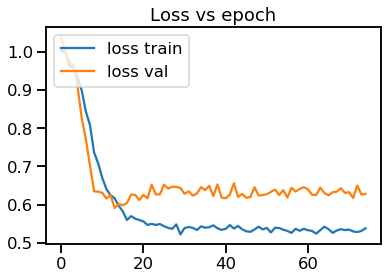

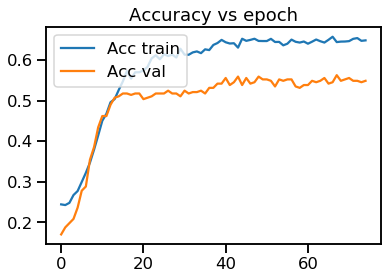

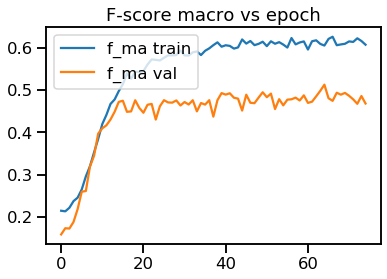

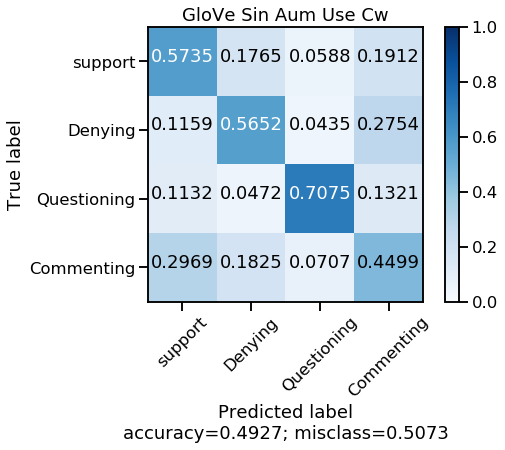

Test_ acc: 0.4926542605288932
Test_ f1 none: [0.21787709 0.29213483 0.61728395 0.59625213]
Test_ f1 macro: 0.4308870016304791
Encoder Layer Attention head 0
Encoder Layer Attention head 1
Entrenando Run # 5
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	None: tensor([0.2357, 0.0000, 0.0444, 0.4928], dtype=torch.float64) 	F-ma: tensor(0.1932, dtype=torch.float64)
Epoch 10 	None: tensor([0.4913, 0.1561, 0.6094, 0.4667], dtype=torch.float64) 	F-ma: tensor(0.4309, dtype=torch.float64)
Epoch 20 	None: tensor([0.5216, 0.1731, 0.6439, 0.5989], dtype=torch.float64) 	F-ma: tensor(0.4844, dtype=torch.float64)
Epoch 30 	None: tensor([0.5251, 0.2278, 0.6770, 0.6269], dtype=torch.float64) 	F-ma: tensor(0.5142, dtype=torch.float64)
Epoch 40 	None: tensor([0.5377, 0.1358, 0.6008, 0.6274], dtype=torch.float64) 	F-ma: tensor(0.4754, dtype=torch.float64)
Epoch 50 	None: tensor([0.5558, 0.1873, 0.6434, 0.6453], dtype=torch.fl

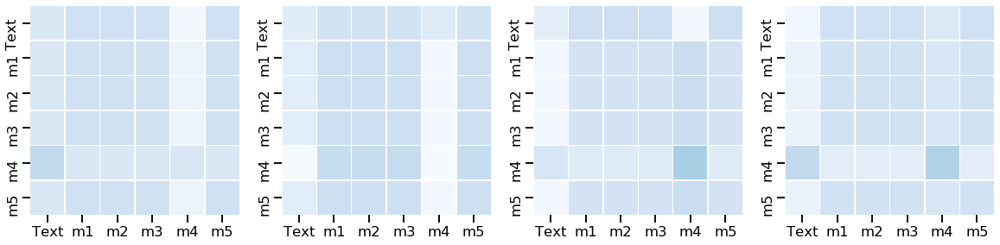

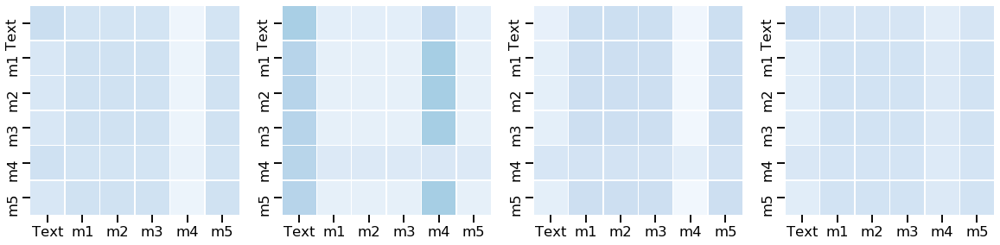

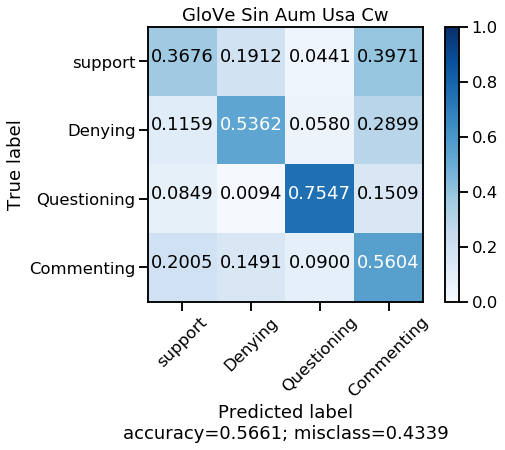

Test_ acc: 0.5661116552399609
Test_ f1 none: [0.18796992 0.31355932 0.60836502 0.68285043]
Test_ f1 macro: 0.4481861741385703


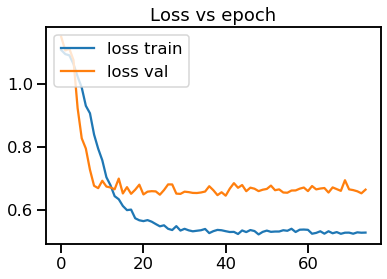

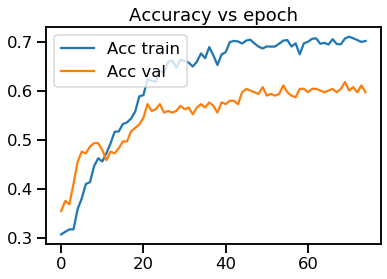

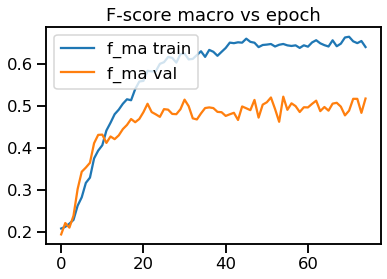

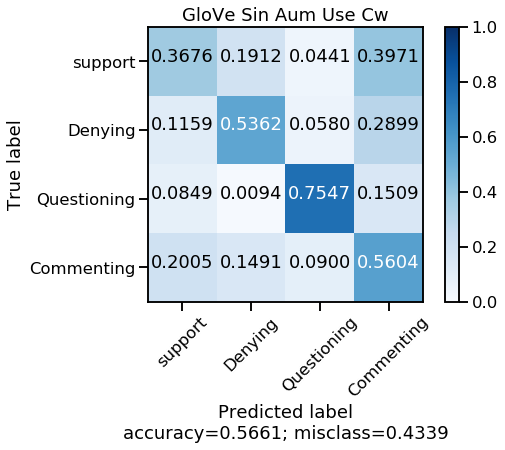

Test_ acc: 0.5661116552399609
Test_ f1 none: [0.18796992 0.31355932 0.60836502 0.68285043]
Test_ f1 macro: 0.4481861741385703
Encoder Layer Attention head 0
Encoder Layer Attention head 1
Set de experimentos
Acc: 0.5245837414299708
F-score: 0.4249679635875675
(0.0_Use CW) S-D-Q-C: 0.17994966731723547 0.2661818906652548 0.6129424207024338 0.640797875665346


Confusion counts


ENTRENANDO CON MINI BATCH 32 y WARMUP 5000 


Entrenando Run # 1
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	None: tensor([0.1030, 0.0904, 0.1866, 0.3210], dtype=torch.float64) 	F-ma: tensor(0.1753, dtype=torch.float64)
Epoch 10 	None: tensor([0.4926, 0.1817, 0.4836, 0.3025], dtype=torch.float64) 	F-ma: tensor(0.3651, dtype=torch.float64)
Epoch 20 	None: tensor([0.5802, 0.1852, 0.6441, 0.5472], dtype=torch.float64) 	F-ma: tensor(0.4892, dtype=torch.float64)
Epoch 30 	None: tensor([0.5751, 0.2130, 0.6068, 0.5279], dtype=torch.float64

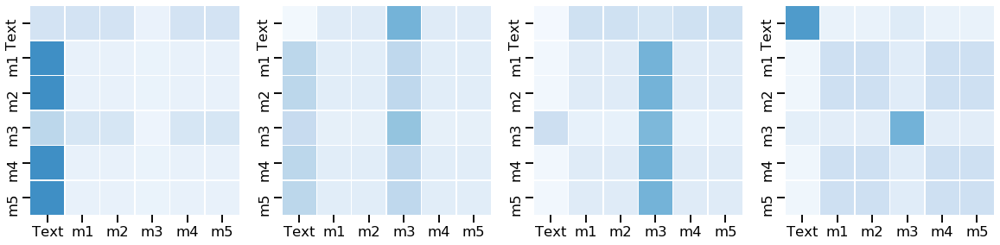

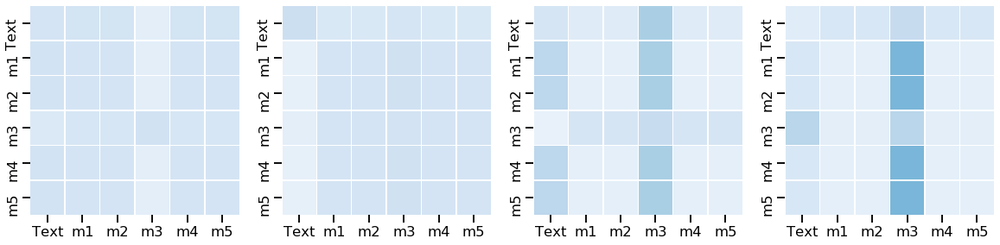

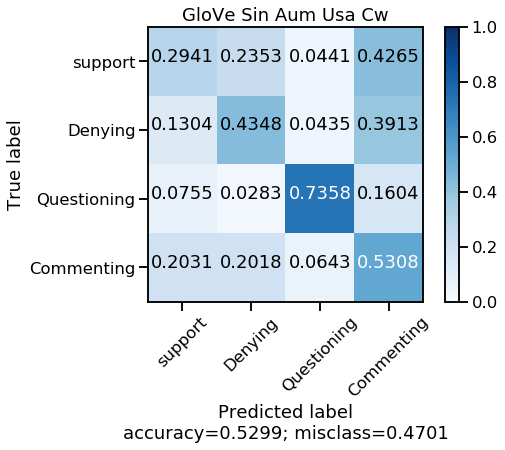

Test_ acc: 0.5298726738491675
Test_ f1 none: [0.15209125 0.21818182 0.65       0.65348101]
Test_ f1 macro: 0.41843852139822446


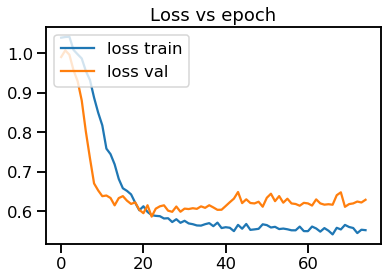

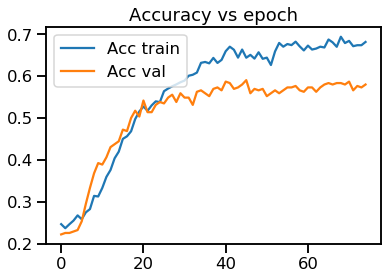

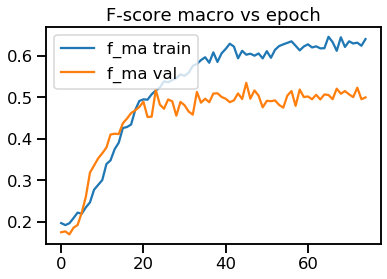

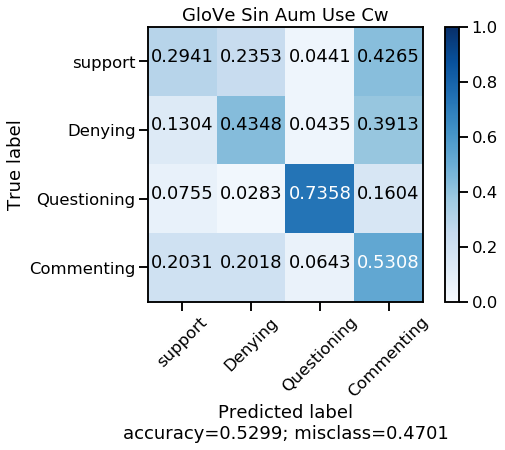

Test_ acc: 0.5298726738491675
Test_ f1 none: [0.15209125 0.21818182 0.65       0.65348101]
Test_ f1 macro: 0.41843852139822446
Encoder Layer Attention head 0
Encoder Layer Attention head 1
Entrenando Run # 2
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	None: tensor([0.1075, 0.0917, 0.0342, 0.0919], dtype=torch.float64) 	F-ma: tensor(0.0813, dtype=torch.float64)
Epoch 10 	None: tensor([0.3400, 0.1704, 0.1820, 0.2625], dtype=torch.float64) 	F-ma: tensor(0.2387, dtype=torch.float64)
Epoch 20 	None: tensor([0.5309, 0.2127, 0.6615, 0.4887], dtype=torch.float64) 	F-ma: tensor(0.4735, dtype=torch.float64)
Epoch 30 	None: tensor([0.5496, 0.2079, 0.5727, 0.5953], dtype=torch.float64) 	F-ma: tensor(0.4814, dtype=torch.float64)
Epoch 40 	None: tensor([0.5464, 0.1444, 0.4973, 0.6150], dtype=torch.float64) 	F-ma: tensor(0.4508, dtype=torch.float64)
Epoch 50 	None: tensor([0.5329, 0.1619, 0.6642, 0.6381], dtype=torch.f

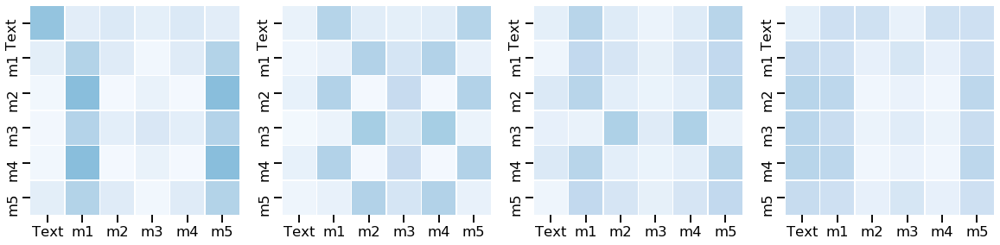

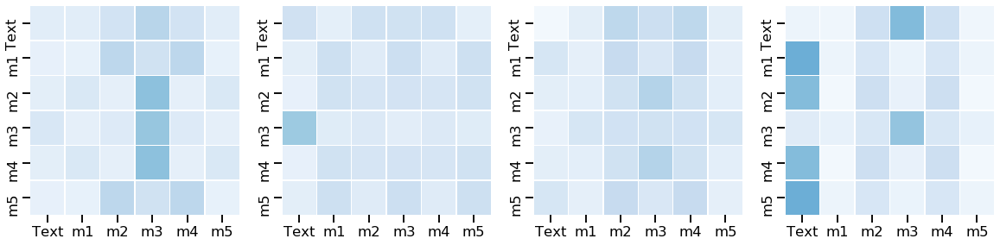

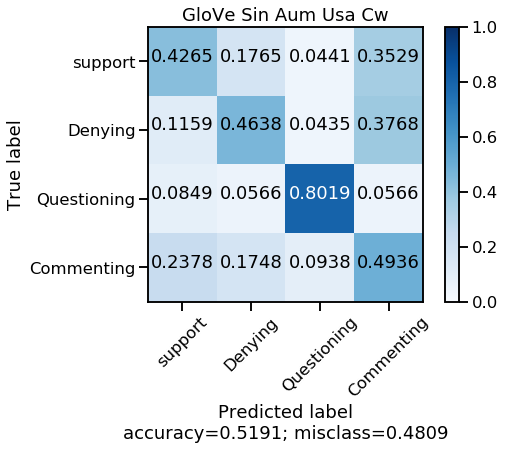

Test_ acc: 0.5190989226248776
Test_ f1 none: [0.19397993 0.25098039 0.62962963 0.63054187]
Test_ f1 macro: 0.42628295670451066


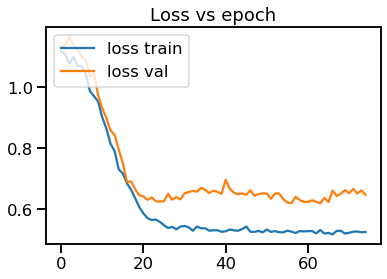

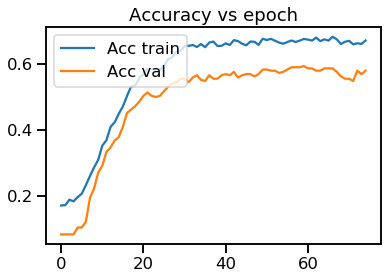

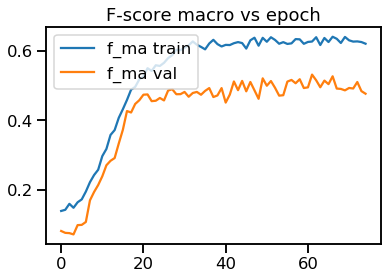

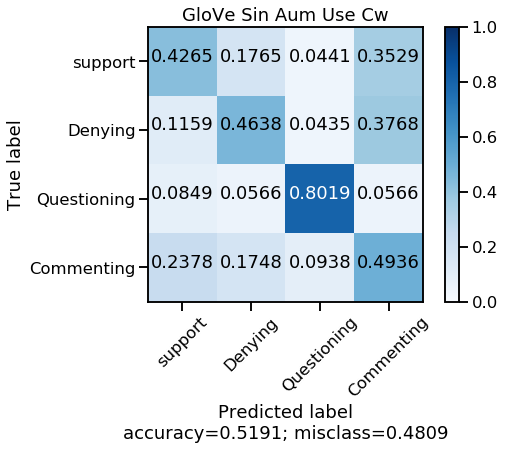

Test_ acc: 0.5190989226248776
Test_ f1 none: [0.19397993 0.25098039 0.62962963 0.63054187]
Test_ f1 macro: 0.42628295670451066
Encoder Layer Attention head 0
Encoder Layer Attention head 1
Entrenando Run # 3
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	None: tensor([0.3061, 0.1015, 0.0159, 0.2887], dtype=torch.float64) 	F-ma: tensor(0.1780, dtype=torch.float64)
Epoch 10 	None: tensor([0.5394, 0.1127, 0.0000, 0.4651], dtype=torch.float64) 	F-ma: tensor(0.2793, dtype=torch.float64)
Epoch 20 	None: tensor([0.5050, 0.2310, 0.6984, 0.5970], dtype=torch.float64) 	F-ma: tensor(0.5079, dtype=torch.float64)
Epoch 30 	None: tensor([0.5026, 0.1561, 0.7058, 0.5763], dtype=torch.float64) 	F-ma: tensor(0.4852, dtype=torch.float64)
Epoch 40 	None: tensor([0.5157, 0.2635, 0.6091, 0.5805], dtype=torch.float64) 	F-ma: tensor(0.4922, dtype=torch.float64)
Epoch 50 	None: tensor([0.5294, 0.2116, 0.6054, 0.5977], dtype=torch.f

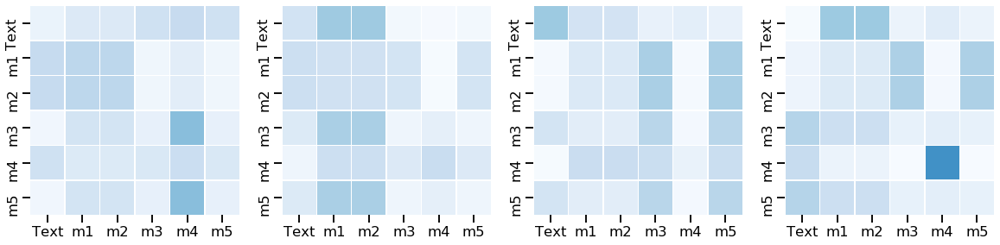

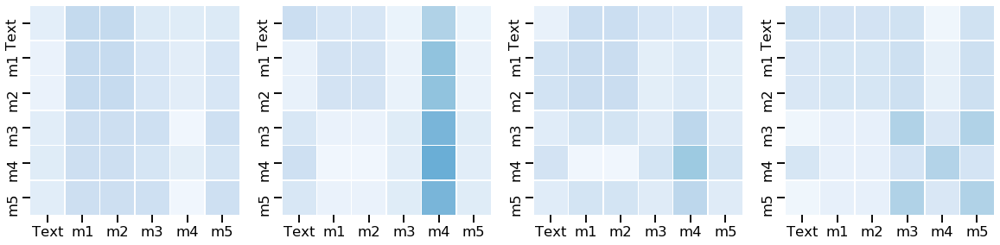

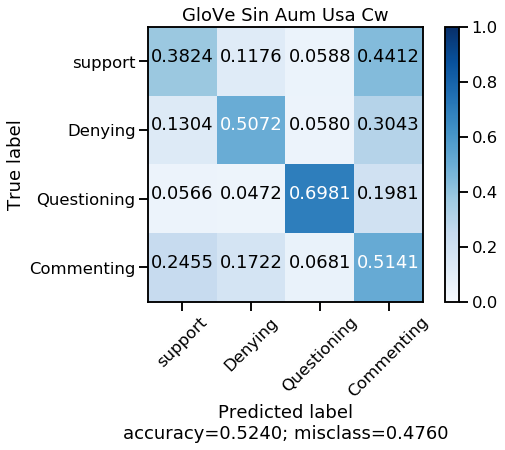

Test_ acc: 0.5239960822722821
Test_ f1 none: [0.17333333 0.27888446 0.61410788 0.64      ]
Test_ f1 macro: 0.42658141982553877


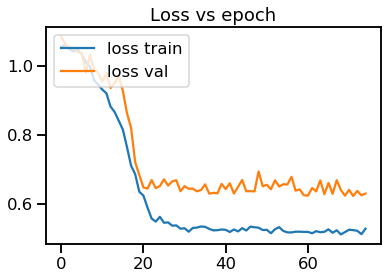

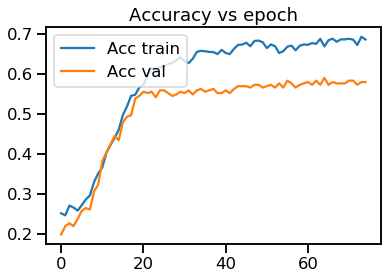

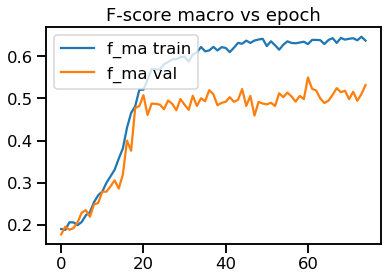

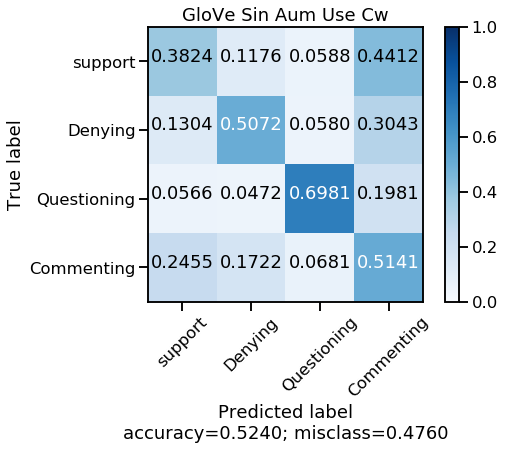

Test_ acc: 0.5239960822722821
Test_ f1 none: [0.17333333 0.27888446 0.61410788 0.64      ]
Test_ f1 macro: 0.42658141982553877
Encoder Layer Attention head 0
Encoder Layer Attention head 1
Entrenando Run # 4
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	None: tensor([0.2420, 0.0000, 0.3228, 0.6364], dtype=torch.float64) 	F-ma: tensor(0.3003, dtype=torch.float64)
Epoch 10 	None: tensor([0.4621, 0.0444, 0.4904, 0.5212], dtype=torch.float64) 	F-ma: tensor(0.3795, dtype=torch.float64)
Epoch 20 	None: tensor([0.5344, 0.2262, 0.5794, 0.5333], dtype=torch.float64) 	F-ma: tensor(0.4683, dtype=torch.float64)
Epoch 30 	None: tensor([0.5528, 0.2219, 0.6255, 0.5522], dtype=torch.float64) 	F-ma: tensor(0.4881, dtype=torch.float64)
Epoch 40 	None: tensor([0.5302, 0.1429, 0.5340, 0.5328], dtype=torch.float64) 	F-ma: tensor(0.4350, dtype=torch.float64)
Epoch 50 	None: tensor([0.5363, 0.2111, 0.6095, 0.5507], dtype=torch.f

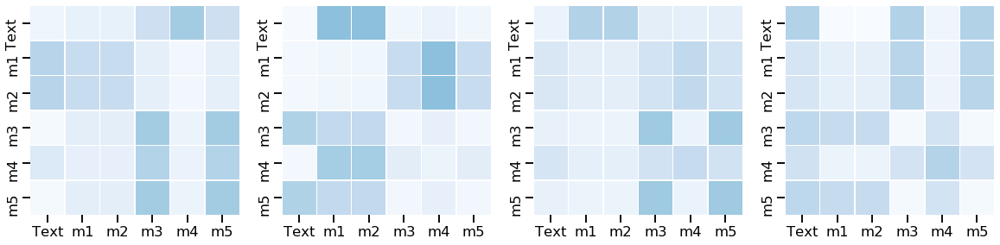

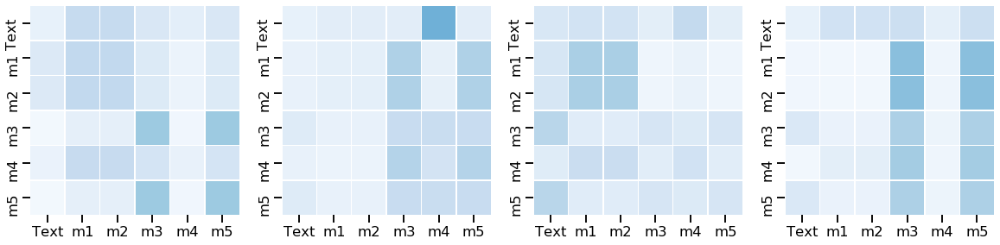

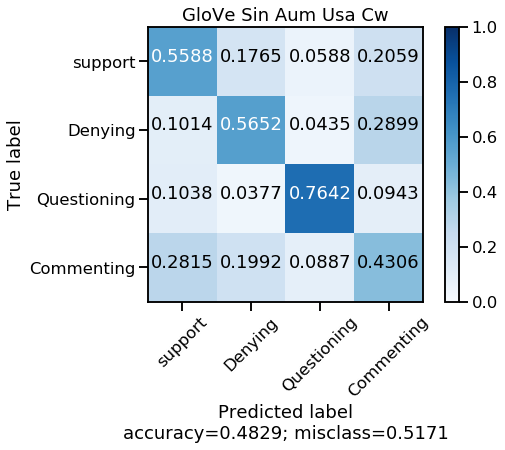

Test_ acc: 0.4828599412340842
Test_ f1 none: [0.22157434 0.27956989 0.61596958 0.57908384]
Test_ f1 macro: 0.4240494139390738


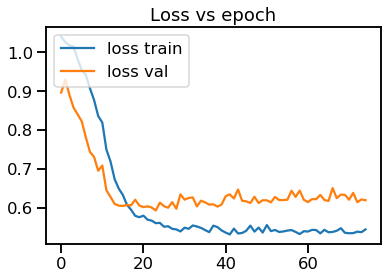

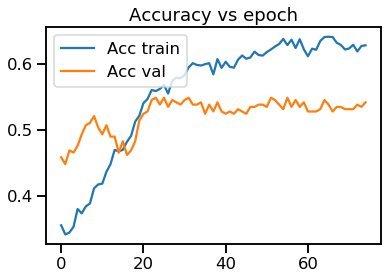

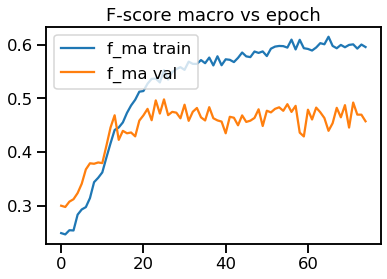

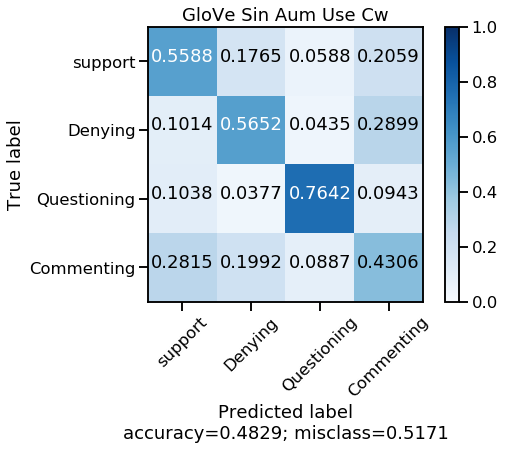

Test_ acc: 0.4828599412340842
Test_ f1 none: [0.22157434 0.27956989 0.61596958 0.57908384]
Test_ f1 macro: 0.4240494139390738
Encoder Layer Attention head 0
Encoder Layer Attention head 1
Entrenando Run # 5
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	None: tensor([0.1942, 0.1313, 0.2307, 0.4343], dtype=torch.float64) 	F-ma: tensor(0.2476, dtype=torch.float64)
Epoch 10 	None: tensor([0.4821, 0.1863, 0.5922, 0.5030], dtype=torch.float64) 	F-ma: tensor(0.4409, dtype=torch.float64)
Epoch 20 	None: tensor([0.5294, 0.1719, 0.6630, 0.5905], dtype=torch.float64) 	F-ma: tensor(0.4887, dtype=torch.float64)
Epoch 30 	None: tensor([0.5211, 0.1462, 0.7117, 0.6257], dtype=torch.float64) 	F-ma: tensor(0.5012, dtype=torch.float64)
Epoch 40 	None: tensor([0.5358, 0.1503, 0.6771, 0.6643], dtype=torch.float64) 	F-ma: tensor(0.5068, dtype=torch.float64)
Epoch 50 	None: tensor([0.5483, 0.1984, 0.7034, 0.6637], dtype=torch.fl

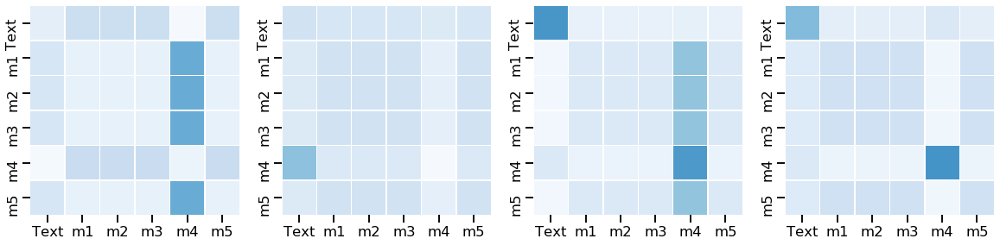

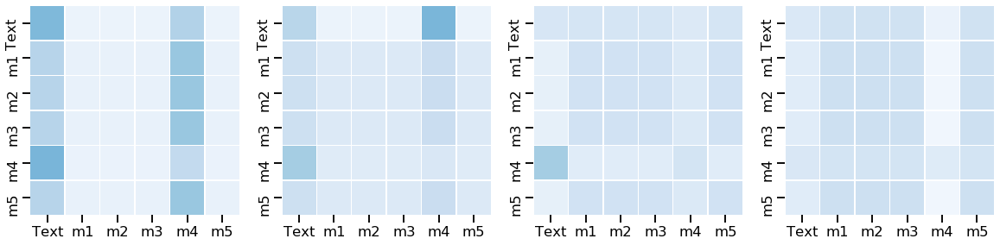

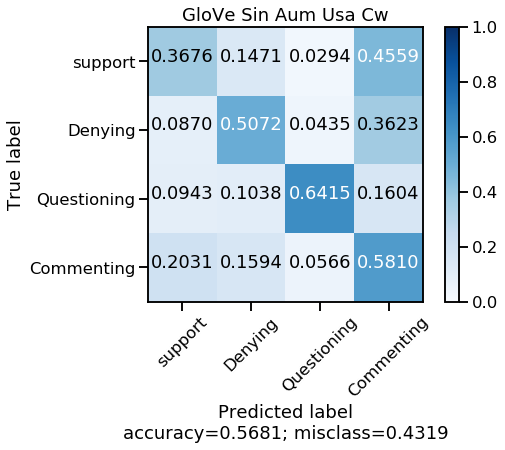

Test_ acc: 0.5680705190989226
Test_ f1 none: [0.18726592 0.2811245  0.60986547 0.69378358]
Test_ f1 macro: 0.4430098657023057


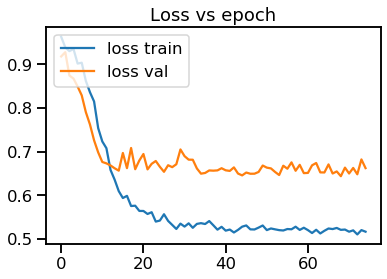

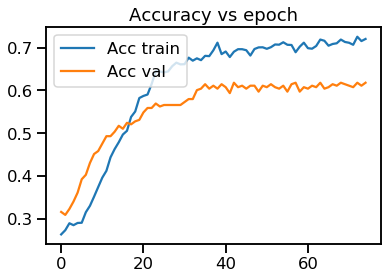

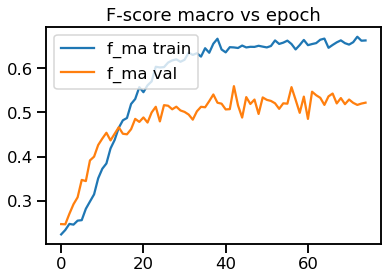

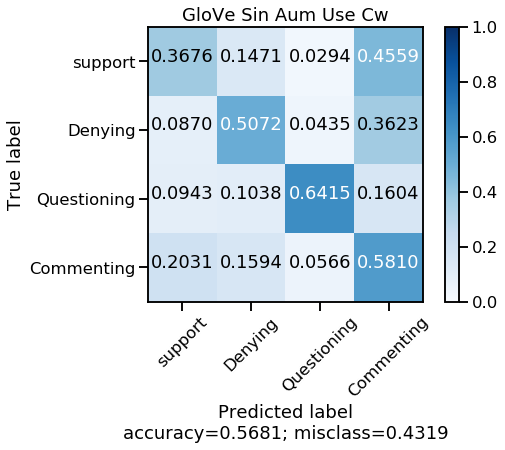

Test_ acc: 0.5680705190989226
Test_ f1 none: [0.18726592 0.2811245  0.60986547 0.69378358]
Test_ f1 macro: 0.4430098657023057
Encoder Layer Attention head 0
Encoder Layer Attention head 1
Set de experimentos
Acc: 0.5247796278158668
F-score: 0.4276724355139307
(0.0_Use CW) S-D-Q-C: 0.18564895656457456 0.2617482125910323 0.6239145132096249 0.6393780596904911


Confusion counts


ENTRENANDO CON MINI BATCH 32 y WARMUP 6000 


Entrenando Run # 1
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	None: tensor([0.0703, 0.0361, 0.0926, 0.1756], dtype=torch.float64) 	F-ma: tensor(0.0936, dtype=torch.float64)
Epoch 10 	None: tensor([0.0480, 0.0846, 0.4819, 0.3475], dtype=torch.float64) 	F-ma: tensor(0.2405, dtype=torch.float64)
Epoch 20 	None: tensor([0.4996, 0.2063, 0.5956, 0.7104], dtype=torch.float64) 	F-ma: tensor(0.5030, dtype=torch.float64)
Epoch 30 	None: tensor([0.5705, 0.1397, 0.6065, 0.6593], dtype=torch.float6

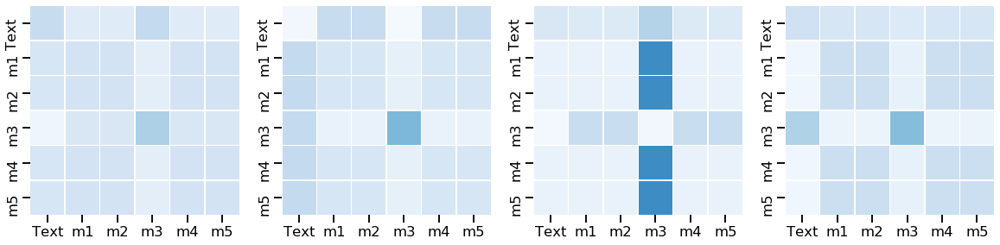

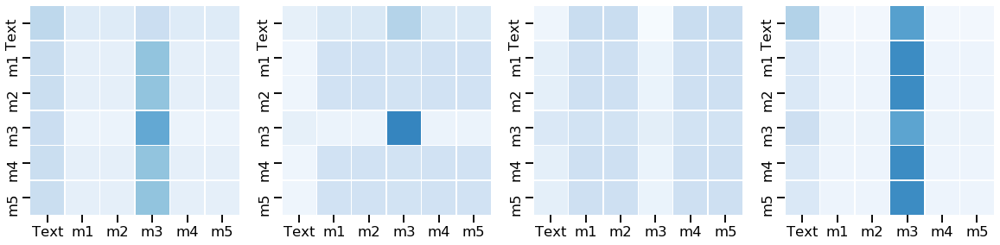

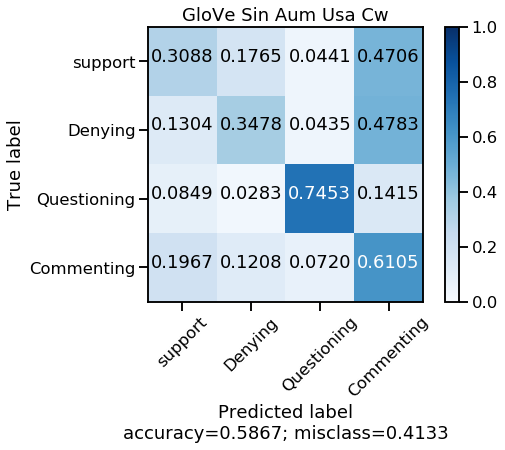

Test_ acc: 0.5866797257590598
Test_ f1 none: [0.16153846 0.23762376 0.63967611 0.71267817]
Test_ f1 macro: 0.4378791267043522


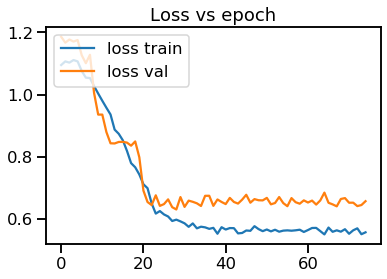

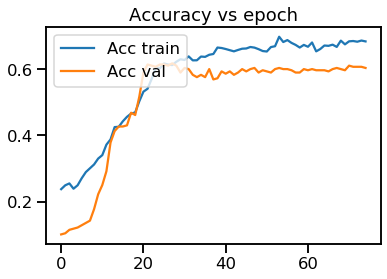

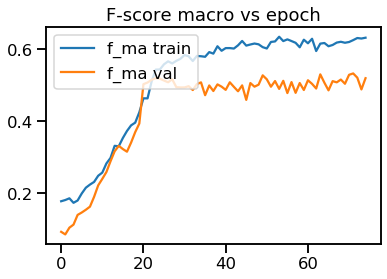

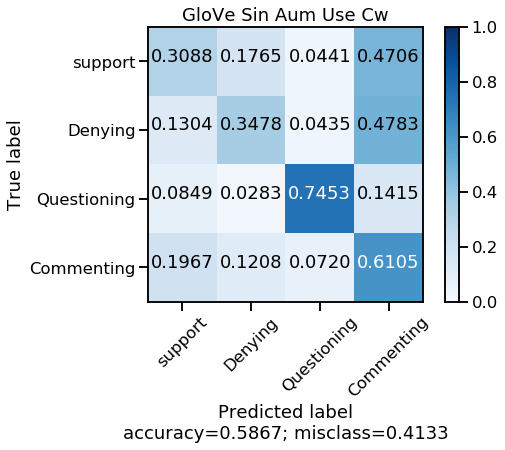

Test_ acc: 0.5866797257590598
Test_ f1 none: [0.16153846 0.23762376 0.63967611 0.71267817]
Test_ f1 macro: 0.4378791267043522
Encoder Layer Attention head 0
Encoder Layer Attention head 1
Entrenando Run # 2
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	None: tensor([0.0986, 0.0695, 0.1851, 0.0816], dtype=torch.float64) 	F-ma: tensor(0.1087, dtype=torch.float64)
Epoch 10 	None: tensor([0.4720, 0.1278, 0.3729, 0.1246], dtype=torch.float64) 	F-ma: tensor(0.2743, dtype=torch.float64)
Epoch 20 	None: tensor([0.4751, 0.1802, 0.6272, 0.4100], dtype=torch.float64) 	F-ma: tensor(0.4231, dtype=torch.float64)
Epoch 30 	None: tensor([0.5283, 0.1820, 0.7123, 0.6281], dtype=torch.float64) 	F-ma: tensor(0.5127, dtype=torch.float64)
Epoch 40 	None: tensor([0.5483, 0.1815, 0.7180, 0.6868], dtype=torch.float64) 	F-ma: tensor(0.5336, dtype=torch.float64)
Epoch 50 	None: tensor([0.5267, 0.2389, 0.6371, 0.6659], dtype=torch.fl

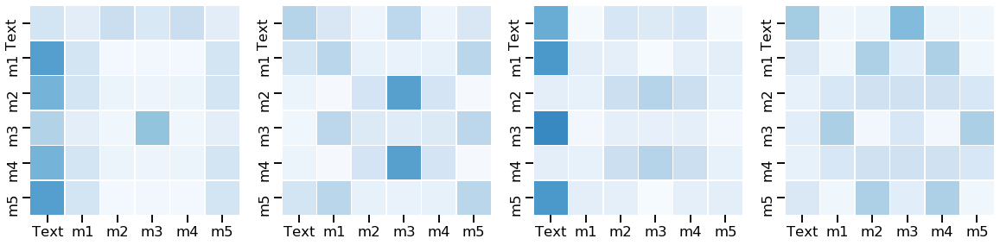

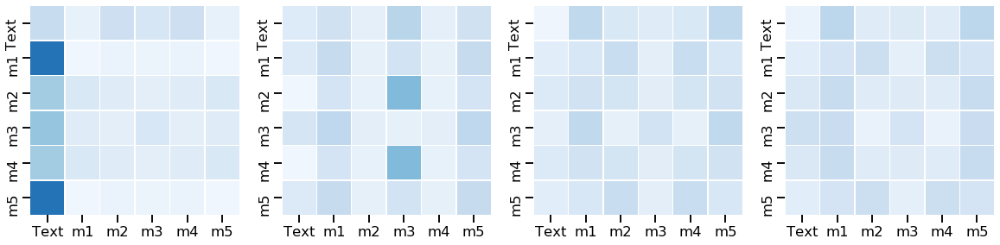

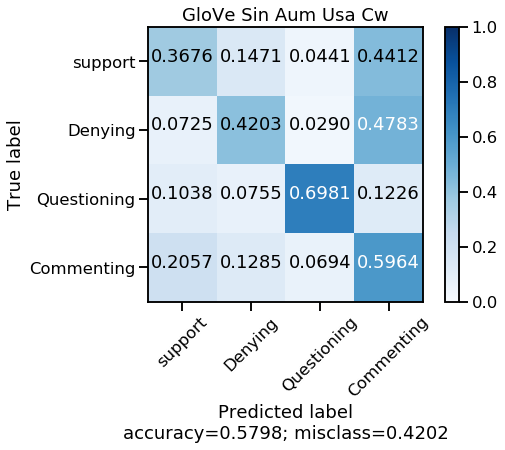

Test_ acc: 0.5798237022526934
Test_ f1 none: [0.18587361 0.26851852 0.61924686 0.70409712]
Test_ f1 macro: 0.4444340258087157


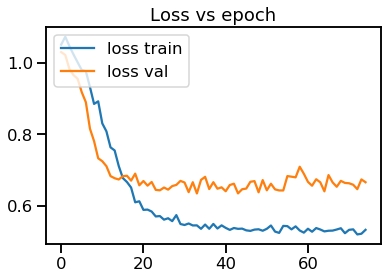

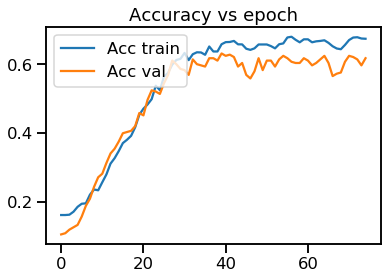

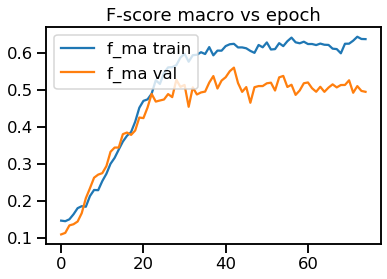

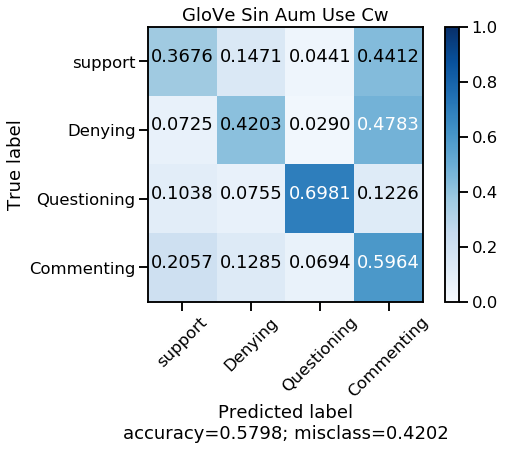

Test_ acc: 0.5798237022526934
Test_ f1 none: [0.18587361 0.26851852 0.61924686 0.70409712]
Test_ f1 macro: 0.4444340258087157
Encoder Layer Attention head 0
Encoder Layer Attention head 1
Entrenando Run # 3
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	None: tensor([0.0556, 0.1825, 0.1104, 0.3681], dtype=torch.float64) 	F-ma: tensor(0.1791, dtype=torch.float64)
Epoch 10 	None: tensor([0.3225, 0.1254, 0.4783, 0.1870], dtype=torch.float64) 	F-ma: tensor(0.2783, dtype=torch.float64)
Epoch 20 	None: tensor([0.5159, 0.2466, 0.6038, 0.5622], dtype=torch.float64) 	F-ma: tensor(0.4821, dtype=torch.float64)
Epoch 30 	None: tensor([0.5333, 0.2000, 0.6794, 0.6136], dtype=torch.float64) 	F-ma: tensor(0.5066, dtype=torch.float64)
Epoch 40 	None: tensor([0.5525, 0.1741, 0.5932, 0.6157], dtype=torch.float64) 	F-ma: tensor(0.4839, dtype=torch.float64)
Epoch 50 	None: tensor([0.5518, 0.3037, 0.6339, 0.5992], dtype=torch.fl

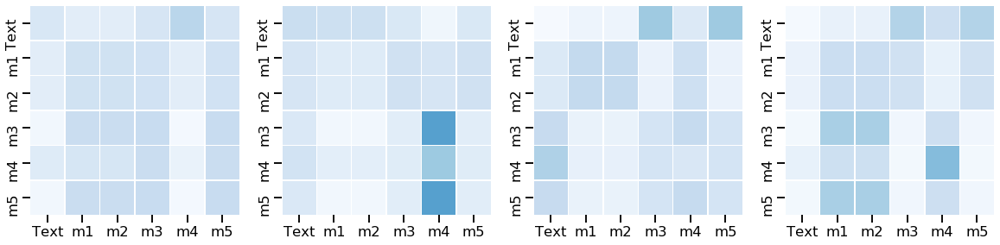

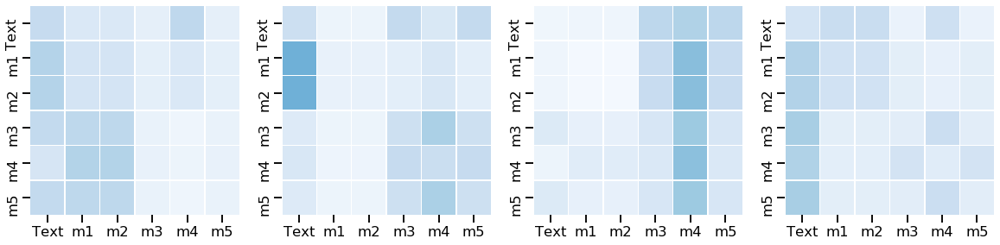

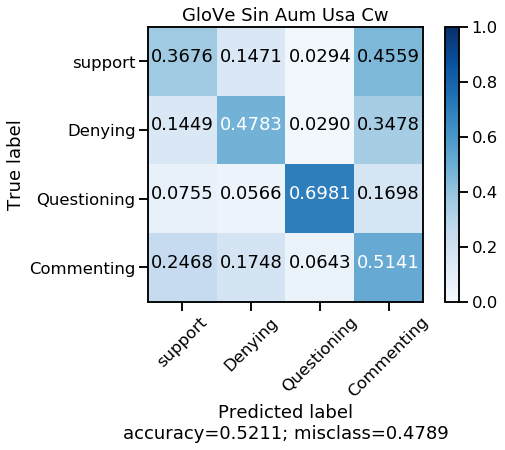

Test_ acc: 0.5210577864838394
Test_ f1 none: [0.1650165  0.25984252 0.63247863 0.63948841]
Test_ f1 macro: 0.4242065157716047


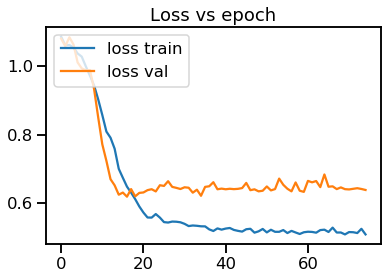

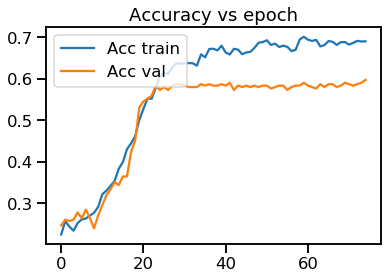

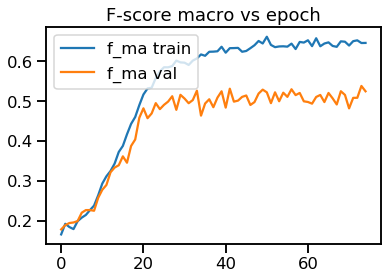

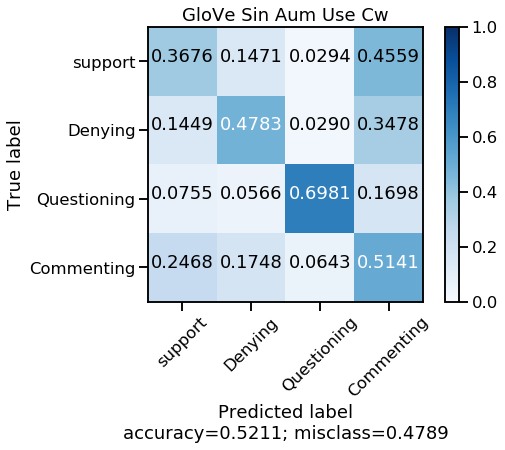

Test_ acc: 0.5210577864838394
Test_ f1 none: [0.1650165  0.25984252 0.63247863 0.63948841]
Test_ f1 macro: 0.4242065157716047
Encoder Layer Attention head 0
Encoder Layer Attention head 1
Entrenando Run # 4
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	None: tensor([0.1804, 0.2481, 0.0000, 0.6862], dtype=torch.float64) 	F-ma: tensor(0.2787, dtype=torch.float64)
Epoch 10 	None: tensor([0.4015, 0.1852, 0.1728, 0.6352], dtype=torch.float64) 	F-ma: tensor(0.3487, dtype=torch.float64)
Epoch 20 	None: tensor([0.5637, 0.1746, 0.5842, 0.5710], dtype=torch.float64) 	F-ma: tensor(0.4734, dtype=torch.float64)
Epoch 30 	None: tensor([0.5727, 0.1451, 0.5737, 0.5359], dtype=torch.float64) 	F-ma: tensor(0.4568, dtype=torch.float64)
Epoch 40 	None: tensor([0.5458, 0.1753, 0.6380, 0.5374], dtype=torch.float64) 	F-ma: tensor(0.4742, dtype=torch.float64)
Epoch 50 	None: tensor([0.5289, 0.1889, 0.5500, 0.5845], dtype=torch.fl

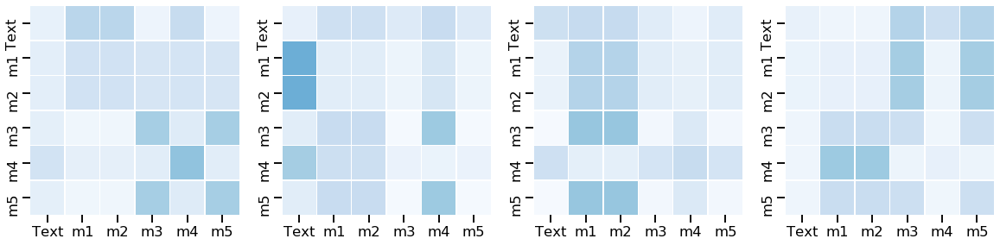

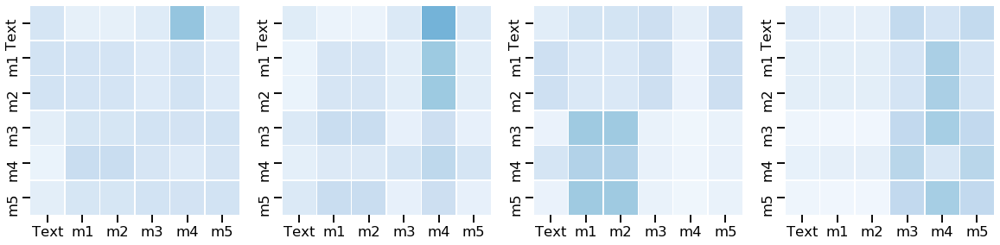

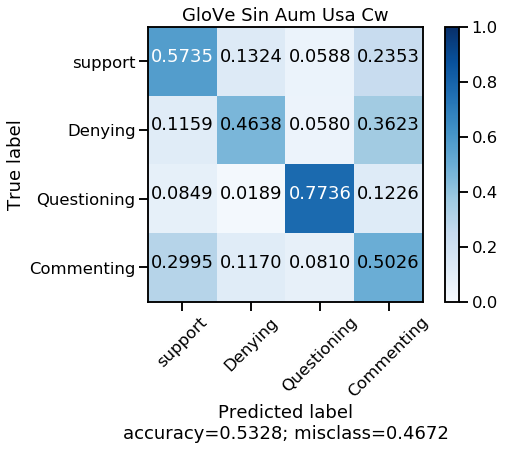

Test_ acc: 0.5328109696376102
Test_ f1 none: [0.21848739 0.31527094 0.63320463 0.63941128]
Test_ f1 macro: 0.451593561962936


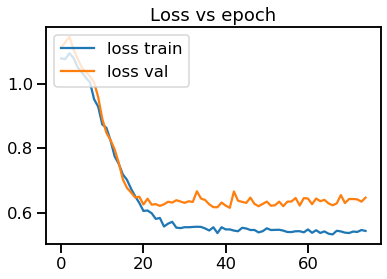

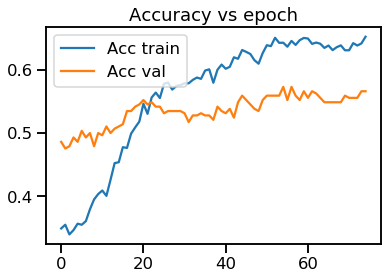

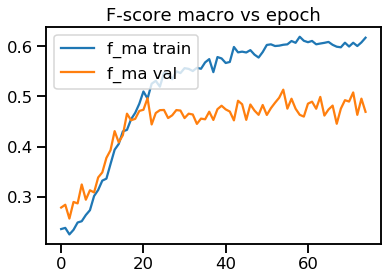

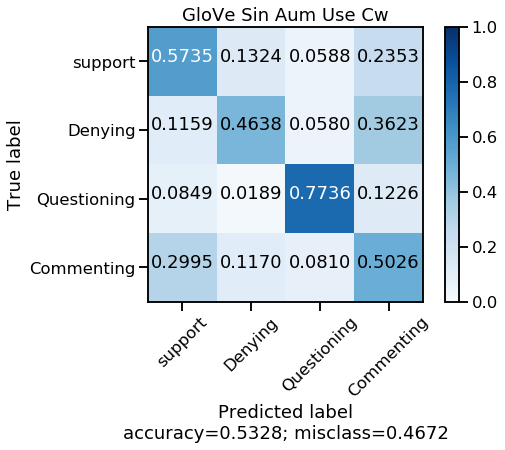

Test_ acc: 0.5328109696376102
Test_ f1 none: [0.21848739 0.31527094 0.63320463 0.63941128]
Test_ f1 macro: 0.451593561962936
Encoder Layer Attention head 0
Encoder Layer Attention head 1
Entrenando Run # 5
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	None: tensor([0.2210, 0.0444, 0.2313, 0.1286], dtype=torch.float64) 	F-ma: tensor(0.1563, dtype=torch.float64)
Epoch 10 	None: tensor([0.4646, 0.0000, 0.4079, 0.2216], dtype=torch.float64) 	F-ma: tensor(0.2735, dtype=torch.float64)
Epoch 20 	None: tensor([0.4969, 0.0778, 0.5982, 0.3706], dtype=torch.float64) 	F-ma: tensor(0.3859, dtype=torch.float64)
Epoch 30 	None: tensor([0.5318, 0.1521, 0.6562, 0.6257], dtype=torch.float64) 	F-ma: tensor(0.4914, dtype=torch.float64)
Epoch 40 	None: tensor([0.5135, 0.1762, 0.6474, 0.6547], dtype=torch.float64) 	F-ma: tensor(0.4980, dtype=torch.float64)
Epoch 50 	None: tensor([0.5611, 0.1206, 0.6025, 0.6713], dtype=torch.flo

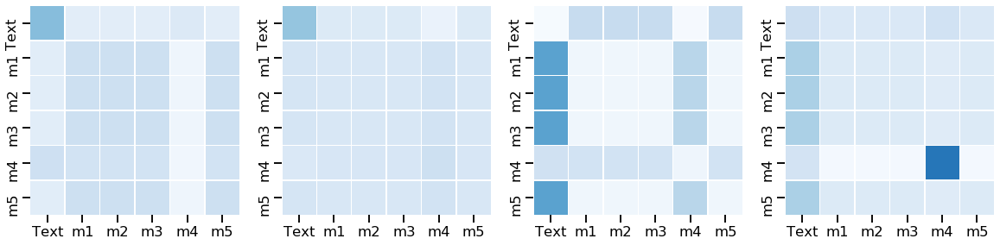

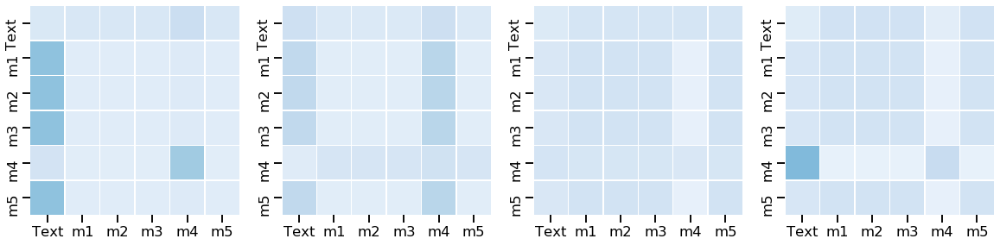

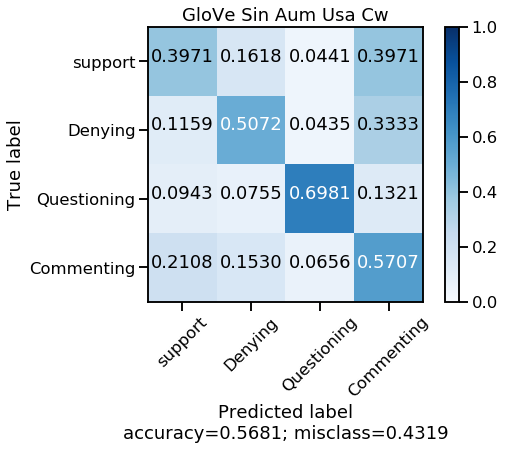

Test_ acc: 0.5680705190989226
Test_ f1 none: [0.19494585 0.2892562  0.62447257 0.69051322]
Test_ f1 macro: 0.44979695996170616


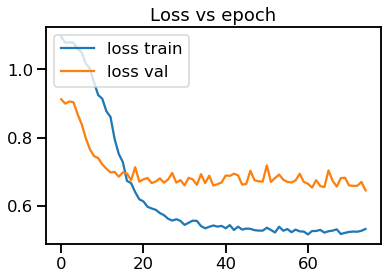

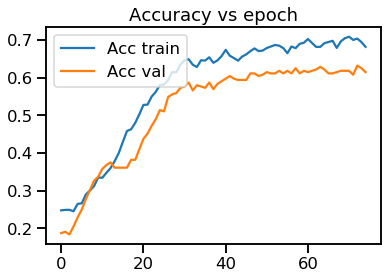

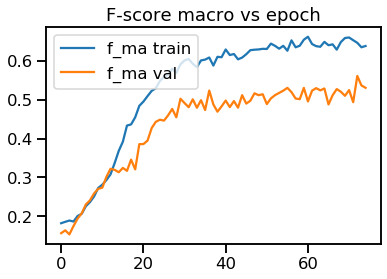

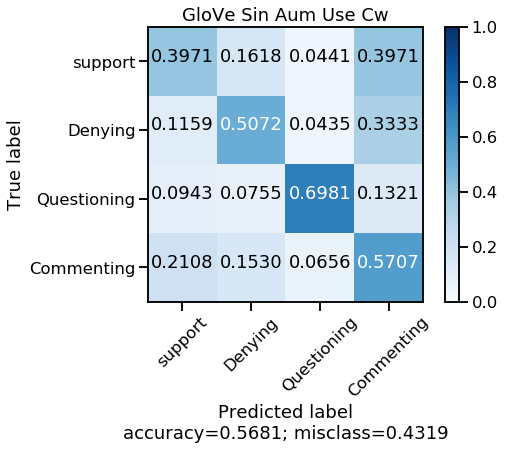

Test_ acc: 0.5680705190989226
Test_ f1 none: [0.19494585 0.2892562  0.62447257 0.69051322]
Test_ f1 macro: 0.44979695996170616
Encoder Layer Attention head 0
Encoder Layer Attention head 1
Set de experimentos
Acc: 0.557688540646425
F-score: 0.4415820380418629
(0.0_Use CW) S-D-Q-C: 0.18517236249400326 0.2741023869774989 0.6298157629615877 0.677237639734362


Confusion counts


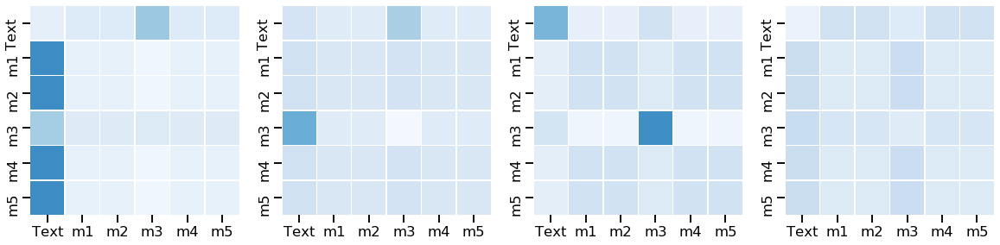

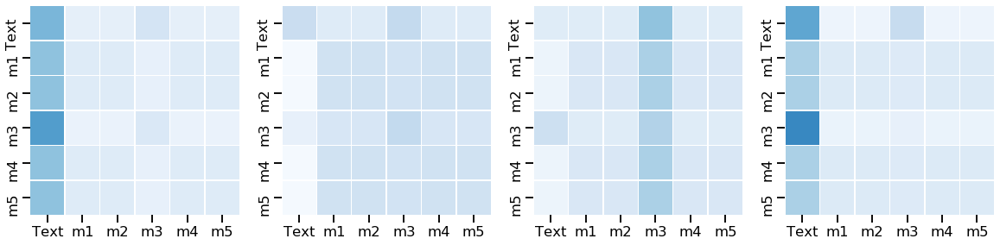

In [16]:
warms=[4000, 5000, 6000]

for war in warms:
    print ("\n\nENTRENANDO CON MINI BATCH 32 y WARMUP", war, "\n\n")
    global_accs=[]
    global_fnones=[]
    global_fmacros=[]
    global_cms=[]
    global_attn=[]
    dict_attn_enc={'00':[], '01':[], '02':[], '03':[], '10':[], '11':[], '12':[], '13':[]}

    prob=0.0

    for trans in range(1,6): 
        print ("Entrenando Run #", trans)
        cnn1 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'_cw/cnn1_'+str(trans)+'-exec.h5')
        cnn2 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'_cw/cnn2_'+str(trans)+'-exec.h5')
        rnn1 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'_cw/rnn1_'+str(trans)+'-exec.h5')
        rnn2 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'_cw/rnn2_'+str(trans)+'-exec.h5')
        rnn3 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'_cw/rnn3_'+str(trans)+'-exec.h5')

        list_models=['cnn1', 'cnn2', 'rnn1', 'rnn2', 'rnn3']
        index_models=np.arange(5)
        dict_models=dict((key, value) for (key, value) in zip(index_models,list_models))
        modelos=[cnn1, cnn2, rnn1, rnn2, rnn3]
        ind=np.arange(5)
        dict_trainedModel=dict((key, value) for (key, value) in zip(ind,modelos))

        #bs=64
        b_dim=768

        predicciones_all=[]
        predicciones_all_val=[]
        predicciones_all_test=[]

        print ("agregando predicciones Train")
        for i in dict_trainedModel.keys(): 
            a_evaluar=dict_models[i]
            predicciones_all.append(dict_trainedModel[i].predict(x_train, batch_size=bs))
        print ("agregando predicciones Val")
        for i in dict_trainedModel.keys(): 
            a_evaluar=dict_models[i]
            predicciones_all_val.append(dict_trainedModel[i].predict(x_val, batch_size=bs))
        print ("agregando predicciones Test")
        for i in dict_trainedModel.keys(): 
            a_evaluar=dict_models[i]
            predicciones_all_test.append(dict_trainedModel[i].predict(x_test, batch_size=bs))

        matrix=np.asarray(predicciones_all)
        matrix_val=np.asarray(predicciones_all_val)
        matrix_test=np.asarray(predicciones_all_test)
        new_matrix=np.concatenate([matrix,matrix_val,matrix_test], axis=1)


        espacio=[np.ones(b_dim)]
        #Ks=np.load("../../BERTransformer/Orthogonals_768.npy")

        espacio=[np.ones(b_dim)]
        Ks= ortho_group.rvs(dim=b_dim)
        random=np.random.randint(Ks.shape[0], size=4)
        K_list=Ks[random]
        K_list_ext=espacio+list(K_list)
        index_embeddings=[0,1,2,3,4]
        lab_str_embeddings=['','','','','']

        for i in range(len(sentences)):
            #ide=ids_train[i]
            tw_tr=tws_train[i]
            clase=dict_cl[labels_train[i]]
            encoded_tok, sentence_valid = my_tokenizer(cleaner(tw_tr)[1])  #cleaner: raw, no cleaner:augmented version

            final=' '
            frase=[final.join(sentence_valid)]
            try: 
                vector= bc.encode(frase)[0]  
                #norm=np.linalg.norm(vector)
                final_bert= vector #/ norm
            except: 
                final_bert= np.zeros(b_dim)

            index_embeddings.append(i+5)
            lab_str_embeddings.append(clase)
            K_list_ext.append(final_bert)

        objs_val=val['Tw_id']      #df_val['Unnamed: 0'].values
        objs_test=test['Tw_id']    #np.arange(df_test.shape[0])
        lab_val=val['Label']
        lab_test=test['Label']
        tw_val=val['Tweet']
        tw_test=test['Tweet']
        llaves=np.concatenate([objs_val,objs_test])
        clases=np.concatenate([lab_val,lab_test])
        sent_all=np.concatenate([tw_val,tw_test])

        for num in range(len(llaves)):
            i=llaves[num]
            clase=clases[num]
            tw_tr=sent_all[num]
            #vector=np.load("../BaS_Original/Original/"+str(i)+".npy")
            encoded_tok, tokens_valid =my_tokenizer(cleaner(tw_tr)[1])

            final=' '
            frase=[final.join(tokens_valid)]
            try: 
                vector= bc.encode(frase)[0]    
                #norm=np.linalg.norm(vector)
                final_bert= vector #/ norm
            except: 
                final_bert= np.zeros(b_dim)

            index_embeddings.append(num+5+train.shape[0])
            lab_str_embeddings.append(clase)
            K_list_ext.append(final_bert)

        K_list_new= np.asarray(K_list_ext, dtype='float32')

        ###################################### TRANSFORMER ###############################
        bs=32
        hist_train_loss=[]
        hist_train_acc=[]
        hist_train_fma=[]
        hist_val_loss=[]
        hist_val_acc=[]
        hist_val_fma=[]
        V = 4
        pesos = torch.from_numpy(class_weights).float()
        criterion = FocalLoss(weights=pesos)
        model = make_model_concat(4, N=2,d_model=b_dim, d_ff=128, h=4, dropout=0.35)
        model_opt = NoamOpt(model.src_embed[0].d_model, 1, war, torch.optim.Adam(model.parameters(), lr=0, betas=(0.9, 0.98), eps=1e-5))

        for epoch in range(75):
            model.train()
            DATA=data_gen(bs, 'Train', 5, new_matrix)
            loss_train, acc_train,fma_train, f_none, cm_train=run_epoch(DATA, model, SimpleLossComputeFL(criterion, model_opt), 'Train')
            hist_train_loss.append(loss_train)
            hist_train_acc.append(acc_train)
            hist_train_fma.append(fma_train)

            model.eval()
            loss_val, acc_val,fma_val, f_val_none, cm_val=run_epoch(data_gen(bs, 'Val', 5, new_matrix), model, SimpleLossComputeFL(criterion, None),'Val')
            if epoch%10==0:
                print ("Epoch",epoch, "\tNone:",f_val_none, "\tF-ma:",fma_val)
            hist_val_loss.append(loss_val)
            hist_val_acc.append(acc_val)
            hist_val_fma.append(fma_val)

        model.eval()
        print ("Testing run #",trans)
        predicciones = run_epoch(data_gen(bs, 'Test', 5, new_matrix), model, SimpleLossComputeFL(criterion, None),'Test')
        predicciones=np.concatenate(predicciones, axis=-1)
        
        if bs==50: 
            r=29
        else: 
            r=3
        glo_acc=accuracy_score(etiq_t, predicciones[:-r])
        glo_fno=f1_score(etiq_t,predicciones[:-r], average=None)
        glo_fma=f1_score(etiq_t,predicciones[:-r], average='macro')

        glo_cm=confusion_matrix(etiq_t, predicciones[:-r])

        plot_confusion_matrix(glo_cm,["support","Denying","Questioning","Commenting"],"GloVe Sin Aum Usa Cw")
        global_accs.append(glo_acc)
        global_fnones.append(glo_fno)
        global_fmacros.append(glo_fma)
        global_cms.append(glo_cm)
        print("Test_ acc:",glo_acc) 
        print("Test_ f1 none:",glo_fno) 
        print("Test_ f1 macro:",glo_fma) 

        plt.plot(hist_train_loss, label='loss train')
        plt.plot(hist_val_loss,label='loss val')
        plt.legend(loc='upper left')
        plt.title("Loss vs epoch")
        plt.show()

        plt.plot(hist_train_acc, label='Acc train')
        plt.plot(hist_val_acc, label='Acc val')
        plt.legend(loc='upper left')
        plt.title("Accuracy vs epoch")
        plt.show()

        plt.plot(hist_train_fma, label='f_ma train')
        plt.plot(hist_val_fma, label='f_ma val')
        plt.legend(loc='upper left')
        plt.title("F-score macro vs epoch")
        plt.show()
        #"""

        plot_confusion_matrix(glo_cm,["support","Denying","Questioning","Commenting"],"GloVe Sin Aum Use Cw")
        global_accs.append(glo_acc)
        global_fnones.append(glo_fno)
        global_fmacros.append(glo_fma)
        global_cms.append(glo_cm)
        print("Test_ acc:",glo_acc) 
        print("Test_ f1 none:",glo_fno) 
        print("Test_ f1 macro:",glo_fma) 

        label=[['Text', 'm1', 'm2','m3','m4','m5']]
        for layer in range(2):
            fig, axs = plt.subplots(1,4, figsize=(20, 10))
            print ("Encoder Layer Attention head", layer)
            for head in range(4):
                matriz_attn=model.encoder.layers[layer].self_attn.attn[0,head].data
                dict_attn_enc[str(layer)+str(head)].append(matriz_attn)
                sns.heatmap(matriz_attn, xticklabels=label[0], yticklabels=label[0],
                            vmin=0.0, vmax=1.0, linewidths=.5, cmap="Blues", cbar=False, square=True, ax=axs[head]) #, annot=False,cbar_kws={"orientation": "horizontal","pad": 0.25})
            #plt.show()

    #CIARP
    #final
    print ("Set de experimentos")
    print ("Acc:",np.mean(np.asarray(global_accs)))
    print ("F-score:", np.mean(np.asarray(global_fmacros)))
    sup=np.mean(np.asarray(global_fnones)[:,0])
    den=np.mean(np.asarray(global_fnones)[:,1])
    que=np.mean(np.asarray(global_fnones)[:,2])
    com=np.mean(np.asarray(global_fnones)[:,3])

    print ("(0.0_Use CW) S-D-Q-C:", sup,den,que,com)

    print ("\n\nConfusion counts")
    m_temp=np.zeros((4,4))
    for m in global_cms:
        m_temp+=np.asarray(m)

    m_temp

### Best 



ENTRENANDO CON MINI BATCH  32 


Entrenando Run # 1
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	None: tensor([0.3648, 0.0000, 0.0370, 0.3317], dtype=torch.float64) 	F-ma: tensor(0.1834, dtype=torch.float64)
Epoch 10 	None: tensor([0.5117, 0.1167, 0.3409, 0.4401], dtype=torch.float64) 	F-ma: tensor(0.3523, dtype=torch.float64)
Epoch 20 	None: tensor([0.5645, 0.0960, 0.5926, 0.5746], dtype=torch.float64) 	F-ma: tensor(0.4569, dtype=torch.float64)
Epoch 30 	None: tensor([0.5590, 0.1296, 0.6942, 0.6152], dtype=torch.float64) 	F-ma: tensor(0.4995, dtype=torch.float64)
Epoch 40 	None: tensor([0.5333, 0.2000, 0.6172, 0.6393], dtype=torch.float64) 	F-ma: tensor(0.4974, dtype=torch.float64)
Epoch 50 	None: tensor([0.5077, 0.1947, 0.6384, 0.6294], dtype=torch.float64) 	F-ma: tensor(0.4926, dtype=torch.float64)
Epoch 60 	None: tensor([0.5222, 0.1635, 0.6554, 0.6305], dtype=torch.float64) 	F-ma: tensor(0.4929, dty

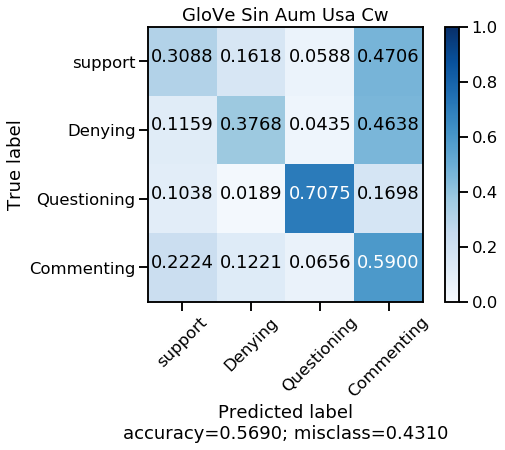

Test_ acc: 0.5690499510284035
Test_ f1 none: [0.14946619 0.25615764 0.62761506 0.6959818 ]
Test_ f1 macro: 0.43230517369939386


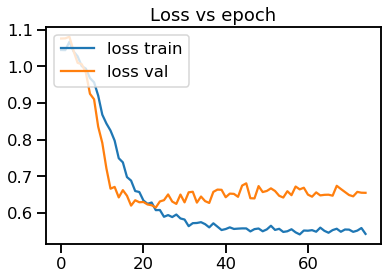

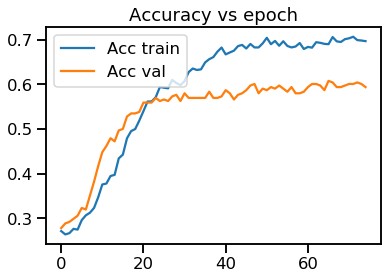

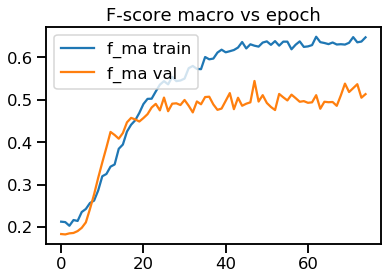

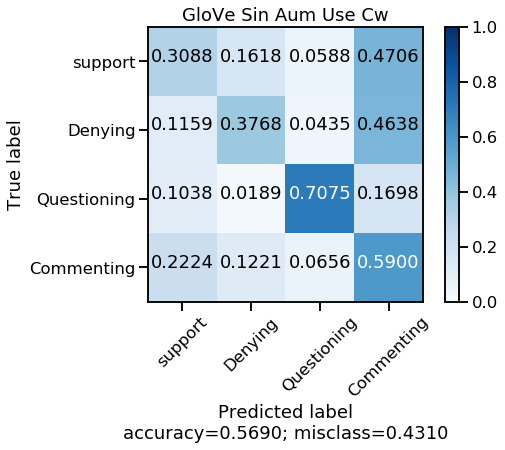

Test_ acc: 0.5690499510284035
Test_ f1 none: [0.14946619 0.25615764 0.62761506 0.6959818 ]
Test_ f1 macro: 0.43230517369939386
Encoder Layer Attention head 0
Encoder Layer Attention head 1
Entrenando Run # 2
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	None: tensor([0.0500, 0.0595, 0.1391, 0.3762], dtype=torch.float64) 	F-ma: tensor(0.1562, dtype=torch.float64)
Epoch 10 	None: tensor([0.4342, 0.0925, 0.2872, 0.4435], dtype=torch.float64) 	F-ma: tensor(0.3143, dtype=torch.float64)
Epoch 20 	None: tensor([0.5650, 0.1611, 0.5379, 0.5886], dtype=torch.float64) 	F-ma: tensor(0.4631, dtype=torch.float64)
Epoch 30 	None: tensor([0.5301, 0.1938, 0.5908, 0.5606], dtype=torch.float64) 	F-ma: tensor(0.4688, dtype=torch.float64)
Epoch 40 	None: tensor([0.5353, 0.2605, 0.5990, 0.6608], dtype=torch.float64) 	F-ma: tensor(0.5139, dtype=torch.float64)
Epoch 50 	None: tensor([0.5501, 0.3651, 0.6072, 0.6446], dtype=torch.f

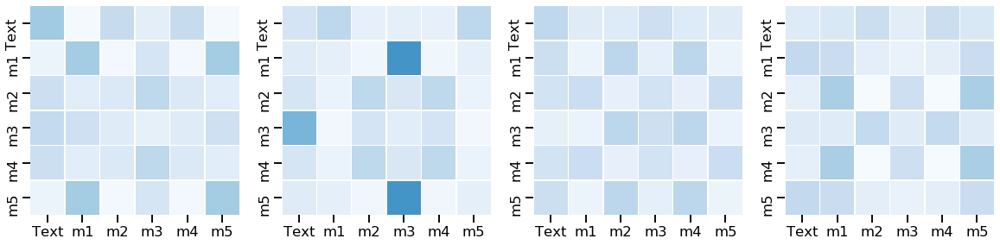

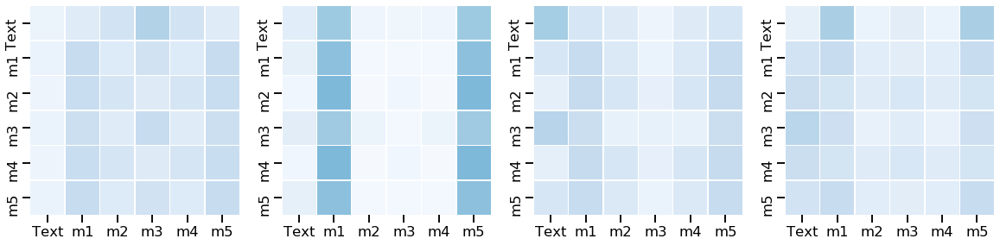

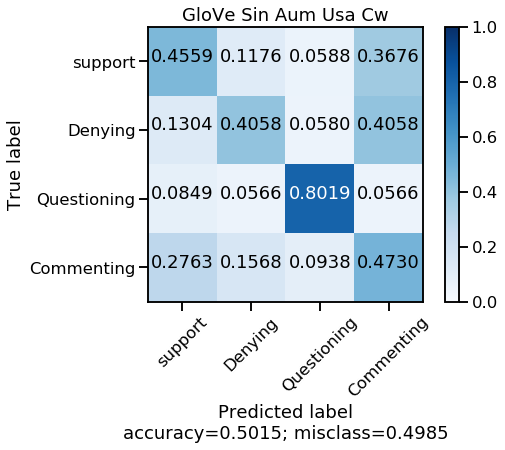

Test_ acc: 0.5014691478942214
Test_ f1 none: [0.18674699 0.24034335 0.625      0.61078838]
Test_ f1 macro: 0.41571967933350773


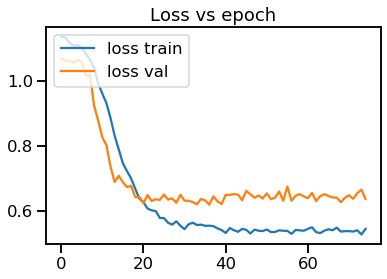

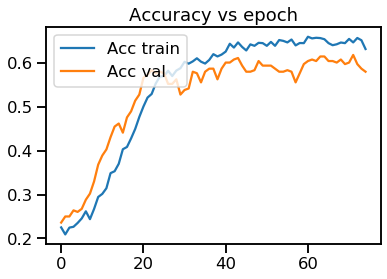

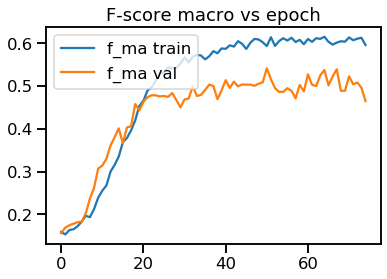

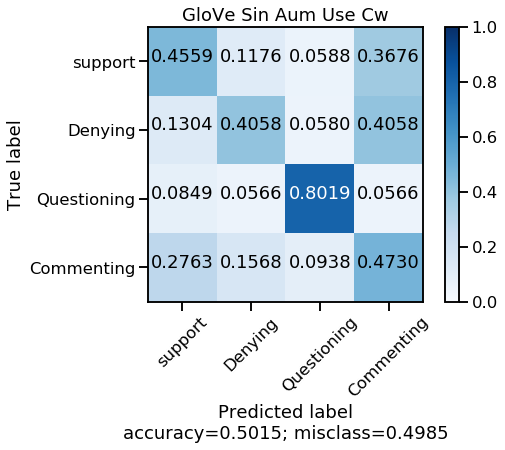

Test_ acc: 0.5014691478942214
Test_ f1 none: [0.18674699 0.24034335 0.625      0.61078838]
Test_ f1 macro: 0.41571967933350773
Encoder Layer Attention head 0
Encoder Layer Attention head 1
Entrenando Run # 3
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	None: tensor([0.1352, 0.0247, 0.0370, 0.2153], dtype=torch.float64) 	F-ma: tensor(0.1031, dtype=torch.float64)
Epoch 10 	None: tensor([0.3264, 0.0494, 0.6002, 0.1416], dtype=torch.float64) 	F-ma: tensor(0.2794, dtype=torch.float64)
Epoch 20 	None: tensor([0.4760, 0.2593, 0.6751, 0.3150], dtype=torch.float64) 	F-ma: tensor(0.4313, dtype=torch.float64)
Epoch 30 	None: tensor([0.5659, 0.2407, 0.7040, 0.6638], dtype=torch.float64) 	F-ma: tensor(0.5436, dtype=torch.float64)
Epoch 40 	None: tensor([0.5456, 0.2185, 0.7272, 0.6610], dtype=torch.float64) 	F-ma: tensor(0.5381, dtype=torch.float64)
Epoch 50 	None: tensor([0.5551, 0.2667, 0.6479, 0.6562], dtype=torch.f

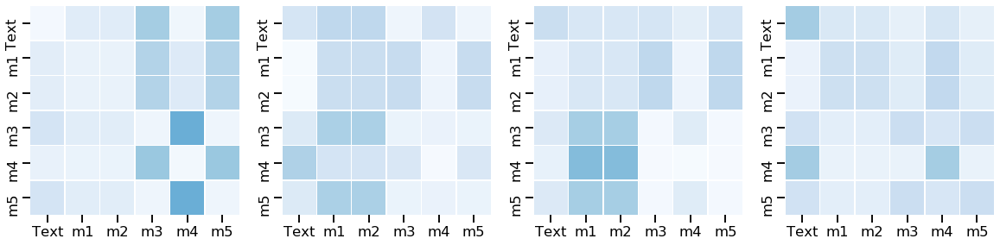

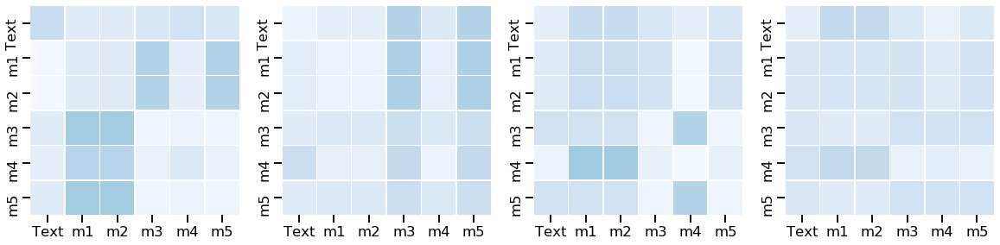

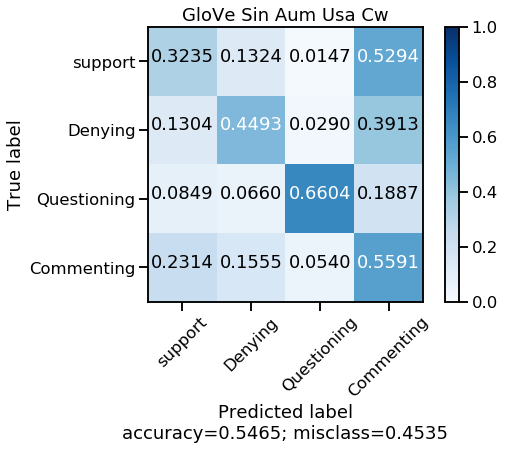

Test_ acc: 0.5465230166503428
Test_ f1 none: [0.15277778 0.26160338 0.63348416 0.6712963 ]
Test_ f1 macro: 0.42979040312435696


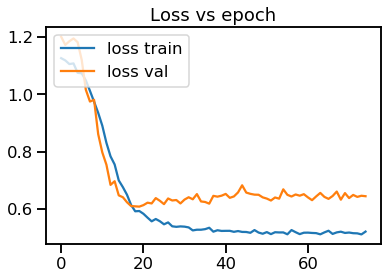

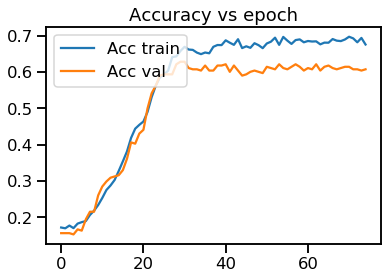

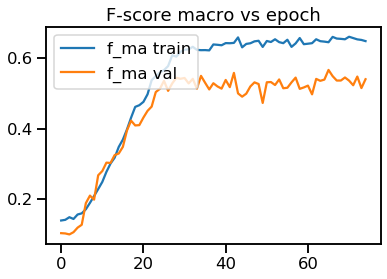

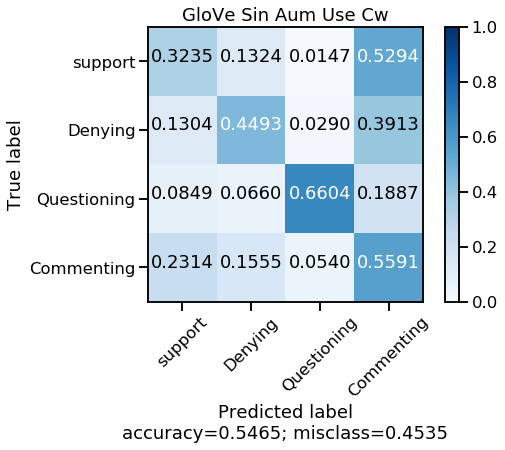

Test_ acc: 0.5465230166503428
Test_ f1 none: [0.15277778 0.26160338 0.63348416 0.6712963 ]
Test_ f1 macro: 0.42979040312435696
Encoder Layer Attention head 0
Encoder Layer Attention head 1
Entrenando Run # 4
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	None: tensor([0.0757, 0.0631, 0.2798, 0.1710], dtype=torch.float64) 	F-ma: tensor(0.1474, dtype=torch.float64)
Epoch 10 	None: tensor([0.4013, 0.1504, 0.5099, 0.3203], dtype=torch.float64) 	F-ma: tensor(0.3455, dtype=torch.float64)
Epoch 20 	None: tensor([0.5012, 0.2225, 0.6290, 0.4423], dtype=torch.float64) 	F-ma: tensor(0.4487, dtype=torch.float64)
Epoch 30 	None: tensor([0.5073, 0.1878, 0.6873, 0.5201], dtype=torch.float64) 	F-ma: tensor(0.4756, dtype=torch.float64)
Epoch 40 	None: tensor([0.5313, 0.2278, 0.6823, 0.5848], dtype=torch.float64) 	F-ma: tensor(0.5065, dtype=torch.float64)
Epoch 50 	None: tensor([0.5295, 0.2728, 0.6715, 0.5706], dtype=torch.f

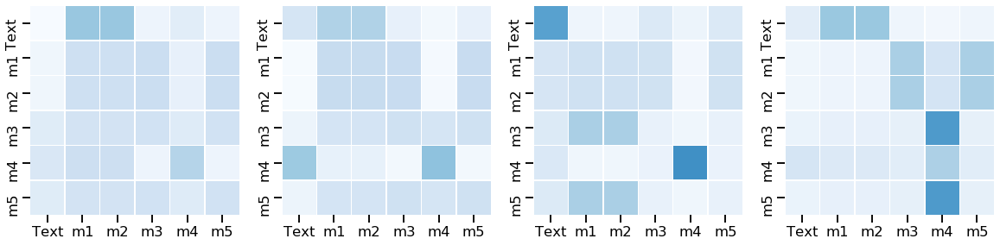

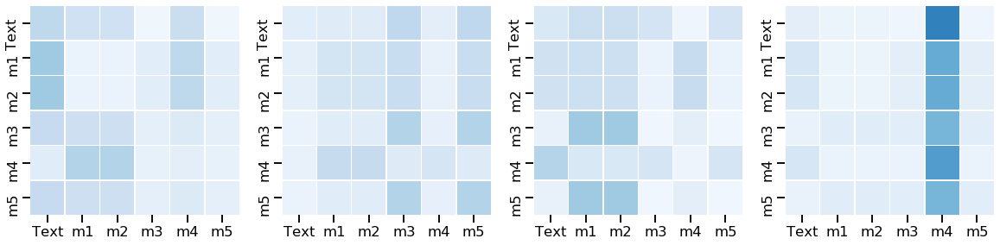

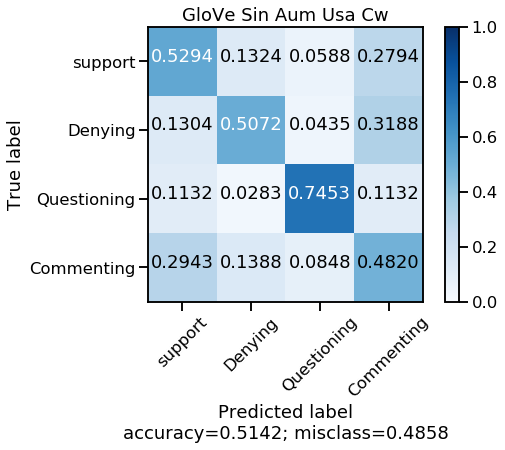

Test_ acc: 0.5142017629774731
Test_ f1 none: [0.20338983 0.3125     0.6124031  0.62189055]
Test_ f1 macro: 0.4375458696368375


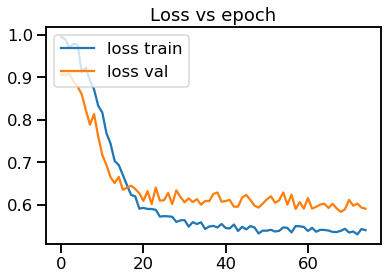

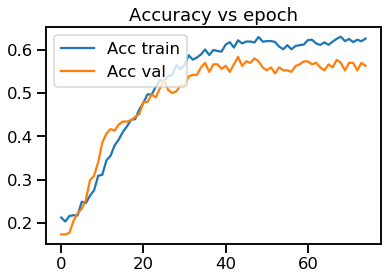

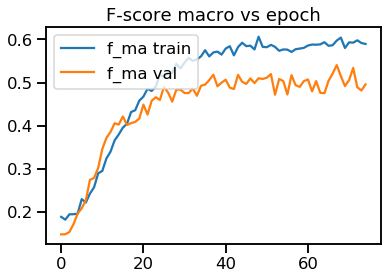

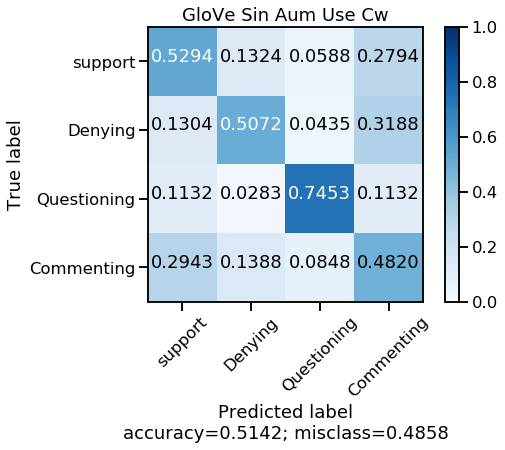

Test_ acc: 0.5142017629774731
Test_ f1 none: [0.20338983 0.3125     0.6124031  0.62189055]
Test_ f1 macro: 0.4375458696368375
Encoder Layer Attention head 0
Encoder Layer Attention head 1
Entrenando Run # 5
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	None: tensor([0.1617, 0.0673, 0.0432, 0.0800], dtype=torch.float64) 	F-ma: tensor(0.0880, dtype=torch.float64)
Epoch 10 	None: tensor([0.2658, 0.1201, 0.2684, 0.1401], dtype=torch.float64) 	F-ma: tensor(0.1986, dtype=torch.float64)
Epoch 20 	None: tensor([0.5279, 0.1752, 0.6295, 0.5098], dtype=torch.float64) 	F-ma: tensor(0.4606, dtype=torch.float64)
Epoch 30 	None: tensor([0.5570, 0.2305, 0.5529, 0.6461], dtype=torch.float64) 	F-ma: tensor(0.4966, dtype=torch.float64)
Epoch 40 	None: tensor([0.5793, 0.2018, 0.5713, 0.6336], dtype=torch.float64) 	F-ma: tensor(0.4965, dtype=torch.float64)
Epoch 50 	None: tensor([0.5644, 0.2185, 0.5328, 0.6844], dtype=torch.fl

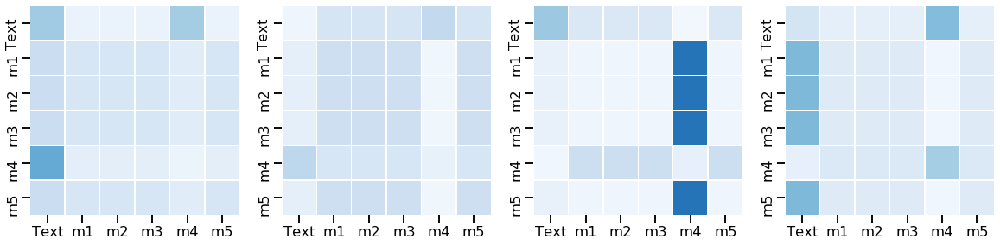

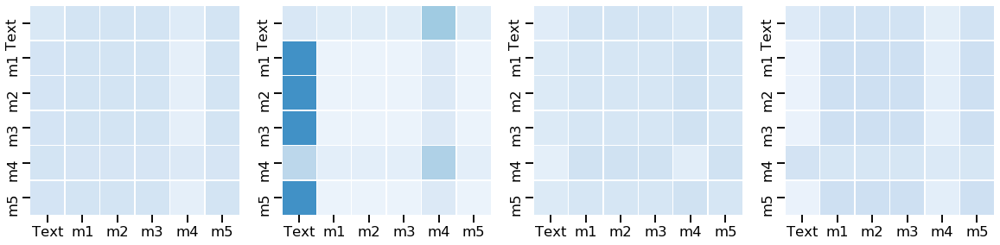

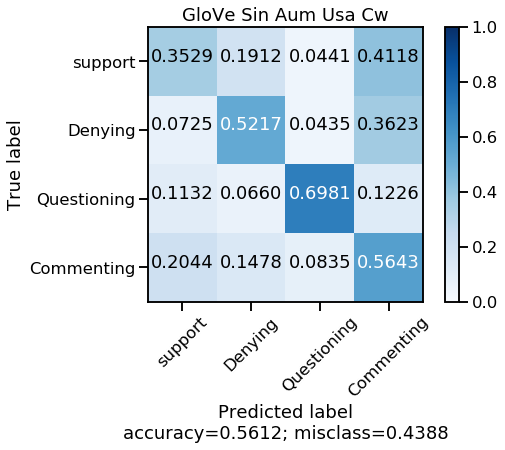

Test_ acc: 0.5612144955925563
Test_ f1 none: [0.17910448 0.3        0.58964143 0.68433359]
Test_ f1 macro: 0.43826987625399105


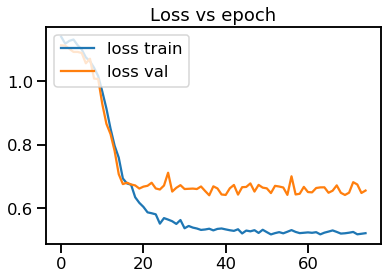

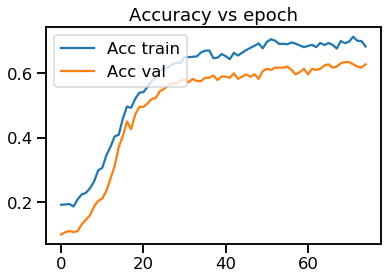

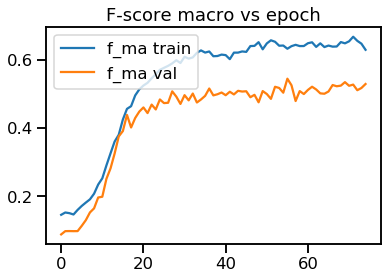

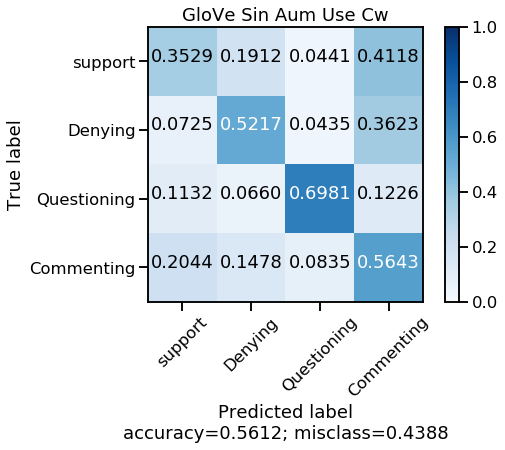

Test_ acc: 0.5612144955925563
Test_ f1 none: [0.17910448 0.3        0.58964143 0.68433359]
Test_ f1 macro: 0.43826987625399105
Encoder Layer Attention head 0
Encoder Layer Attention head 1
Acc: 0.5384916748285994
F-score: 0.4307262004096174
(0.0_Use CW) S-D-Q-C: 0.17429705320416372 0.27412087172697824 0.6176287521391153 0.6568581245682126


Confusion counts


array([[ 268.,  100.,   32.,  280.],
       [  80.,  312.,   30.,  268.],
       [ 106.,   50.,  766.,  138.],
       [1912., 1122.,  594., 4152.]])

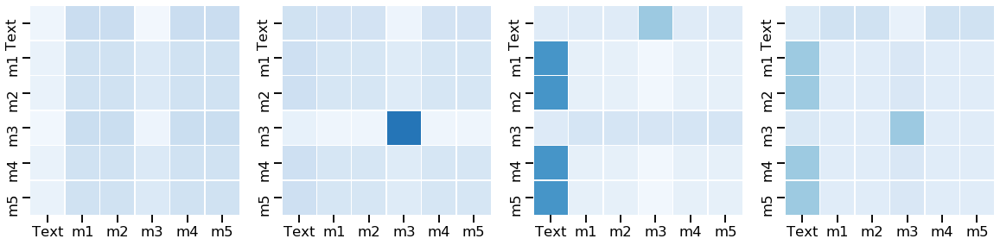

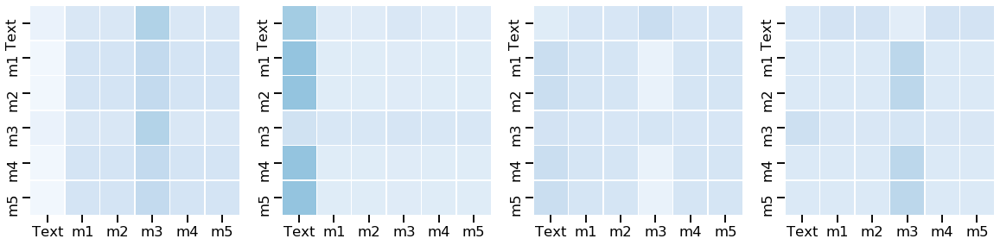

In [17]:
bs=32
print ("\n\nENTRENANDO CON MINI BATCH ", bs, "\n\n")
global_accs=[]
global_fnones=[]
global_fmacros=[]
global_cms=[]
global_attn=[]
dict_attn_enc={'00':[], '01':[], '02':[], '03':[], '10':[], '11':[], '12':[], '13':[]}

prob=0.0

for trans in range(1,6): 
    print ("Entrenando Run #", trans)
    cnn1 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'_cw/cnn1_'+str(trans)+'-exec.h5')
    cnn2 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'_cw/cnn2_'+str(trans)+'-exec.h5')
    rnn1 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'_cw/rnn1_'+str(trans)+'-exec.h5')
    rnn2 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'_cw/rnn2_'+str(trans)+'-exec.h5')
    rnn3 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'_cw/rnn3_'+str(trans)+'-exec.h5')

    list_models=['cnn1', 'cnn2', 'rnn1', 'rnn2', 'rnn3']
    index_models=np.arange(5)
    dict_models=dict((key, value) for (key, value) in zip(index_models,list_models))
    modelos=[cnn1, cnn2, rnn1, rnn2, rnn3]
    ind=np.arange(5)
    dict_trainedModel=dict((key, value) for (key, value) in zip(ind,modelos))

    #bs=64
    b_dim=768

    predicciones_all=[]
    predicciones_all_val=[]
    predicciones_all_test=[]

    print ("agregando predicciones Train")
    for i in dict_trainedModel.keys(): 
        a_evaluar=dict_models[i]
        predicciones_all.append(dict_trainedModel[i].predict(x_train, batch_size=bs))
    print ("agregando predicciones Val")
    for i in dict_trainedModel.keys(): 
        a_evaluar=dict_models[i]
        predicciones_all_val.append(dict_trainedModel[i].predict(x_val, batch_size=bs))
    print ("agregando predicciones Test")
    for i in dict_trainedModel.keys(): 
        a_evaluar=dict_models[i]
        predicciones_all_test.append(dict_trainedModel[i].predict(x_test, batch_size=bs))

    matrix=np.asarray(predicciones_all)
    matrix_val=np.asarray(predicciones_all_val)
    matrix_test=np.asarray(predicciones_all_test)
    new_matrix=np.concatenate([matrix,matrix_val,matrix_test], axis=1)


    espacio=[np.ones(b_dim)]
    #Ks=np.load("../../BERTransformer/Orthogonals_768.npy")

    espacio=[np.ones(b_dim)]
    Ks= ortho_group.rvs(dim=b_dim)
    random=np.random.randint(Ks.shape[0], size=4)
    K_list=Ks[random]
    K_list_ext=espacio+list(K_list)
    index_embeddings=[0,1,2,3,4]
    lab_str_embeddings=['','','','','']

    for i in range(len(sentences)):
        #ide=ids_train[i]
        tw_tr=tws_train[i]
        clase=dict_cl[labels_train[i]]
        encoded_tok, sentence_valid = my_tokenizer(cleaner(tw_tr)[1])  #cleaner: raw, no cleaner:augmented version

        final=' '
        frase=[final.join(sentence_valid)]
        try: 
            vector= bc.encode(frase)[0]  
            #norm=np.linalg.norm(vector)
            final_bert= vector #/ norm
        except: 
            final_bert= np.zeros(b_dim)

        index_embeddings.append(i+5)
        lab_str_embeddings.append(clase)
        K_list_ext.append(final_bert)

    objs_val=val['Tw_id']      #df_val['Unnamed: 0'].values
    objs_test=test['Tw_id']    #np.arange(df_test.shape[0])
    lab_val=val['Label']
    lab_test=test['Label']
    tw_val=val['Tweet']
    tw_test=test['Tweet']
    llaves=np.concatenate([objs_val,objs_test])
    clases=np.concatenate([lab_val,lab_test])
    sent_all=np.concatenate([tw_val,tw_test])

    for num in range(len(llaves)):
        i=llaves[num]
        clase=clases[num]
        tw_tr=sent_all[num]
        #vector=np.load("../BaS_Original/Original/"+str(i)+".npy")
        encoded_tok, tokens_valid =my_tokenizer(cleaner(tw_tr)[1])

        final=' '
        frase=[final.join(tokens_valid)]
        try: 
            vector= bc.encode(frase)[0]    
            #norm=np.linalg.norm(vector)
            final_bert= vector #/ norm
        except: 
            final_bert= np.zeros(b_dim)

        index_embeddings.append(num+5+train.shape[0])
        lab_str_embeddings.append(clase)
        K_list_ext.append(final_bert)

    K_list_new= np.asarray(K_list_ext, dtype='float32')

    ###################################### TRANSFORMER ###############################
    hist_train_loss=[]
    hist_train_acc=[]
    hist_train_fma=[]
    hist_val_loss=[]
    hist_val_acc=[]
    hist_val_fma=[]
    V = 4
    pesos = torch.from_numpy(class_weights).float()
    criterion = FocalLoss(weights=pesos)
    model = make_model_concat(4, N=2,d_model=b_dim, d_ff=128, h=4, dropout=0.35)
    model_opt = NoamOpt(model.src_embed[0].d_model, 1, 6000, torch.optim.Adam(model.parameters(), lr=0, betas=(0.9, 0.98), eps=1e-5))

    for epoch in range(75):
        model.train()
        DATA=data_gen(bs, 'Train', 5, new_matrix)
        loss_train, acc_train,fma_train, f_none, cm_train=run_epoch(DATA, model, SimpleLossComputeFL(criterion, model_opt), 'Train')
        hist_train_loss.append(loss_train)
        hist_train_acc.append(acc_train)
        hist_train_fma.append(fma_train)

        model.eval()
        loss_val, acc_val,fma_val, f_val_none, cm_val=run_epoch(data_gen(bs, 'Val', 5, new_matrix), model, SimpleLossComputeFL(criterion, None),'Val')
        if epoch%10==0:
            print ("Epoch",epoch, "\tNone:",f_val_none, "\tF-ma:",fma_val)
        hist_val_loss.append(loss_val)
        hist_val_acc.append(acc_val)
        hist_val_fma.append(fma_val)

    model.eval()
    print ("Testing run #",trans)
    predicciones = run_epoch(data_gen(bs, 'Test', 5, new_matrix), model, SimpleLossComputeFL(criterion, None),'Test')
    predicciones=np.concatenate(predicciones, axis=-1)

    glo_acc=accuracy_score(etiq_t, predicciones[:-3])
    glo_fno=f1_score(etiq_t,predicciones[:-3], average=None)
    glo_fma=f1_score(etiq_t,predicciones[:-3], average='macro')

    glo_cm=confusion_matrix(etiq_t, predicciones[:-3])

    plot_confusion_matrix(glo_cm,["support","Denying","Questioning","Commenting"],"GloVe Sin Aum Usa Cw")
    global_accs.append(glo_acc)
    global_fnones.append(glo_fno)
    global_fmacros.append(glo_fma)
    global_cms.append(glo_cm)
    print("Test_ acc:",glo_acc) 
    print("Test_ f1 none:",glo_fno) 
    print("Test_ f1 macro:",glo_fma) 

    plt.plot(hist_train_loss, label='loss train')
    plt.plot(hist_val_loss,label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch")
    plt.show()

    plt.plot(hist_train_acc, label='Acc train')
    plt.plot(hist_val_acc, label='Acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch")
    plt.show()

    plt.plot(hist_train_fma, label='f_ma train')
    plt.plot(hist_val_fma, label='f_ma val')
    plt.legend(loc='upper left')
    plt.title("F-score macro vs epoch")
    plt.show()
    #"""

    label=[['Text', 'm1', 'm2','m3','m4','m5']]
    for layer in range(2):
        fig, axs = plt.subplots(1,4, figsize=(20, 10))
        print ("Encoder Layer Attention head", layer)
        for head in range(4):
            matriz_attn=model.encoder.layers[layer].self_attn.attn[0,head].data
            dict_attn_enc[str(layer)+str(head)].append(matriz_attn)
            sns.heatmap(matriz_attn, xticklabels=label[0], yticklabels=label[0],
                        vmin=0.0, vmax=1.0, linewidths=.5, cmap="Blues", cbar=False, square=True, ax=axs[head]) #, annot=False,cbar_kws={"orientation": "horizontal","pad": 0.25})
        #plt.show()

#CIARP
print ("Acc:",np.mean(np.asarray(global_accs)))
print ("F-score:", np.mean(np.asarray(global_fmacros)))
sup=np.mean(np.asarray(global_fnones)[:,0])
den=np.mean(np.asarray(global_fnones)[:,1])
que=np.mean(np.asarray(global_fnones)[:,2])
com=np.mean(np.asarray(global_fnones)[:,3])

print ("(0.0_Use CW) S-D-Q-C:", sup,den,que,com)

print ("\n\nConfusion counts")
m_temp=np.zeros((4,4))
for m in global_cms:
    m_temp+=np.asarray(m)

m_temp

In [22]:
print ("Acc:",np.mean(np.asarray(global_accs)))
print ("F-score:", np.mean(np.asarray(global_fmacros)))
sup=np.mean(np.asarray(global_fnones)[:,0])
den=np.mean(np.asarray(global_fnones)[:,1])
que=np.mean(np.asarray(global_fnones)[:,2])
com=np.mean(np.asarray(global_fnones)[:,3])

print ("(0.0_Use CW) S-D-Q-C:", sup,den,que,com)

print ("\n\nConfusion counts")
m_temp=np.zeros((4,4))
for m in global_cms:
    m_temp+=np.asarray(m)
    
m_temp

Acc: 0.574926542605289
F-score: 0.4379437499657811
(0.0_Use CW) S-D-Q-C: 0.19599449765899624 0.27295562956826724 0.5870581836199602 0.6957666890159009


Confusion counts


array([[ 138.,   37.,   22.,  143.],
       [  30.,  132.,   20.,  163.],
       [  46.,   19.,  369.,   96.],
       [ 845.,  431.,  318., 2296.]])

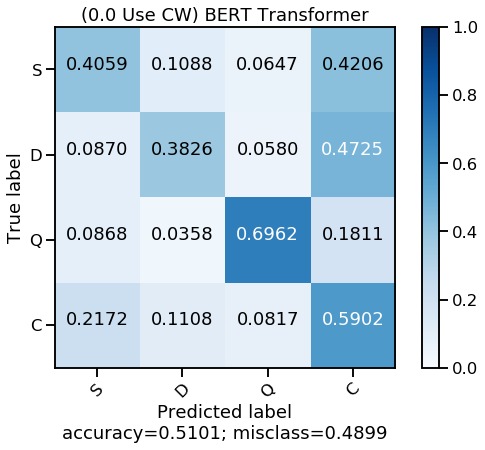

In [23]:
plot_confusion_matrix(normalize(m_temp),["S","D","Q","C"],"(0.0 Use CW) BERT Transformer", cmap='Blues')

[CW] Encoder Layer Attention head Promedio 0


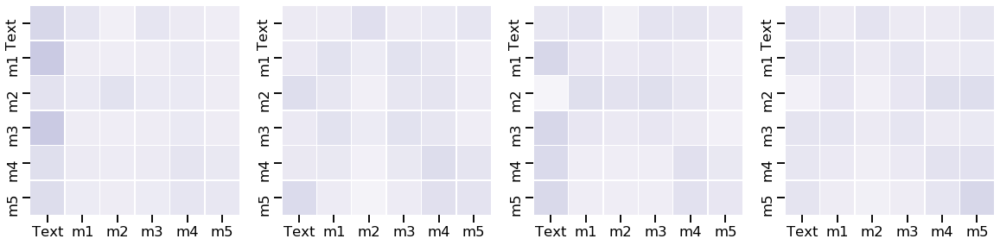

[CW] Encoder Layer Attention head Promedio 1


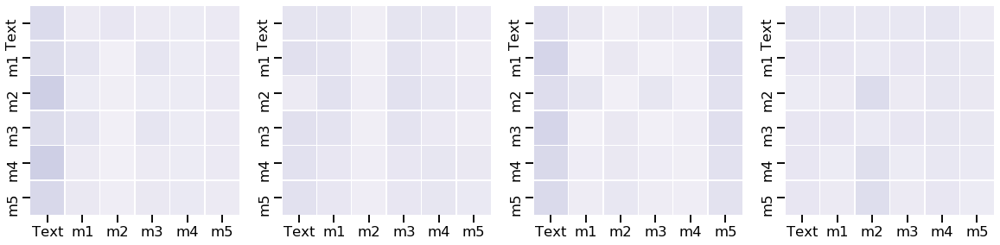

In [24]:
label=[['Text', 'm1', 'm2','m3','m4','m5']]
for layer in range(2):
    fig, axs = plt.subplots(1,4, figsize=(20, 10))
    print ("[CW] Encoder Layer Attention head Promedio", layer)
    for head in range(4):
        at=np.zeros((6,6))
        matriz_attn= dict_attn_enc[str(layer)+str(head)]  #lista de 5 corridas en cada pos
        for m in matriz_attn:
            at+=m.numpy()
        sns.heatmap(at/5., xticklabels=label[0], yticklabels=label[0],
                    vmin=0.0, vmax=1.0, linewidths=.5, cmap="Purples", cbar=False, square=True, ax=axs[head]) #, annot=False,cbar_kws={"orientation": "horizontal","pad": 0.25})
    plt.show()

In [25]:
for h in range(2):
    for hy in range(4):
        to_mean=dict_attn_enc[str(h)+str(hy)]
        at=np.zeros((6,6))
        for m in to_mean:
            at+=m.numpy()  
        global_attn.append(at/5.)
        
np.save("Attn_SinAum_BERT_UseCW.npy", global_attn)

## 0.15

In [ ]:
#DESDE ACA

Entrenando Run # 1
Pesos de clases: [1. 1. 1. 1.]





Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.2326, dtype=torch.float64) 	F-macro_val: tensor(0.1538, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.6979, dtype=torch.float64) 	F-macro_val: tensor(0.5150, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.6944, dtype=torch.float64) 	F-macro_val: tensor(0.5521, dtype=torch.float64)
Testing run # 1
SE TUVIERON QUE REPETIR 3 EJEMPLOS


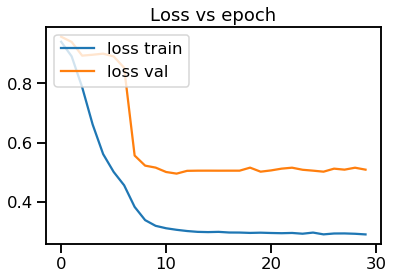

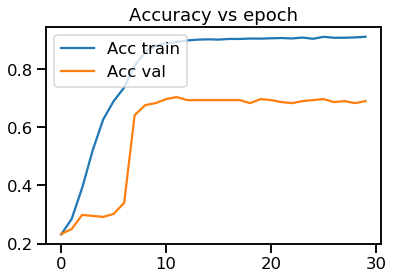

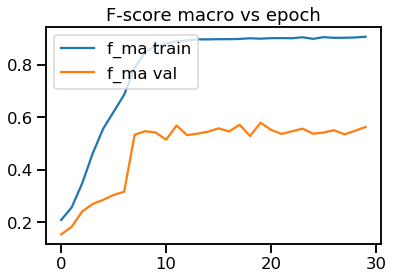

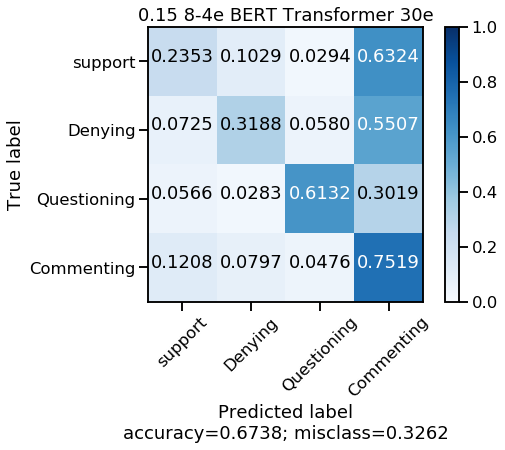

Test_ acc: 0.67384916748286
Test_ f1 none: [0.16931217 0.26993865 0.60747664 0.79268293]
Test_ f1 macro: 0.4598525954905512
Encoder Layer Attention head 0


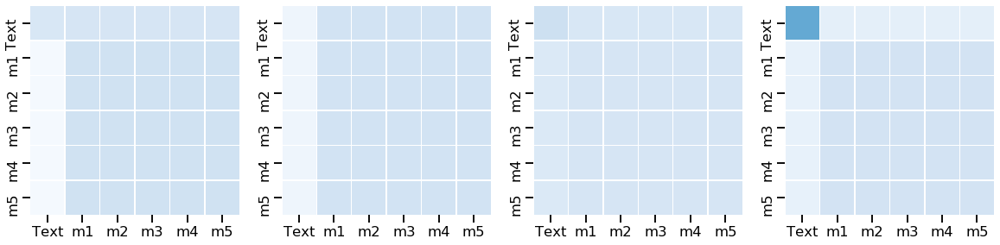

Encoder Layer Attention head 1


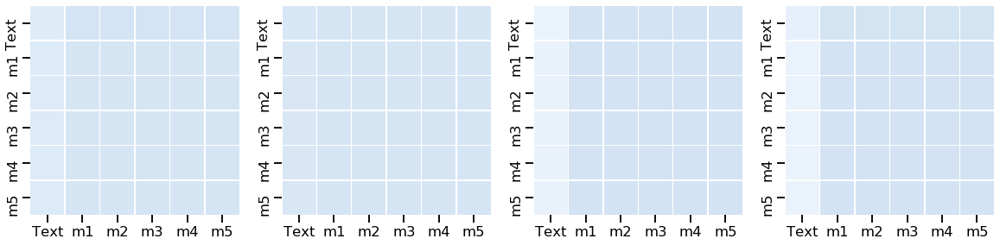

Entrenando Run # 2
Pesos de clases: [1. 1. 1. 1.]
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.1875, dtype=torch.float64) 	F-macro_val: tensor(0.1927, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.7188, dtype=torch.float64) 	F-macro_val: tensor(0.5630, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.7118, dtype=torch.float64) 	F-macro_val: tensor(0.5535, dtype=torch.float64)
Testing run # 2
SE TUVIERON QUE REPETIR 3 EJEMPLOS


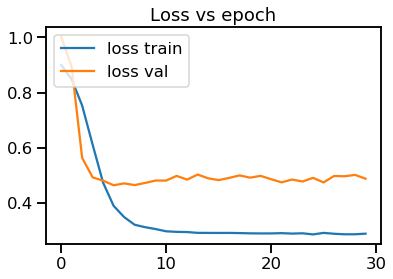

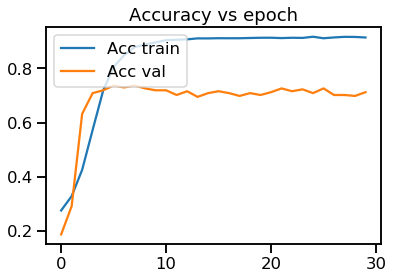

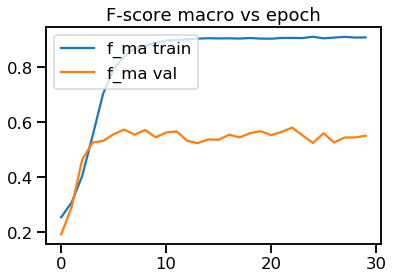

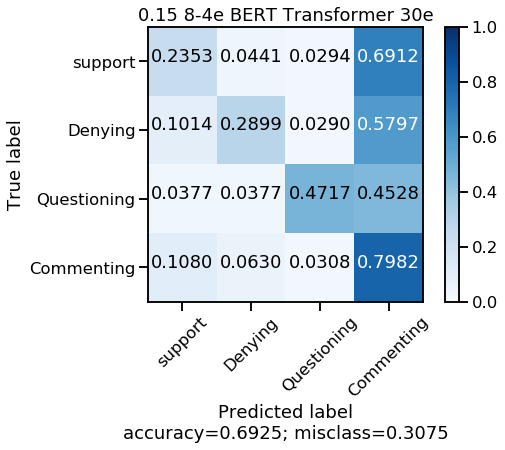

Test_ acc: 0.692458374142997
Test_ f1 none: [0.17877095 0.27586207 0.54347826 0.80964798]
Test_ f1 macro: 0.45193981467381433
Encoder Layer Attention head 0


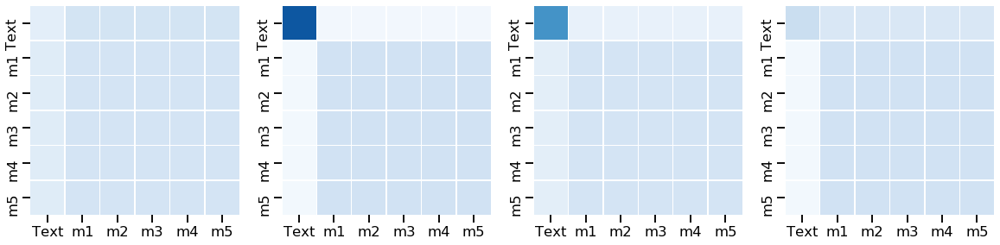

Encoder Layer Attention head 1


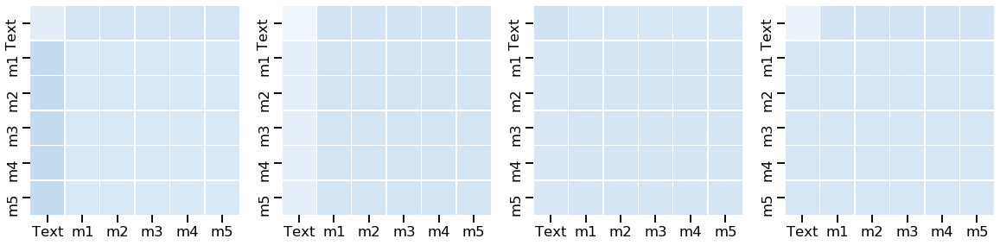

Entrenando Run # 3
Pesos de clases: [1. 1. 1. 1.]
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.4965, dtype=torch.float64) 	F-macro_val: tensor(0.3340, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.6875, dtype=torch.float64) 	F-macro_val: tensor(0.5212, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.6701, dtype=torch.float64) 	F-macro_val: tensor(0.5019, dtype=torch.float64)
Testing run # 3
SE TUVIERON QUE REPETIR 3 EJEMPLOS


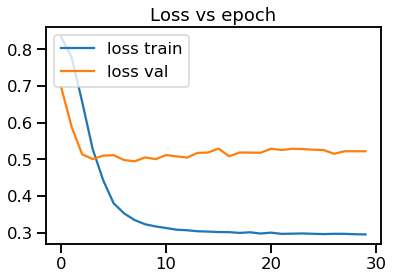

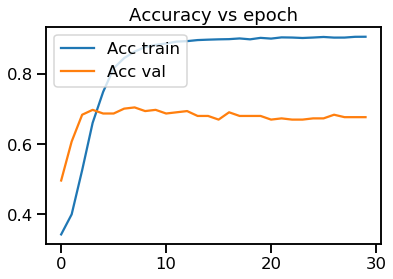

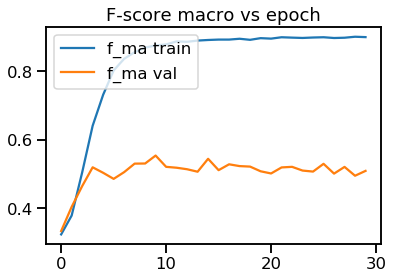

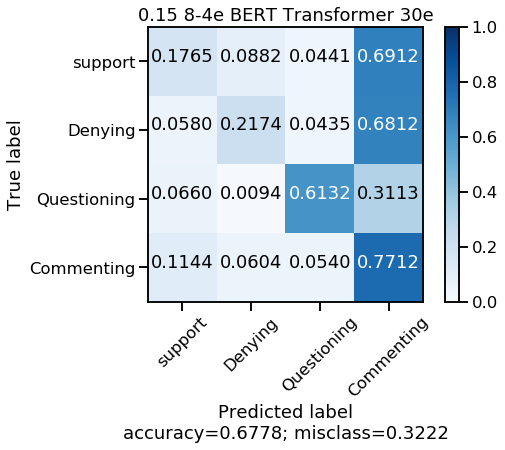

Test_ acc: 0.6777668952007836
Test_ f1 none: [0.13333333 0.2173913  0.59360731 0.79734219]
Test_ f1 macro: 0.4354185340770656
Encoder Layer Attention head 0


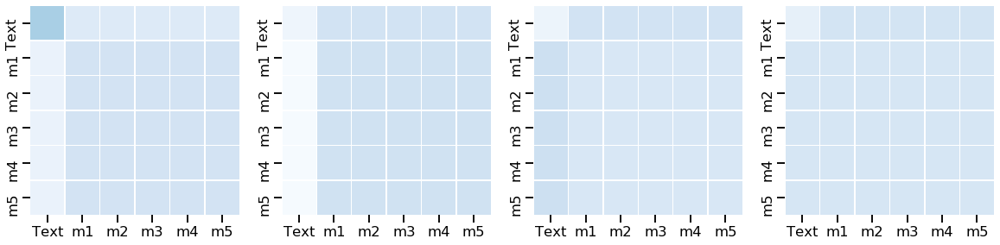

Encoder Layer Attention head 1


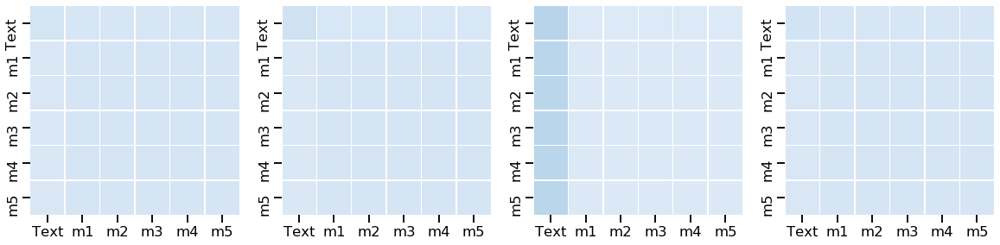

Entrenando Run # 4
Pesos de clases: [1. 1. 1. 1.]
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.1632, dtype=torch.float64) 	F-macro_val: tensor(0.1410, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.7153, dtype=torch.float64) 	F-macro_val: tensor(0.5774, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.7153, dtype=torch.float64) 	F-macro_val: tensor(0.5532, dtype=torch.float64)
Testing run # 4
SE TUVIERON QUE REPETIR 3 EJEMPLOS


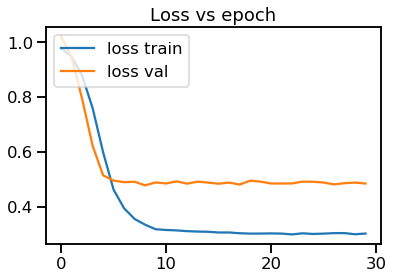

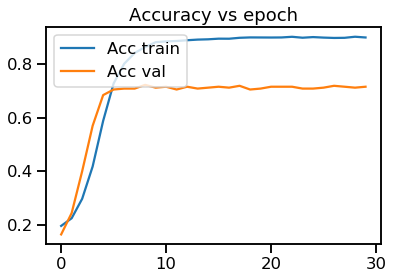

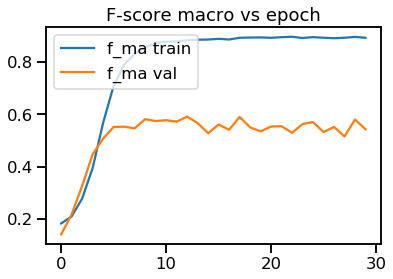

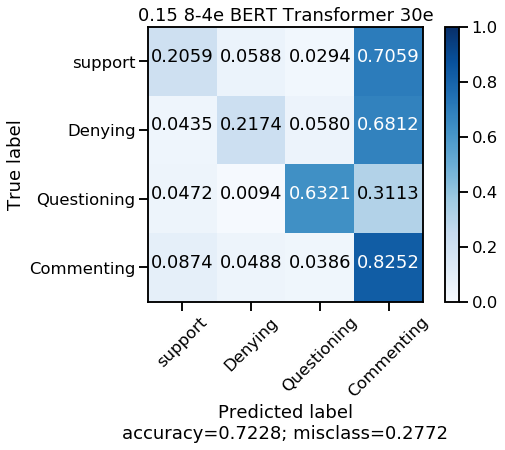

Test_ acc: 0.722820763956905
Test_ f1 none: [0.17721519 0.23622047 0.64114833 0.82945736]
Test_ f1 macro: 0.4710103380035749
Encoder Layer Attention head 0


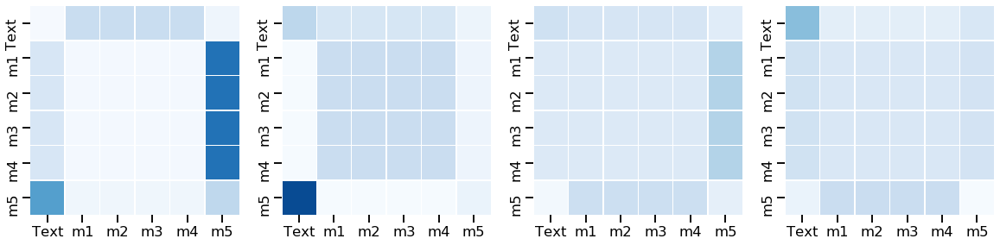

Encoder Layer Attention head 1


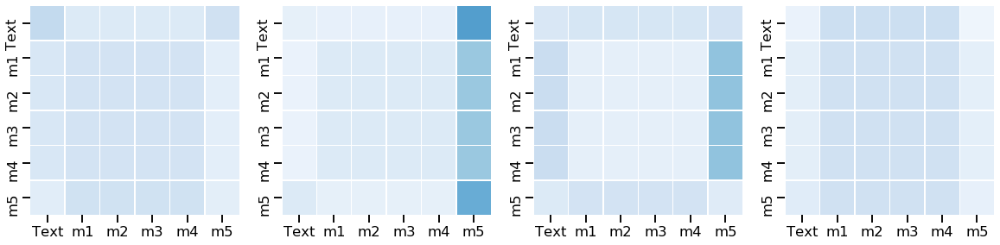

Entrenando Run # 5
Pesos de clases: [1. 1. 1. 1.]
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.1458, dtype=torch.float64) 	F-macro_val: tensor(0.1294, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.6597, dtype=torch.float64) 	F-macro_val: tensor(0.5083, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.6667, dtype=torch.float64) 	F-macro_val: tensor(0.5445, dtype=torch.float64)
Testing run # 5
SE TUVIERON QUE REPETIR 3 EJEMPLOS


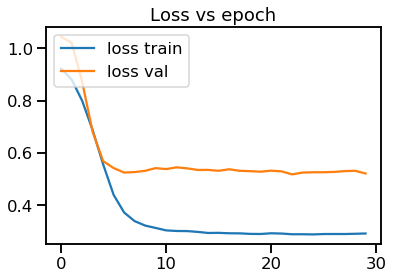

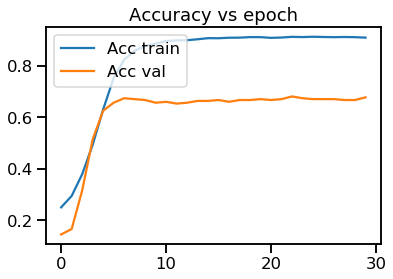

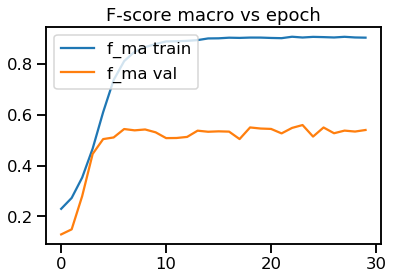

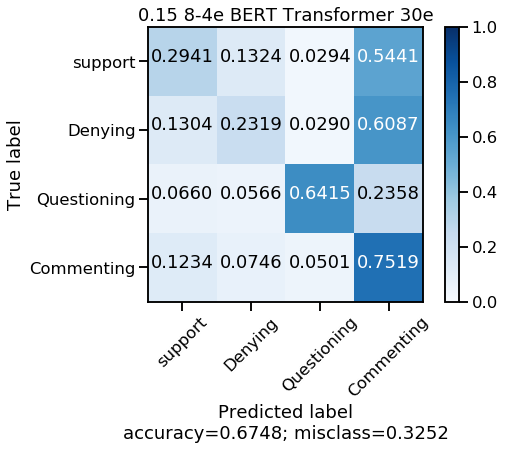

Test_ acc: 0.6748285994123409
Test_ f1 none: [0.2        0.20253165 0.62672811 0.79754601]
Test_ f1 macro: 0.4567014421096593
Encoder Layer Attention head 0


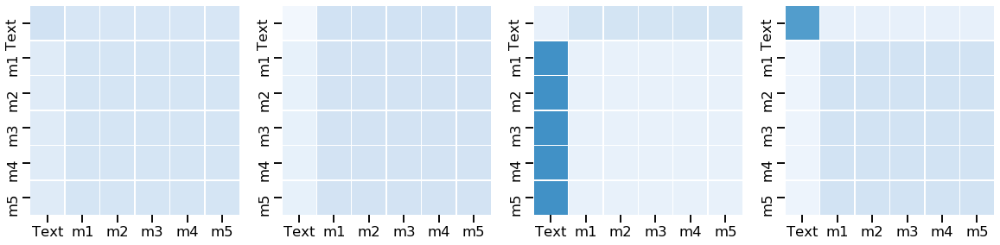

Encoder Layer Attention head 1


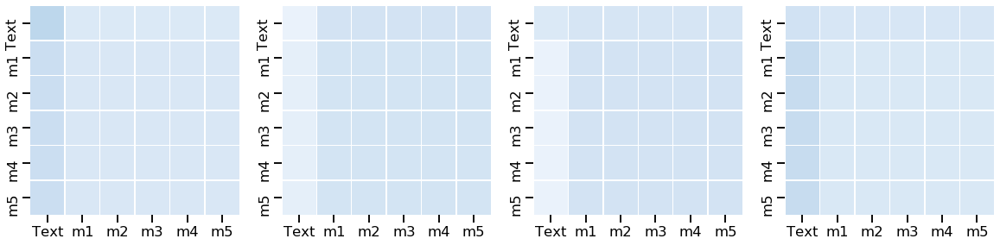

In [13]:
## menos epochs 

global_accs=[]
global_fnones=[]
global_fmacros=[]
global_cms=[]
global_attn=[]
dict_attn_enc={'00':[], '01':[], '02':[], '03':[], '10':[], '11':[], '12':[], '13':[]}
  
prob=0.15

for trans in range(1,6): 
    print ("Entrenando Run #", trans)
    macro_augmented= np.load('../new_glove_augmented/stance/Aumento_'+str(trans)+'-run_'+str(prob)+'_app1_Top1.npy', allow_pickle=True)
    
    ids_train=macro_augmented[:,0]
    tws_train=macro_augmented[:,1]
    labels_train=macro_augmented[:,2]
    class_weights= compute_class_weight('balanced', np.unique(labels_train), labels_train)
    print ("Pesos de clases:", class_weights)

    etiq=labels_train.copy()
    sentences = tws_train
    n_labels = np.array(etiq)
    y_train=to_categorical(n_labels,num_classes=4)
    
    input_ids = []
    for sent in sentences:
        encoded_tok=[]
        for wd in sent:
            try: 
                encoded_tok.append(Word2Index_valid[wd])
            except: 
                continue 
        input_ids.append(encoded_tok)
    
    input_ids = pad_sequences(input_ids, maxlen=MAX_LEN, dtype="long", 
                              value=0, truncating="post", padding="post")
    
    shape=np.asarray(input_ids).shape
    x_train=np.zeros((shape[0], shape[1], g_dim))
    j=0
    for in_id in input_ids:
        x_train[j]=M_GLOVE_space[in_id]
        j+=1
        
        
    cnn1 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'/cnn1_'+str(trans)+'-exec_app1_Top_1_8e.h5')
    cnn2 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'/cnn2_'+str(trans)+'-exec_app1_Top_1_8e.h5')
    rnn1 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'/rnn1_'+str(trans)+'-exec_app1_Top_1_4e.h5')
    rnn2 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'/rnn2_'+str(trans)+'-exec_app1_Top_1_8e.h5')
    rnn3 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'/rnn3_'+str(trans)+'-exec_app1_Top_1_4e.h5')

    list_models=['cnn1', 'cnn2', 'rnn1', 'rnn2', 'rnn3']
    index_models=np.arange(5)
    dict_models=dict((key, value) for (key, value) in zip(index_models,list_models))
    modelos=[cnn1, cnn2, rnn1, rnn2, rnn3]
    ind=np.arange(5)
    dict_trainedModel=dict((key, value) for (key, value) in zip(ind,modelos))

    bs=32
    b_dim=768
    
    predicciones_all=[]
    predicciones_all_val=[]
    predicciones_all_test=[]
    
    print ("agregando predicciones Train")
    for i in dict_trainedModel.keys(): 
        a_evaluar=dict_models[i]
        predicciones_all.append(dict_trainedModel[i].predict(x_train, batch_size=bs))
    print ("agregando predicciones Val")
    for i in dict_trainedModel.keys(): 
        a_evaluar=dict_models[i]
        predicciones_all_val.append(dict_trainedModel[i].predict(x_val, batch_size=bs))
    print ("agregando predicciones Test")
    for i in dict_trainedModel.keys(): 
        a_evaluar=dict_models[i]
        predicciones_all_test.append(dict_trainedModel[i].predict(x_test, batch_size=bs))

    matrix=np.asarray(predicciones_all)
    matrix_val=np.asarray(predicciones_all_val)
    matrix_test=np.asarray(predicciones_all_test)
    new_matrix=np.concatenate([matrix,matrix_val,matrix_test], axis=1)
    
    
    espacio=[np.ones(b_dim)]
    Ks= ortho_group.rvs(dim=b_dim)
    random=np.random.randint(Ks.shape[0], size=4)
    K_list=Ks[random]
    K_list_ext=espacio+list(K_list)
    index_embeddings=[0,1,2,3,4]
    lab_str_embeddings=['','','','','']

    for i in range(len(sentences)):
        ide=ids_train[i]
        tw_tr=tws_train[i]
        clase=dict_cl[labels_train[i]]
        
        #tws_train[i]
        final=' '
        frase=[final.join(tw_tr)]
        try: 
            vector= bc.encode(frase)[0]  
            #norm=np.linalg.norm(vector)
            final_bert= vector #/ norm
        except: 
            final_bert= np.zeros(b_dim)
        
        index_embeddings.append(i+5)
        lab_str_embeddings.append(clase)
        K_list_ext.append(final_bert)
    
    
    objs_val=val['Tw_id']      #df_val['Unnamed: 0'].values
    objs_test=test['Tw_id']    #np.arange(df_test.shape[0])
    lab_val=val['Label']
    lab_test=test['Label']
    tw_val=val['Tweet']
    tw_test=test['Tweet']
    llaves=np.concatenate([objs_val,objs_test])
    clases=np.concatenate([lab_val,lab_test])
    sent_all=np.concatenate([tw_val,tw_test])
    
       
    for num in range(len(llaves)):
        i=llaves[num]
        clase=clases[num]
        tw_tr=sent_all[num]
        #vector=np.load("../BaS_Original/Original/"+str(i)+".npy")
        encoded_tok, tokens_valid =my_tokenizer(cleaner(tw_tr)[1])
    
        final=' '
        frase=[final.join(tokens_valid)]
        try: 
            vector= bc.encode(frase)[0]    
            #norm=np.linalg.norm(vector)
            final_bert= vector #/ norm
        except: 
            final_bert= np.zeros(b_dim)

        index_embeddings.append(num+5+train.shape[0])
        lab_str_embeddings.append(clase)
        K_list_ext.append(final_bert)

    K_list_new= np.asarray(K_list_ext, dtype='float32')
    
    ###################################### TRANSFORMER ###############################
    hist_train_loss=[]
    hist_train_acc=[]
    hist_train_fma=[]
    hist_val_loss=[]
    hist_val_acc=[]
    hist_val_fma=[]
    
    V = 4
    pesos = torch.from_numpy(class_weights).float()
    criterion = FocalLoss(weights=pesos)
    model = make_model_concat(4, N=2,d_model=b_dim, d_ff=128, h=4, dropout=0.35)
    model_opt = NoamOpt(model.src_embed[0].d_model, 1, 6000, torch.optim.Adam(model.parameters(), lr=0, betas=(0.9, 0.98), eps=1e-5))

    
    for epoch in range(30):
        model.train()
        DATA=data_gen(bs, 'Train', 5, new_matrix)
        loss_train, acc_train,fma_train, f_none, cm_train=run_epoch(DATA, model, SimpleLossComputeFL(criterion, model_opt), 'Train')
        hist_train_loss.append(loss_train)
        hist_train_acc.append(acc_train)
        hist_train_fma.append(fma_train)
        
        model.eval()
        loss_val, acc_val,fma_val, f_val_none, cm_val=run_epoch(data_gen(bs, 'Val', 5, new_matrix), model, SimpleLossComputeFL(criterion, None),'Val')
        if epoch%10==0:
            print ("Epoch",epoch, "\tacc_val:",acc_val, "\tF-macro_val:",fma_val)
        hist_val_loss.append(loss_val)
        hist_val_acc.append(acc_val)
        hist_val_fma.append(fma_val)
    
    model.eval()
    print ("Testing run #",trans)
    predicciones = run_epoch(data_gen(bs, 'Test', 5, new_matrix), model, SimpleLossComputeFL(criterion, None),'Test')
    predicciones=np.concatenate(predicciones, axis=-1)
    
    glo_acc=accuracy_score(etiq_t, predicciones[:-3])
    glo_fno=f1_score(etiq_t,predicciones[:-3], average=None)
    glo_fma=f1_score(etiq_t,predicciones[:-3], average='macro')

    glo_cm=confusion_matrix(etiq_t, predicciones[:-3])
    
    
    plt.plot(hist_train_loss, label='loss train')
    plt.plot(hist_val_loss,label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch")
    plt.show()

    plt.plot(hist_train_acc, label='Acc train')
    plt.plot(hist_val_acc, label='Acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch")
    plt.show()

    plt.plot(hist_train_fma, label='f_ma train')
    plt.plot(hist_val_fma, label='f_ma val')
    plt.legend(loc='upper left')
    plt.title("F-score macro vs epoch")
    plt.show()
    #"""
    
    plot_confusion_matrix(glo_cm,["support","Denying","Questioning","Commenting"],"0.15 8-4e BERT Transformer 30e")
    global_accs.append(glo_acc)
    global_fnones.append(glo_fno)
    global_fmacros.append(glo_fma)
    global_cms.append(glo_cm)
    print("Test_ acc:",glo_acc) 
    print("Test_ f1 none:",glo_fno) 
    print("Test_ f1 macro:",glo_fma) 

    label=[['Text', 'm1', 'm2','m3','m4','m5']]
    for layer in range(2):
        fig, axs = plt.subplots(1,4, figsize=(20, 10))
        print ("Encoder Layer Attention head", layer)
        for head in range(4):
            matriz_attn=model.encoder.layers[layer].self_attn.attn[0,head].data
            dict_attn_enc[str(layer)+str(head)].append(matriz_attn)
            sns.heatmap(matriz_attn, xticklabels=label[0], yticklabels=label[0],
                        vmin=0.0, vmax=1.0, linewidths=.5, cmap="Blues", cbar=False, square=True, ax=axs[head]) #, annot=False,cbar_kws={"orientation": "horizontal","pad": 0.25})
        plt.show()

In [14]:
#no norm
print ("Acc:",np.mean(np.asarray(global_accs)))
print ("F-score:", np.mean(np.asarray(global_fmacros)))
sup=np.mean(np.asarray(global_fnones)[:,0])
den=np.mean(np.asarray(global_fnones)[:,1])
que=np.mean(np.asarray(global_fnones)[:,2])
com=np.mean(np.asarray(global_fnones)[:,3])

print ("(0.15) 30e bs32 \tS-D-Q-C:", sup,den,que,com)

print ("\n\nConfusion counts")
m_temp=np.zeros((4,4))
for m in global_cms:
    m_temp+=np.asarray(m)
m_temp

Acc: 0.6883447600391773
F-score: 0.45498454487093304
(0.15) 30e bs32 	S-D-Q-C: 0.17172632844791816 0.24038882832613137 0.6024877276555174 0.8053352950541652


Confusion counts


array([[  78.,   29.,   11.,  222.],
       [  28.,   88.,   15.,  214.],
       [  29.,   15.,  315.,  171.],
       [ 431.,  254.,  172., 3033.]])

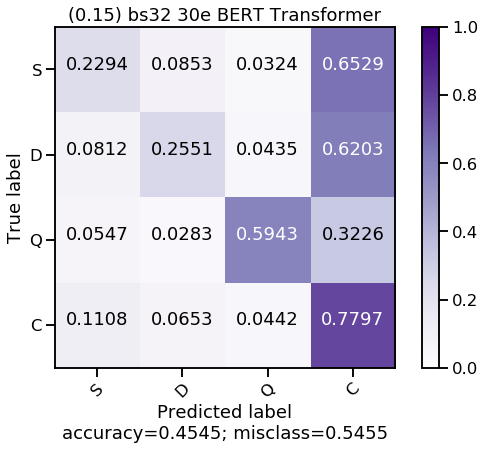

In [15]:
plot_confusion_matrix(normalize(m_temp),["S","D","Q","C"],"(0.15) bs32 30e BERT Transformer", cmap='Purples')

[0.15] bs32 30e Encoder Layer Attention head Promedio 0


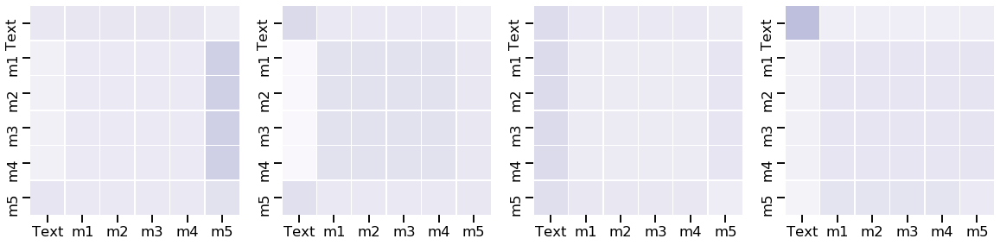

[0.15] bs32 30e Encoder Layer Attention head Promedio 1


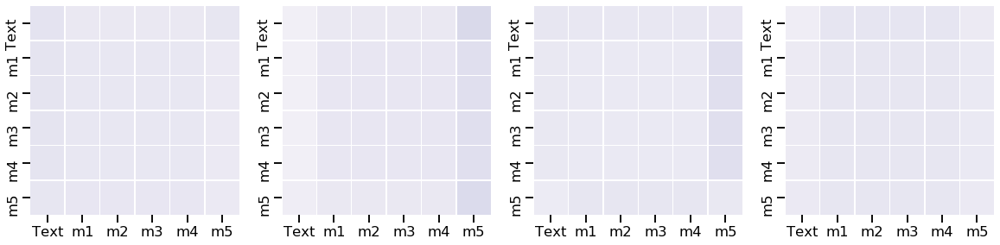

In [16]:
label=[['Text', 'm1', 'm2','m3','m4','m5']]
for layer in range(2):
    fig, axs = plt.subplots(1,4, figsize=(20, 10))
    print ("[0.15] bs32 30e Encoder Layer Attention head Promedio", layer)
    for head in range(4):
        at=np.zeros((6,6))
        matriz_attn= dict_attn_enc[str(layer)+str(head)]  #lista de 5 corridas en cada pos
        for m in matriz_attn:
            at+=m.numpy()
        sns.heatmap(at/5., xticklabels=label[0], yticklabels=label[0],
                    vmin=0.0, vmax=1.0, linewidths=.5, cmap="Purples", cbar=False, square=True, ax=axs[head]) #, annot=False,cbar_kws={"orientation": "horizontal","pad": 0.25})
    plt.show()

In [17]:
for h in range(2):
    for hy in range(4):
        to_mean=dict_attn_enc[str(h)+str(hy)]
        at=np.zeros((6,6))
        for m in to_mean:
            at+=m.numpy()
        global_attn.append(at/5.)
        
np.save("Attn_BERT_15_30e_bs32.npy", global_attn)

### 0.5

Entrenando Run # 1
Pesos de clases: [1. 1. 1. 1.]
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.2500, dtype=torch.float64) 	F-macro_val: tensor(0.2061, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.7222, dtype=torch.float64) 	F-macro_val: tensor(0.5084, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.6979, dtype=torch.float64) 	F-macro_val: tensor(0.4822, dtype=torch.float64)
Testing run # 1
SE TUVIERON QUE REPETIR 3 EJEMPLOS


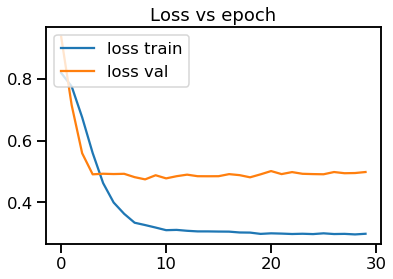

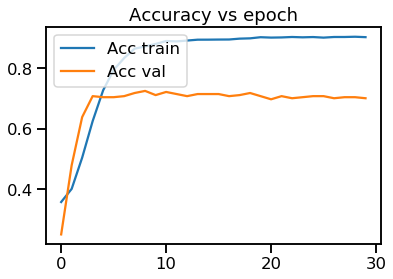

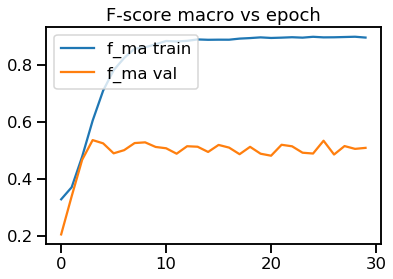

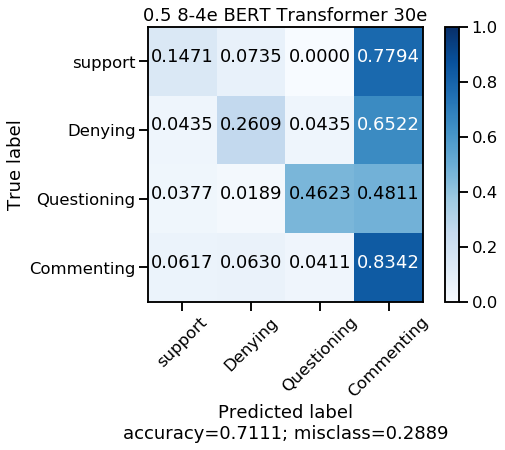

Test_ acc: 0.7110675808031341
Test_ f1 none: [0.15037594 0.25174825 0.51578947 0.82360406]
Test_ f1 macro: 0.435379431548948
Encoder Layer Attention head 0


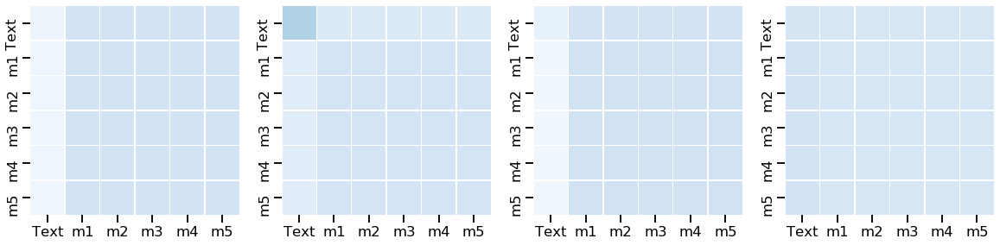

Encoder Layer Attention head 1


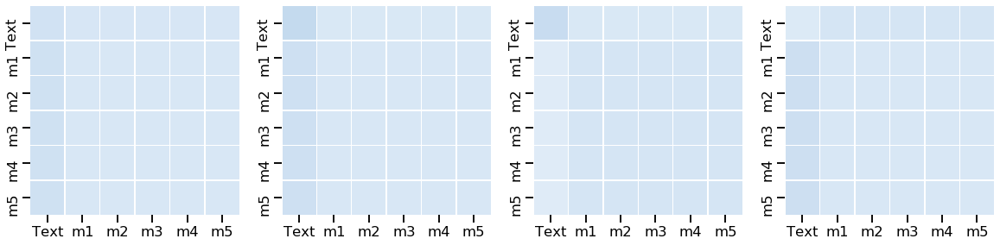

Entrenando Run # 2
Pesos de clases: [1. 1. 1. 1.]
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.5312, dtype=torch.float64) 	F-macro_val: tensor(0.2892, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.7014, dtype=torch.float64) 	F-macro_val: tensor(0.5247, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.7014, dtype=torch.float64) 	F-macro_val: tensor(0.5334, dtype=torch.float64)
Testing run # 2
SE TUVIERON QUE REPETIR 3 EJEMPLOS


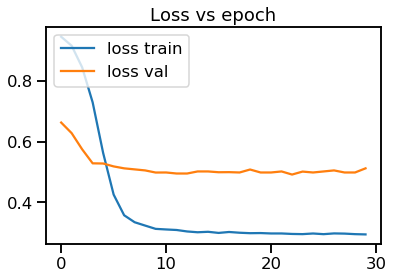

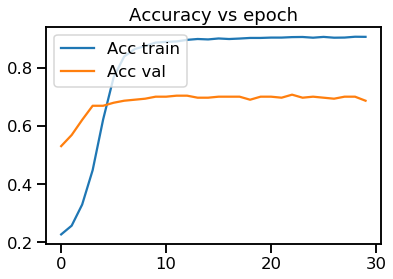

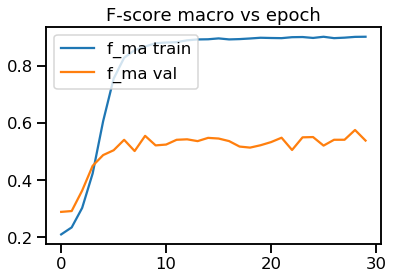

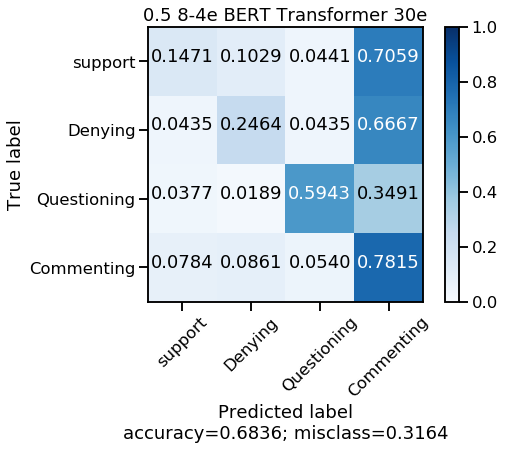

Test_ acc: 0.683643486777669
Test_ f1 none: [0.1369863  0.20987654 0.58064516 0.80158207]
Test_ f1 macro: 0.4322725189362038
Encoder Layer Attention head 0


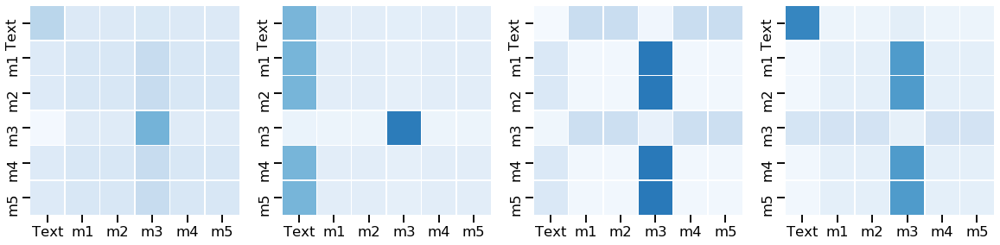

Encoder Layer Attention head 1


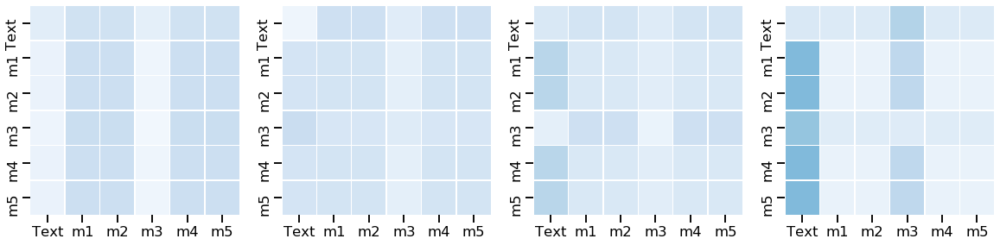

Entrenando Run # 3
Pesos de clases: [1. 1. 1. 1.]
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.5486, dtype=torch.float64) 	F-macro_val: tensor(0.2758, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.7188, dtype=torch.float64) 	F-macro_val: tensor(0.5241, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.7222, dtype=torch.float64) 	F-macro_val: tensor(0.5835, dtype=torch.float64)
Testing run # 3
SE TUVIERON QUE REPETIR 3 EJEMPLOS


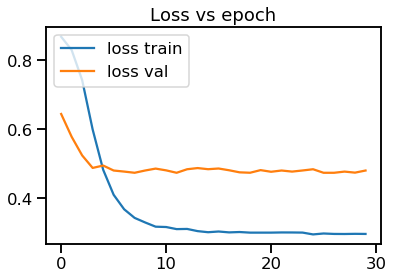

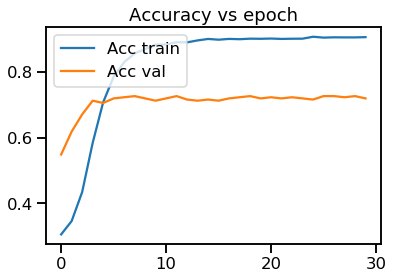

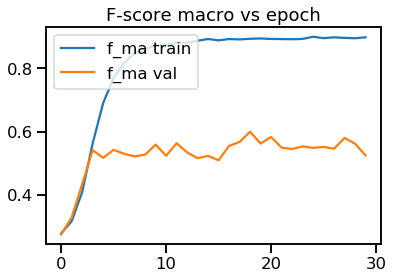

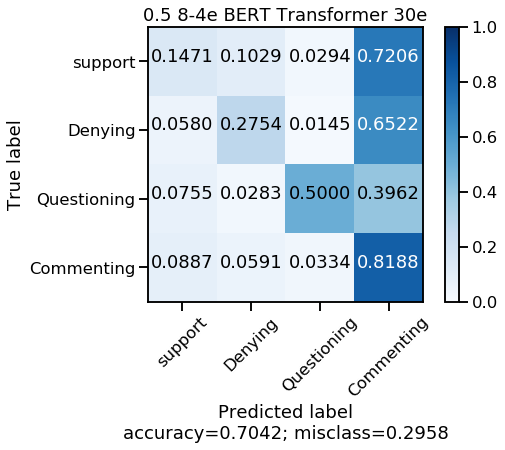

Test_ acc: 0.7042115572967679
Test_ f1 none: [0.12578616 0.26388889 0.56382979 0.82140554]
Test_ f1 macro: 0.44372759611368606
Encoder Layer Attention head 0


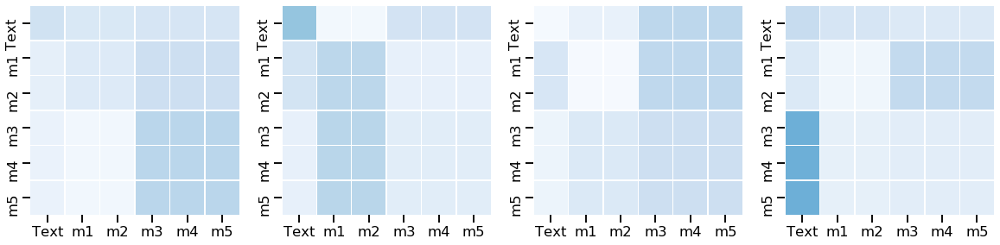

Encoder Layer Attention head 1


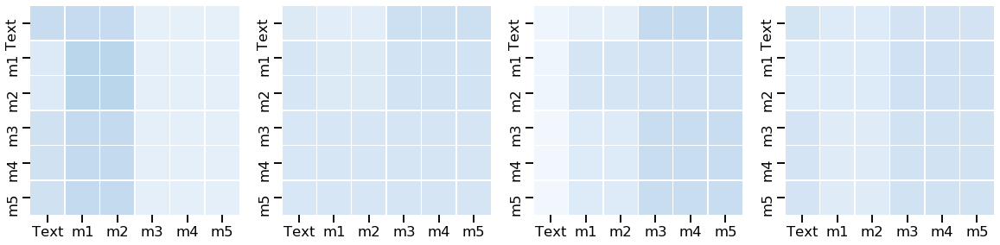

Entrenando Run # 4
Pesos de clases: [1. 1. 1. 1.]
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.4757, dtype=torch.float64) 	F-macro_val: tensor(0.2659, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.7257, dtype=torch.float64) 	F-macro_val: tensor(0.5352, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.7257, dtype=torch.float64) 	F-macro_val: tensor(0.5252, dtype=torch.float64)
Testing run # 4
SE TUVIERON QUE REPETIR 3 EJEMPLOS


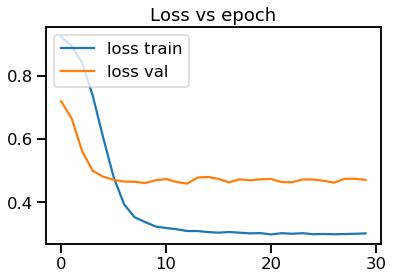

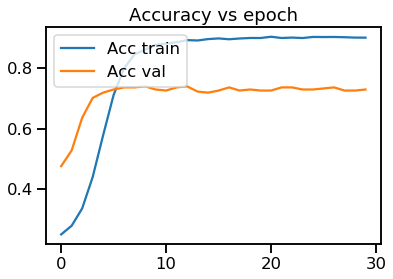

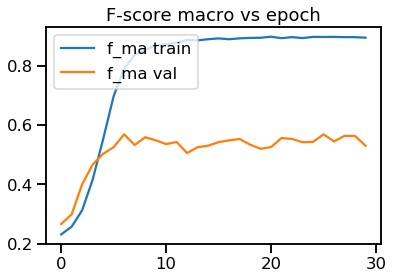

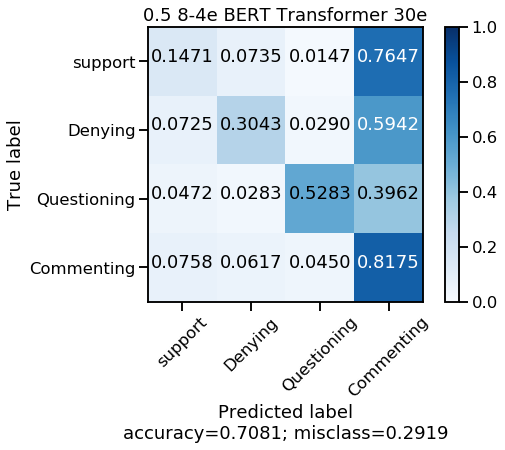

Test_ acc: 0.7081292850146915
Test_ f1 none: [0.13605442 0.28767123 0.56       0.82117495]
Test_ f1 macro: 0.45122515155677134
Encoder Layer Attention head 0


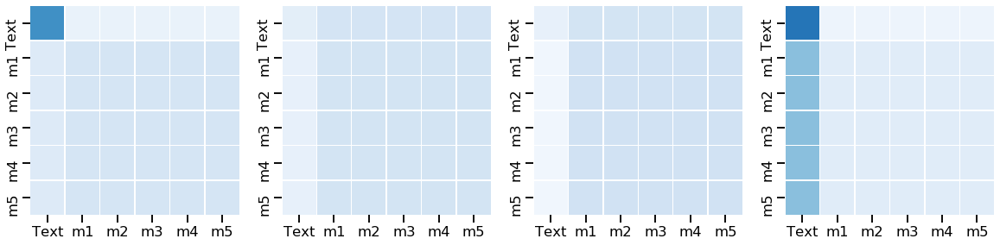

Encoder Layer Attention head 1


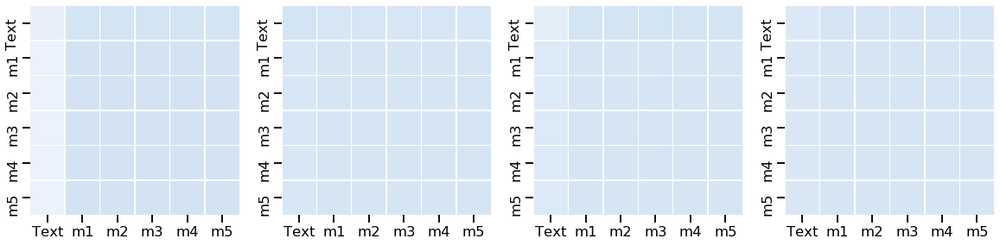

Entrenando Run # 5
Pesos de clases: [1. 1. 1. 1.]
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.6111, dtype=torch.float64) 	F-macro_val: tensor(0.2555, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.7292, dtype=torch.float64) 	F-macro_val: tensor(0.5278, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.7257, dtype=torch.float64) 	F-macro_val: tensor(0.5240, dtype=torch.float64)
Testing run # 5
SE TUVIERON QUE REPETIR 3 EJEMPLOS


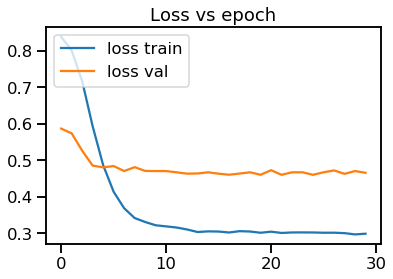

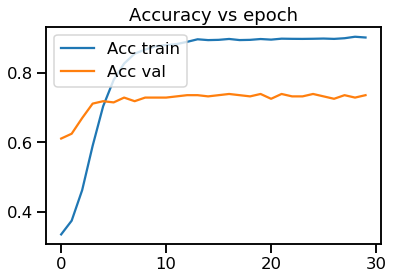

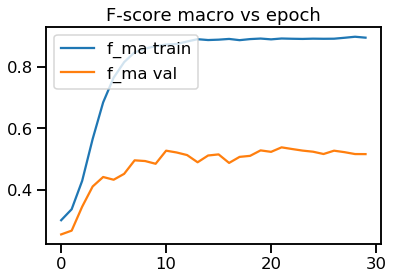

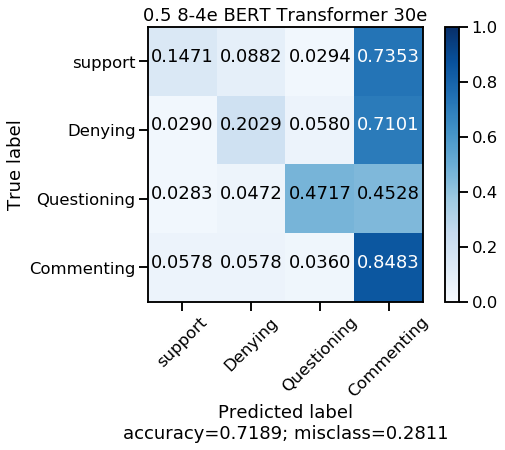

Test_ acc: 0.7189030362389814
Test_ f1 none: [0.15625    0.20143885 0.52631579 0.83280757]
Test_ f1 macro: 0.4292030523431164
Encoder Layer Attention head 0


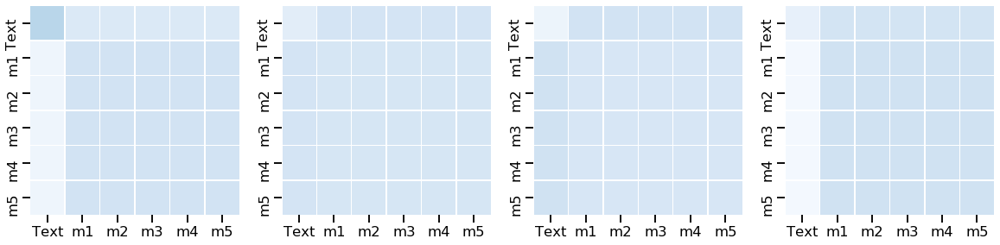

Encoder Layer Attention head 1


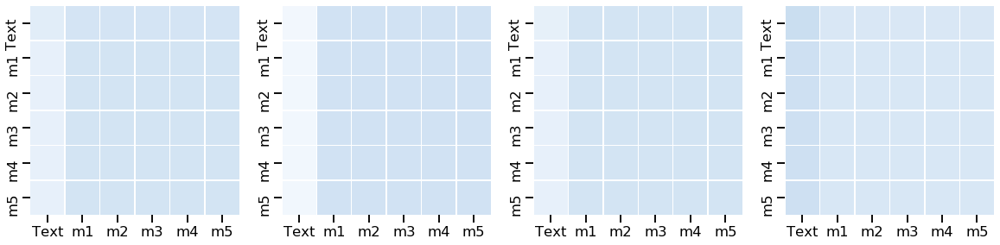

In [19]:
## menos epochs 

global_accs=[]
global_fnones=[]
global_fmacros=[]
global_cms=[]
global_attn=[]
dict_attn_enc={'00':[], '01':[], '02':[], '03':[], '10':[], '11':[], '12':[], '13':[]}
  
prob=0.5

for trans in range(1,6): 
    print ("Entrenando Run #", trans)
    macro_augmented= np.load('../new_glove_augmented/stance/Aumento_'+str(trans)+'-run_'+str(prob)+'_app1_Top1.npy', allow_pickle=True)
    
    ids_train=macro_augmented[:,0]
    tws_train=macro_augmented[:,1]
    labels_train=macro_augmented[:,2]
    class_weights= compute_class_weight('balanced', np.unique(labels_train), labels_train)
    print ("Pesos de clases:", class_weights)

    etiq=labels_train.copy()
    sentences = tws_train
    n_labels = np.array(etiq)
    y_train=to_categorical(n_labels,num_classes=4)
    
    input_ids = []
    for sent in sentences:
        encoded_tok=[]
        for wd in sent:
            try: 
                encoded_tok.append(Word2Index_valid[wd])
            except: 
                continue 
        input_ids.append(encoded_tok)
    
    input_ids = pad_sequences(input_ids, maxlen=MAX_LEN, dtype="long", 
                              value=0, truncating="post", padding="post")
    
    shape=np.asarray(input_ids).shape
    x_train=np.zeros((shape[0], shape[1], g_dim))
    j=0
    for in_id in input_ids:
        x_train[j]=M_GLOVE_space[in_id]
        j+=1
        
        
    cnn1 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'/cnn1_'+str(trans)+'-exec_app1_Top_1_8e.h5')
    cnn2 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'/cnn2_'+str(trans)+'-exec_app1_Top_1_8e.h5')
    rnn1 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'/rnn1_'+str(trans)+'-exec_app1_Top_1_4e.h5')
    rnn2 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'/rnn2_'+str(trans)+'-exec_app1_Top_1_8e.h5')
    rnn3 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'/rnn3_'+str(trans)+'-exec_app1_Top_1_4e.h5')

    list_models=['cnn1', 'cnn2', 'rnn1', 'rnn2', 'rnn3']
    index_models=np.arange(5)
    dict_models=dict((key, value) for (key, value) in zip(index_models,list_models))
    modelos=[cnn1, cnn2, rnn1, rnn2, rnn3]
    ind=np.arange(5)
    dict_trainedModel=dict((key, value) for (key, value) in zip(ind,modelos))

    bs=32
    b_dim=768
    
    predicciones_all=[]
    predicciones_all_val=[]
    predicciones_all_test=[]
    
    print ("agregando predicciones Train")
    for i in dict_trainedModel.keys(): 
        a_evaluar=dict_models[i]
        predicciones_all.append(dict_trainedModel[i].predict(x_train, batch_size=bs))
    print ("agregando predicciones Val")
    for i in dict_trainedModel.keys(): 
        a_evaluar=dict_models[i]
        predicciones_all_val.append(dict_trainedModel[i].predict(x_val, batch_size=bs))
    print ("agregando predicciones Test")
    for i in dict_trainedModel.keys(): 
        a_evaluar=dict_models[i]
        predicciones_all_test.append(dict_trainedModel[i].predict(x_test, batch_size=bs))

    matrix=np.asarray(predicciones_all)
    matrix_val=np.asarray(predicciones_all_val)
    matrix_test=np.asarray(predicciones_all_test)
    new_matrix=np.concatenate([matrix,matrix_val,matrix_test], axis=1)
    
    
    espacio=[np.ones(b_dim)]
    Ks= ortho_group.rvs(dim=b_dim)
    random=np.random.randint(Ks.shape[0], size=4)
    K_list=Ks[random]
    K_list_ext=espacio+list(K_list)
    index_embeddings=[0,1,2,3,4]
    lab_str_embeddings=['','','','','']

    for i in range(len(sentences)):
        ide=ids_train[i]
        tw_tr=tws_train[i]
        clase=dict_cl[labels_train[i]]
        
        #tws_train[i]
        final=' '
        frase=[final.join(tw_tr)]
        try: 
            vector= bc.encode(frase)[0]  
            #norm=np.linalg.norm(vector)
            final_bert= vector #/ norm
        except: 
            final_bert= np.zeros(b_dim)
        
        index_embeddings.append(i+5)
        lab_str_embeddings.append(clase)
        K_list_ext.append(final_bert)
    
    
    objs_val=val['Tw_id']      #df_val['Unnamed: 0'].values
    objs_test=test['Tw_id']    #np.arange(df_test.shape[0])
    lab_val=val['Label']
    lab_test=test['Label']
    tw_val=val['Tweet']
    tw_test=test['Tweet']
    llaves=np.concatenate([objs_val,objs_test])
    clases=np.concatenate([lab_val,lab_test])
    sent_all=np.concatenate([tw_val,tw_test])
    
       
    for num in range(len(llaves)):
        i=llaves[num]
        clase=clases[num]
        tw_tr=sent_all[num]
        #vector=np.load("../BaS_Original/Original/"+str(i)+".npy")
        encoded_tok, tokens_valid =my_tokenizer(cleaner(tw_tr)[1])
    
        final=' '
        frase=[final.join(tokens_valid)]
        try: 
            vector= bc.encode(frase)[0]    
            #norm=np.linalg.norm(vector)
            final_bert= vector #/ norm
        except: 
            final_bert= np.zeros(b_dim)

        index_embeddings.append(num+5+train.shape[0])
        lab_str_embeddings.append(clase)
        K_list_ext.append(final_bert)

    K_list_new= np.asarray(K_list_ext, dtype='float32')
    
    ###################################### TRANSFORMER ###############################
    hist_train_loss=[]
    hist_train_acc=[]
    hist_train_fma=[]
    hist_val_loss=[]
    hist_val_acc=[]
    hist_val_fma=[]
    
    V = 4
    pesos = torch.from_numpy(class_weights).float()
    criterion = FocalLoss(weights=pesos)
    model = make_model_concat(4, N=2,d_model=b_dim, d_ff=128, h=4, dropout=0.35)
    model_opt = NoamOpt(model.src_embed[0].d_model, 1, 6000, torch.optim.Adam(model.parameters(), lr=0, betas=(0.9, 0.98), eps=1e-5))

    
    for epoch in range(30):
        model.train()
        DATA=data_gen(bs, 'Train', 5, new_matrix)
        loss_train, acc_train,fma_train, f_none, cm_train=run_epoch(DATA, model, SimpleLossComputeFL(criterion, model_opt), 'Train')
        hist_train_loss.append(loss_train)
        hist_train_acc.append(acc_train)
        hist_train_fma.append(fma_train)
        
        model.eval()
        loss_val, acc_val,fma_val, f_val_none, cm_val=run_epoch(data_gen(bs, 'Val', 5, new_matrix), model, SimpleLossComputeFL(criterion, None),'Val')
        if epoch%10==0:
            print ("Epoch",epoch, "\tacc_val:",acc_val, "\tF-macro_val:",fma_val)
        hist_val_loss.append(loss_val)
        hist_val_acc.append(acc_val)
        hist_val_fma.append(fma_val)
    
    model.eval()
    print ("Testing run #",trans)
    predicciones = run_epoch(data_gen(bs, 'Test', 5, new_matrix), model, SimpleLossComputeFL(criterion, None),'Test')
    predicciones=np.concatenate(predicciones, axis=-1)
    
    glo_acc=accuracy_score(etiq_t, predicciones[:-3])
    glo_fno=f1_score(etiq_t,predicciones[:-3], average=None)
    glo_fma=f1_score(etiq_t,predicciones[:-3], average='macro')

    glo_cm=confusion_matrix(etiq_t, predicciones[:-3])
    
    
    plt.plot(hist_train_loss, label='loss train')
    plt.plot(hist_val_loss,label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch")
    plt.show()

    plt.plot(hist_train_acc, label='Acc train')
    plt.plot(hist_val_acc, label='Acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch")
    plt.show()

    plt.plot(hist_train_fma, label='f_ma train')
    plt.plot(hist_val_fma, label='f_ma val')
    plt.legend(loc='upper left')
    plt.title("F-score macro vs epoch")
    plt.show()
    #"""
    
    plot_confusion_matrix(glo_cm,["support","Denying","Questioning","Commenting"],"0.5 8-4e BERT Transformer 30e")
    global_accs.append(glo_acc)
    global_fnones.append(glo_fno)
    global_fmacros.append(glo_fma)
    global_cms.append(glo_cm)
    print("Test_ acc:",glo_acc) 
    print("Test_ f1 none:",glo_fno) 
    print("Test_ f1 macro:",glo_fma) 

    label=[['Text', 'm1', 'm2','m3','m4','m5']]
    for layer in range(2):
        fig, axs = plt.subplots(1,4, figsize=(20, 10))
        print ("Encoder Layer Attention head", layer)
        for head in range(4):
            matriz_attn=model.encoder.layers[layer].self_attn.attn[0,head].data
            dict_attn_enc[str(layer)+str(head)].append(matriz_attn)
            sns.heatmap(matriz_attn, xticklabels=label[0], yticklabels=label[0],
                        vmin=0.0, vmax=1.0, linewidths=.5, cmap="Blues", cbar=False, square=True, ax=axs[head]) #, annot=False,cbar_kws={"orientation": "horizontal","pad": 0.25})
        plt.show()

In [20]:
#no norm
print ("Acc:",np.mean(np.asarray(global_accs)))
print ("F-score:", np.mean(np.asarray(global_fmacros)))
sup=np.mean(np.asarray(global_fnones)[:,0])
den=np.mean(np.asarray(global_fnones)[:,1])
que=np.mean(np.asarray(global_fnones)[:,2])
com=np.mean(np.asarray(global_fnones)[:,3])

print ("(0.5) 30e bs32 \tS-D-Q-C:", sup,den,que,com)

print ("\n\nConfusion counts")
m_temp=np.zeros((4,4))
for m in global_cms:
    m_temp+=np.asarray(m)
m_temp

Acc: 0.7051909892262488
F-score: 0.43836155009974515
(0.5) 30e bs32 	S-D-Q-C: 0.14109056530204142 0.24292475312891856 0.549316042336452 0.8201148396315684


Confusion counts


array([[  50.,   30.,    8.,  252.],
       [  17.,   89.,   13.,  226.],
       [  24.,   15.,  271.,  220.],
       [ 282.,  255.,  163., 3190.]])

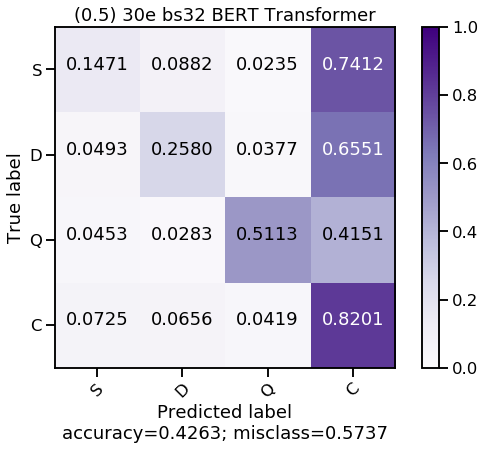

In [21]:
plot_confusion_matrix(normalize(m_temp),["S","D","Q","C"],"(0.5) 30e bs32 BERT Transformer", cmap='Purples')

[0.5] 30e bs32 Encoder Layer Attention head Promedio 0


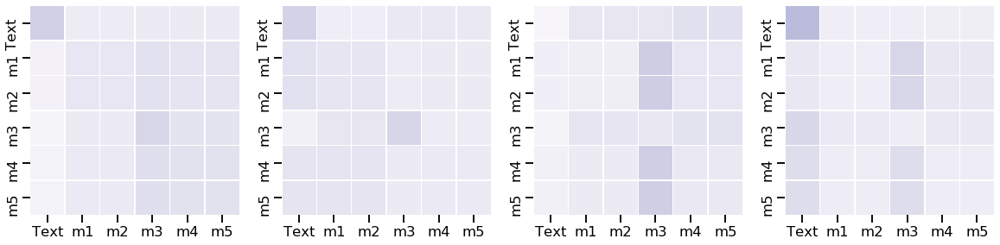

[0.5] 30e bs32 Encoder Layer Attention head Promedio 1


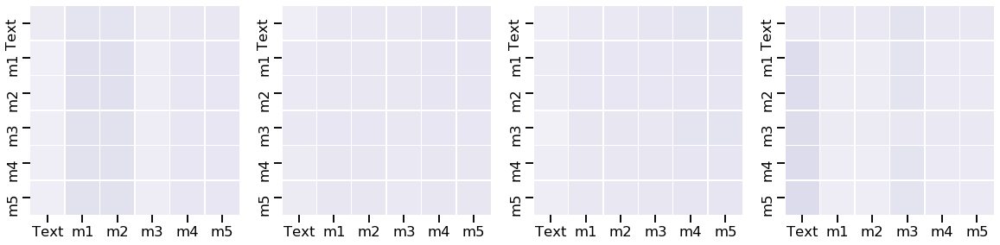

In [22]:
label=[['Text', 'm1', 'm2','m3','m4','m5']]
for layer in range(2):
    fig, axs = plt.subplots(1,4, figsize=(20, 10))
    print ("[0.5] 30e bs32 Encoder Layer Attention head Promedio", layer)
    for head in range(4):
        at=np.zeros((6,6))
        matriz_attn= dict_attn_enc[str(layer)+str(head)]  #lista de 5 corridas en cada pos
        for m in matriz_attn:
            at+=m.numpy()
        sns.heatmap(at/5., xticklabels=label[0], yticklabels=label[0],
                    vmin=0.0, vmax=1.0, linewidths=.5, cmap="Purples", cbar=False, square=True, ax=axs[head]) #, annot=False,cbar_kws={"orientation": "horizontal","pad": 0.25})
    plt.show()

In [23]:
for h in range(2):
    for hy in range(4):
        to_mean=dict_attn_enc[str(h)+str(hy)]
        at=np.zeros((6,6))
        for m in to_mean:
            at+=m.numpy()
        global_attn.append(at/5.)
        
np.save("Attn_BERT_50_30e_bs32.npy", global_attn)

### 0.85

Entrenando Run # 1
Pesos de clases: [1. 1. 1. 1.]
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.3021, dtype=torch.float64) 	F-macro_val: tensor(0.3324, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.7118, dtype=torch.float64) 	F-macro_val: tensor(0.5065, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.7222, dtype=torch.float64) 	F-macro_val: tensor(0.5005, dtype=torch.float64)
Testing run # 1
SE TUVIERON QUE REPETIR 3 EJEMPLOS


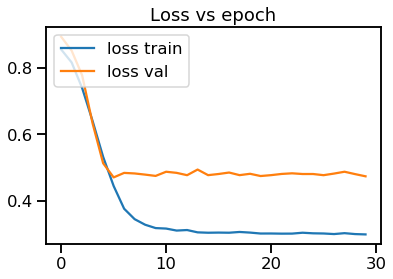

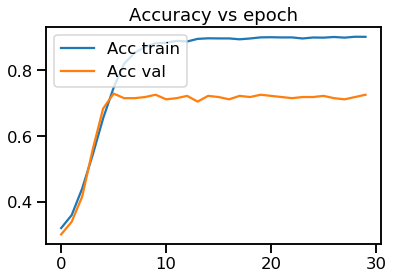

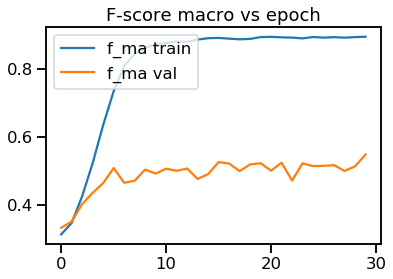

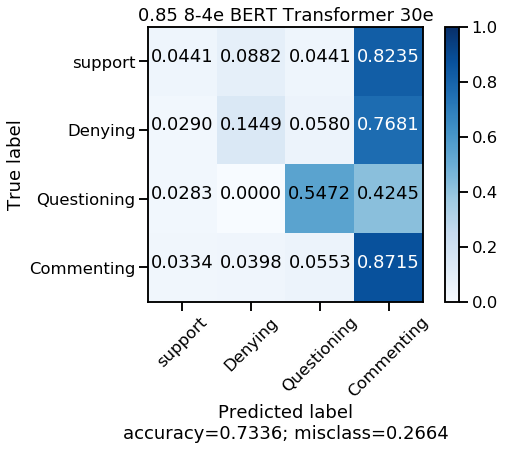

Test_ acc: 0.7335945151811949
Test_ f1 none: [0.05882353 0.17241379 0.54205607 0.84223602]
Test_ f1 macro: 0.40388235553157215
Encoder Layer Attention head 0


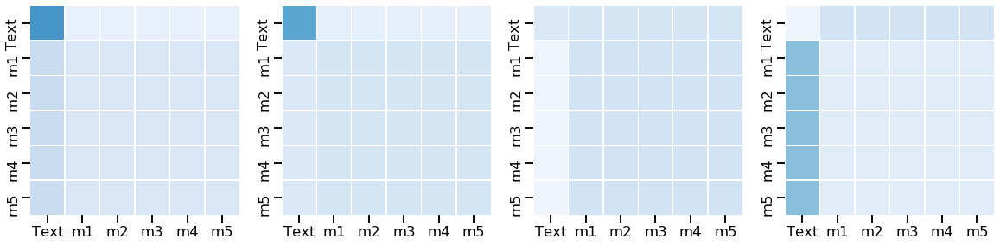

Encoder Layer Attention head 1


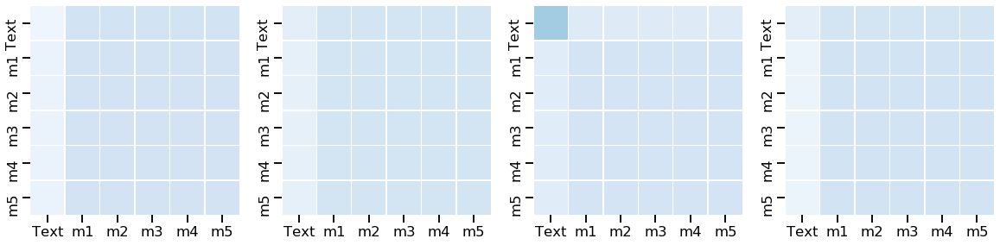

Entrenando Run # 2
Pesos de clases: [1. 1. 1. 1.]
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.2118, dtype=torch.float64) 	F-macro_val: tensor(0.1248, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.7465, dtype=torch.float64) 	F-macro_val: tensor(0.5265, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.7292, dtype=torch.float64) 	F-macro_val: tensor(0.5382, dtype=torch.float64)
Testing run # 2
SE TUVIERON QUE REPETIR 3 EJEMPLOS


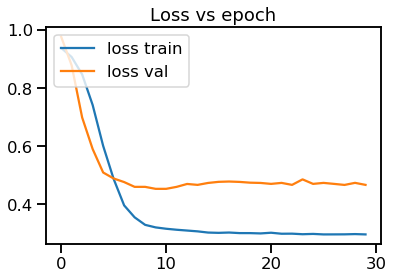

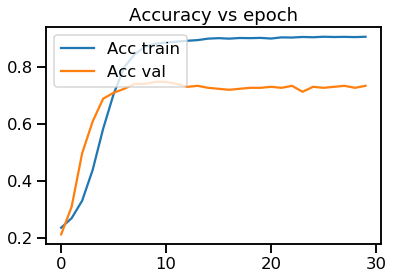

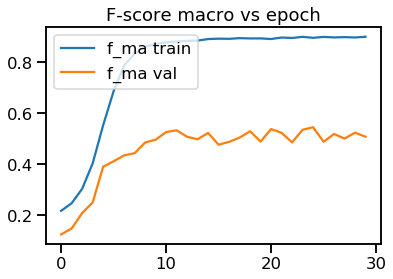

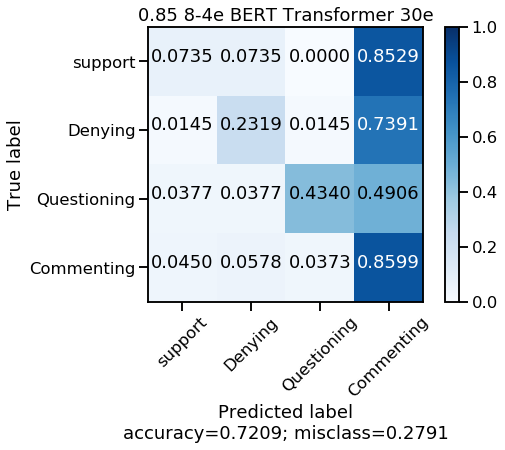

Test_ acc: 0.7208619000979432
Test_ f1 none: [0.08849558 0.23021583 0.50549451 0.83208955]
Test_ f1 macro: 0.41407386507317
Encoder Layer Attention head 0


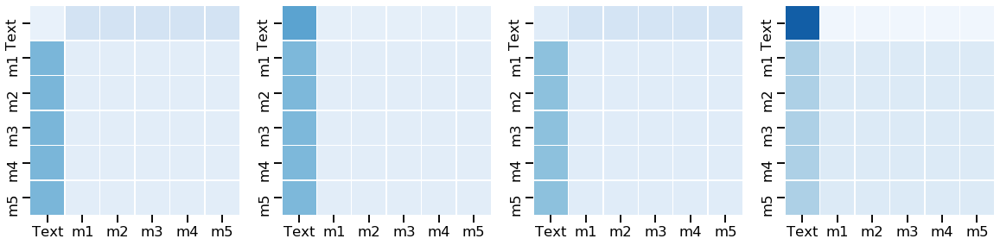

Encoder Layer Attention head 1


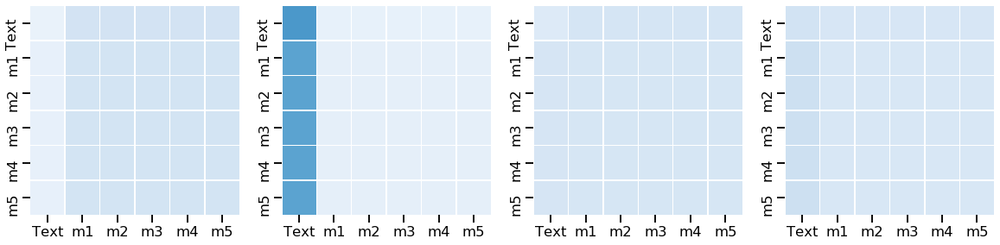

Entrenando Run # 3
Pesos de clases: [1. 1. 1. 1.]
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.1632, dtype=torch.float64) 	F-macro_val: tensor(0.1401, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.7014, dtype=torch.float64) 	F-macro_val: tensor(0.5190, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.6944, dtype=torch.float64) 	F-macro_val: tensor(0.5052, dtype=torch.float64)
Testing run # 3
SE TUVIERON QUE REPETIR 3 EJEMPLOS


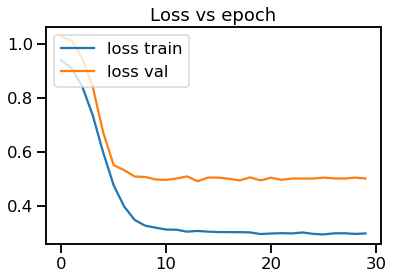

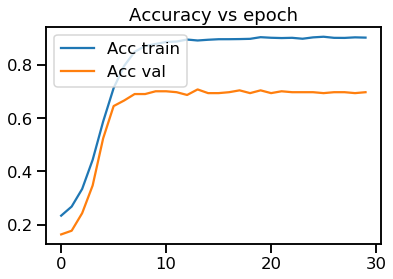

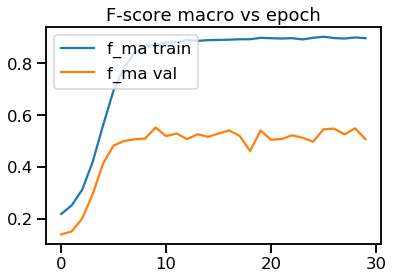

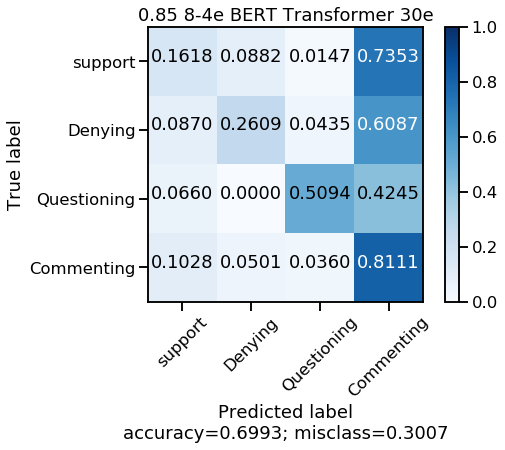

Test_ acc: 0.6993143976493633
Test_ f1 none: [0.12790698 0.27272727 0.5625     0.81630013]
Test_ f1 macro: 0.4448585947093912
Encoder Layer Attention head 0


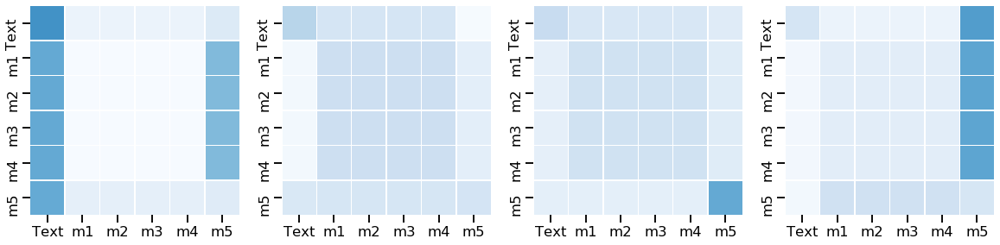

Encoder Layer Attention head 1


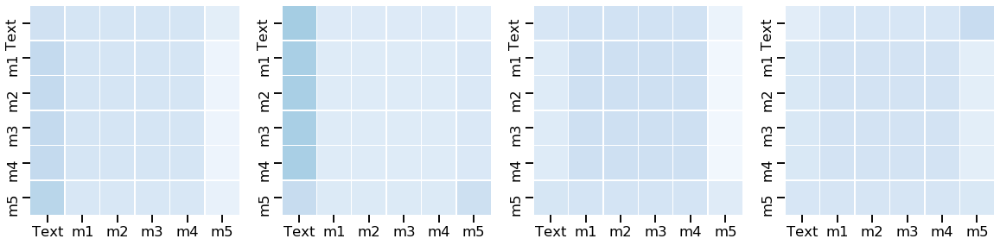

Entrenando Run # 4
Pesos de clases: [1. 1. 1. 1.]
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.1701, dtype=torch.float64) 	F-macro_val: tensor(0.1896, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.7118, dtype=torch.float64) 	F-macro_val: tensor(0.5023, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.7188, dtype=torch.float64) 	F-macro_val: tensor(0.5567, dtype=torch.float64)
Testing run # 4
SE TUVIERON QUE REPETIR 3 EJEMPLOS


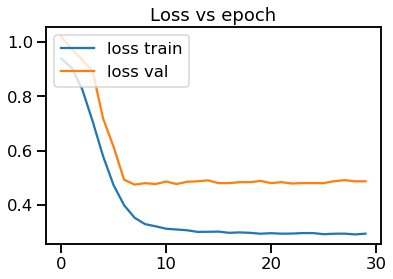

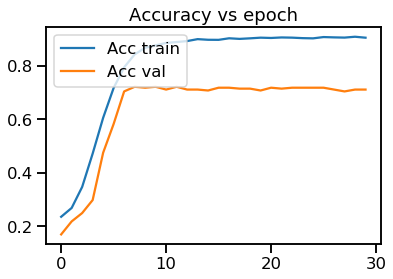

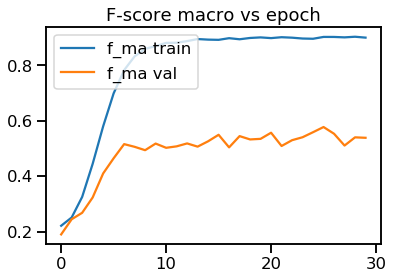

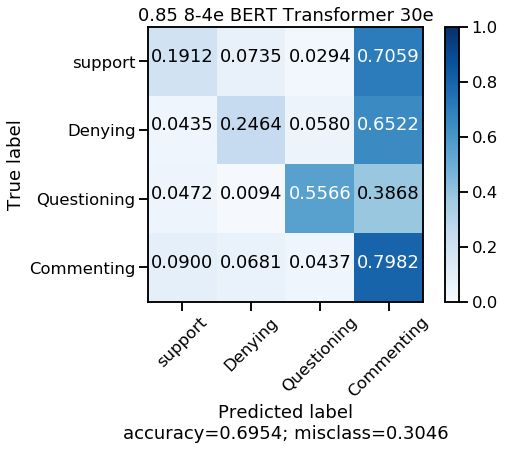

Test_ acc: 0.6953966699314398
Test_ f1 none: [0.16352201 0.23448276 0.57560976 0.81017613]
Test_ f1 macro: 0.4459476631353713
Encoder Layer Attention head 0


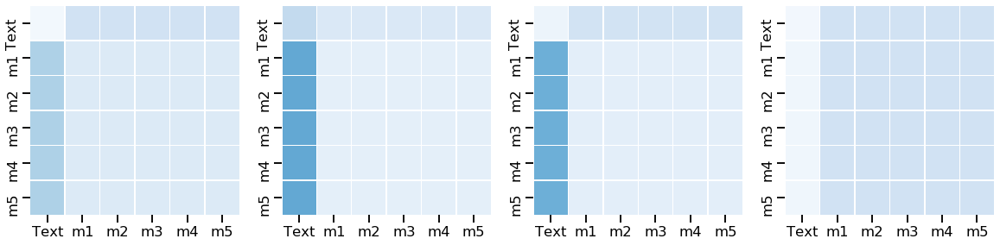

Encoder Layer Attention head 1


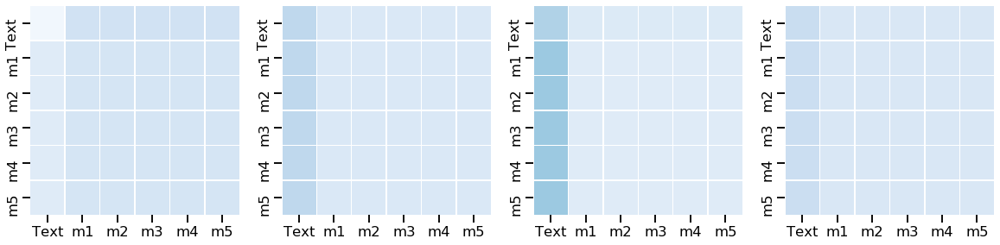

Entrenando Run # 5
Pesos de clases: [1. 1. 1. 1.]
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.1562, dtype=torch.float64) 	F-macro_val: tensor(0.1523, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.6944, dtype=torch.float64) 	F-macro_val: tensor(0.4677, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.7049, dtype=torch.float64) 	F-macro_val: tensor(0.4569, dtype=torch.float64)
Testing run # 5
SE TUVIERON QUE REPETIR 3 EJEMPLOS


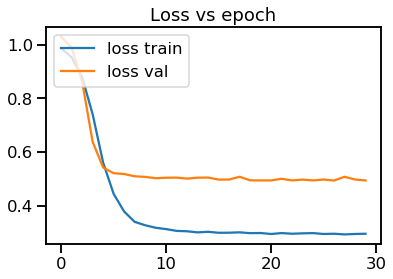

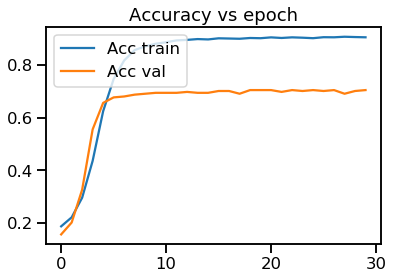

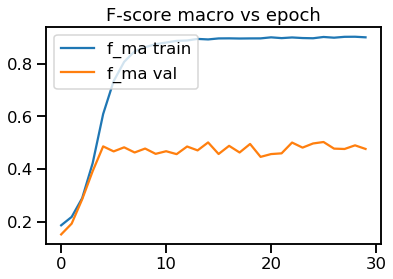

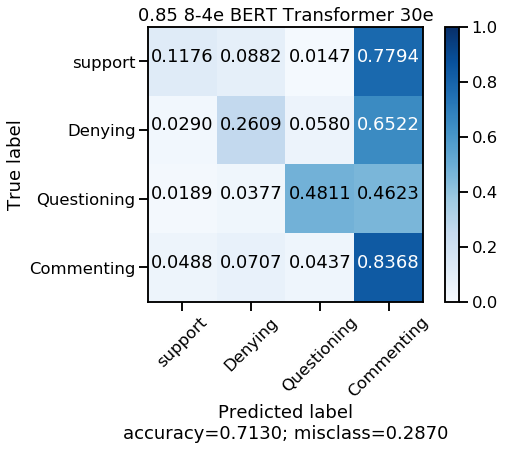

Test_ acc: 0.713026444662096
Test_ f1 none: [0.13559322 0.23684211 0.52040816 0.82614213]
Test_ f1 macro: 0.42974640521178564
Encoder Layer Attention head 0


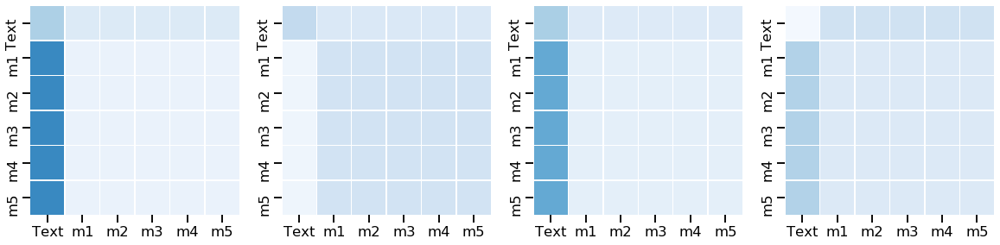

Encoder Layer Attention head 1


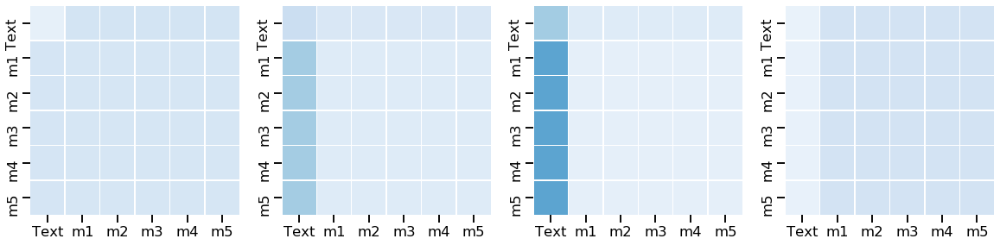

In [24]:
## menos epochs 

global_accs=[]
global_fnones=[]
global_fmacros=[]
global_cms=[]
global_attn=[]
dict_attn_enc={'00':[], '01':[], '02':[], '03':[], '10':[], '11':[], '12':[], '13':[]}
  
prob=0.85

for trans in range(1,6): 
    print ("Entrenando Run #", trans)
    macro_augmented= np.load('../new_glove_augmented/stance/Aumento_'+str(trans)+'-run_'+str(prob)+'_app1_Top1.npy', allow_pickle=True)
    
    ids_train=macro_augmented[:,0]
    tws_train=macro_augmented[:,1]
    labels_train=macro_augmented[:,2]
    class_weights= compute_class_weight('balanced', np.unique(labels_train), labels_train)
    print ("Pesos de clases:", class_weights)

    etiq=labels_train.copy()
    sentences = tws_train
    n_labels = np.array(etiq)
    y_train=to_categorical(n_labels,num_classes=4)
    
    input_ids = []
    for sent in sentences:
        encoded_tok=[]
        for wd in sent:
            try: 
                encoded_tok.append(Word2Index_valid[wd])
            except: 
                continue 
        input_ids.append(encoded_tok)
    
    input_ids = pad_sequences(input_ids, maxlen=MAX_LEN, dtype="long", 
                              value=0, truncating="post", padding="post")
    
    shape=np.asarray(input_ids).shape
    x_train=np.zeros((shape[0], shape[1], g_dim))
    j=0
    for in_id in input_ids:
        x_train[j]=M_GLOVE_space[in_id]
        j+=1
        
        
    cnn1 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'/cnn1_'+str(trans)+'-exec_app1_Top_1_8e.h5')
    cnn2 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'/cnn2_'+str(trans)+'-exec_app1_Top_1_8e.h5')
    rnn1 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'/rnn1_'+str(trans)+'-exec_app1_Top_1_4e.h5')
    rnn2 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'/rnn2_'+str(trans)+'-exec_app1_Top_1_8e.h5')
    rnn3 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'/rnn3_'+str(trans)+'-exec_app1_Top_1_4e.h5')

    list_models=['cnn1', 'cnn2', 'rnn1', 'rnn2', 'rnn3']
    index_models=np.arange(5)
    dict_models=dict((key, value) for (key, value) in zip(index_models,list_models))
    modelos=[cnn1, cnn2, rnn1, rnn2, rnn3]
    ind=np.arange(5)
    dict_trainedModel=dict((key, value) for (key, value) in zip(ind,modelos))

    bs=32
    b_dim=768
    
    predicciones_all=[]
    predicciones_all_val=[]
    predicciones_all_test=[]
    
    print ("agregando predicciones Train")
    for i in dict_trainedModel.keys(): 
        a_evaluar=dict_models[i]
        predicciones_all.append(dict_trainedModel[i].predict(x_train, batch_size=bs))
    print ("agregando predicciones Val")
    for i in dict_trainedModel.keys(): 
        a_evaluar=dict_models[i]
        predicciones_all_val.append(dict_trainedModel[i].predict(x_val, batch_size=bs))
    print ("agregando predicciones Test")
    for i in dict_trainedModel.keys(): 
        a_evaluar=dict_models[i]
        predicciones_all_test.append(dict_trainedModel[i].predict(x_test, batch_size=bs))

    matrix=np.asarray(predicciones_all)
    matrix_val=np.asarray(predicciones_all_val)
    matrix_test=np.asarray(predicciones_all_test)
    new_matrix=np.concatenate([matrix,matrix_val,matrix_test], axis=1)
    
    
    espacio=[np.ones(b_dim)]
    Ks= ortho_group.rvs(dim=b_dim)
    random=np.random.randint(Ks.shape[0], size=4)
    K_list=Ks[random]
    K_list_ext=espacio+list(K_list)
    index_embeddings=[0,1,2,3,4]
    lab_str_embeddings=['','','','','']

    for i in range(len(sentences)):
        ide=ids_train[i]
        tw_tr=tws_train[i]
        clase=dict_cl[labels_train[i]]
        
        #tws_train[i]
        final=' '
        frase=[final.join(tw_tr)]
        try: 
            vector= bc.encode(frase)[0]  
            #norm=np.linalg.norm(vector)
            final_bert= vector #/ norm
        except: 
            final_bert= np.zeros(b_dim)
        
        index_embeddings.append(i+5)
        lab_str_embeddings.append(clase)
        K_list_ext.append(final_bert)
    
    
    objs_val=val['Tw_id']      #df_val['Unnamed: 0'].values
    objs_test=test['Tw_id']    #np.arange(df_test.shape[0])
    lab_val=val['Label']
    lab_test=test['Label']
    tw_val=val['Tweet']
    tw_test=test['Tweet']
    llaves=np.concatenate([objs_val,objs_test])
    clases=np.concatenate([lab_val,lab_test])
    sent_all=np.concatenate([tw_val,tw_test])
    
       
    for num in range(len(llaves)):
        i=llaves[num]
        clase=clases[num]
        tw_tr=sent_all[num]
        #vector=np.load("../BaS_Original/Original/"+str(i)+".npy")
        encoded_tok, tokens_valid =my_tokenizer(cleaner(tw_tr)[1])
    
        final=' '
        frase=[final.join(tokens_valid)]
        try: 
            vector= bc.encode(frase)[0]    
            #norm=np.linalg.norm(vector)
            final_bert= vector #/ norm
        except: 
            final_bert= np.zeros(b_dim)

        index_embeddings.append(num+5+train.shape[0])
        lab_str_embeddings.append(clase)
        K_list_ext.append(final_bert)

    K_list_new= np.asarray(K_list_ext, dtype='float32')
    
    ###################################### TRANSFORMER ###############################
    hist_train_loss=[]
    hist_train_acc=[]
    hist_train_fma=[]
    hist_val_loss=[]
    hist_val_acc=[]
    hist_val_fma=[]
    
    V = 4
    pesos = torch.from_numpy(class_weights).float()
    criterion = FocalLoss(weights=pesos)
    model = make_model_concat(4, N=2,d_model=b_dim, d_ff=128, h=4, dropout=0.35)
    model_opt = NoamOpt(model.src_embed[0].d_model, 1, 6000, torch.optim.Adam(model.parameters(), lr=0, betas=(0.9, 0.98), eps=1e-5))

    
    for epoch in range(30):
        model.train()
        DATA=data_gen(bs, 'Train', 5, new_matrix)
        loss_train, acc_train,fma_train, f_none, cm_train=run_epoch(DATA, model, SimpleLossComputeFL(criterion, model_opt), 'Train')
        hist_train_loss.append(loss_train)
        hist_train_acc.append(acc_train)
        hist_train_fma.append(fma_train)
        
        model.eval()
        loss_val, acc_val,fma_val, f_val_none, cm_val=run_epoch(data_gen(bs, 'Val', 5, new_matrix), model, SimpleLossComputeFL(criterion, None),'Val')
        if epoch%10==0:
            print ("Epoch",epoch, "\tacc_val:",acc_val, "\tF-macro_val:",fma_val)
        hist_val_loss.append(loss_val)
        hist_val_acc.append(acc_val)
        hist_val_fma.append(fma_val)
    
    model.eval()
    print ("Testing run #",trans)
    predicciones = run_epoch(data_gen(bs, 'Test', 5, new_matrix), model, SimpleLossComputeFL(criterion, None),'Test')
    predicciones=np.concatenate(predicciones, axis=-1)
    
    glo_acc=accuracy_score(etiq_t, predicciones[:-3])
    glo_fno=f1_score(etiq_t,predicciones[:-3], average=None)
    glo_fma=f1_score(etiq_t,predicciones[:-3], average='macro')

    glo_cm=confusion_matrix(etiq_t, predicciones[:-3])
    
    
    plt.plot(hist_train_loss, label='loss train')
    plt.plot(hist_val_loss,label='loss val')
    plt.legend(loc='upper left')
    plt.title("Loss vs epoch")
    plt.show()

    plt.plot(hist_train_acc, label='Acc train')
    plt.plot(hist_val_acc, label='Acc val')
    plt.legend(loc='upper left')
    plt.title("Accuracy vs epoch")
    plt.show()

    plt.plot(hist_train_fma, label='f_ma train')
    plt.plot(hist_val_fma, label='f_ma val')
    plt.legend(loc='upper left')
    plt.title("F-score macro vs epoch")
    plt.show()
    #"""
    
    plot_confusion_matrix(glo_cm,["support","Denying","Questioning","Commenting"],"0.85 8-4e BERT Transformer 30e")
    global_accs.append(glo_acc)
    global_fnones.append(glo_fno)
    global_fmacros.append(glo_fma)
    global_cms.append(glo_cm)
    print("Test_ acc:",glo_acc) 
    print("Test_ f1 none:",glo_fno) 
    print("Test_ f1 macro:",glo_fma) 

    label=[['Text', 'm1', 'm2','m3','m4','m5']]
    for layer in range(2):
        fig, axs = plt.subplots(1,4, figsize=(20, 10))
        print ("Encoder Layer Attention head", layer)
        for head in range(4):
            matriz_attn=model.encoder.layers[layer].self_attn.attn[0,head].data
            dict_attn_enc[str(layer)+str(head)].append(matriz_attn)
            sns.heatmap(matriz_attn, xticklabels=label[0], yticklabels=label[0],
                        vmin=0.0, vmax=1.0, linewidths=.5, cmap="Blues", cbar=False, square=True, ax=axs[head]) #, annot=False,cbar_kws={"orientation": "horizontal","pad": 0.25})
        plt.show()

In [25]:
print ("Acc:",np.mean(np.asarray(global_accs)))
print ("F-score:", np.mean(np.asarray(global_fmacros)))
sup=np.mean(np.asarray(global_fnones)[:,0])
den=np.mean(np.asarray(global_fnones)[:,1])
que=np.mean(np.asarray(global_fnones)[:,2])
com=np.mean(np.asarray(global_fnones)[:,3])

print ("(0.85) 30e bs32 \tS-D-Q-C:", sup,den,que,com)

print ("\n\nConfusion counts")
m_temp=np.zeros((4,4))
for m in global_cms:
    m_temp+=np.asarray(m)
m_temp

Acc: 0.7124387855044075
F-score: 0.4277017767322581
(0.85) 30e bs32 	S-D-Q-C: 0.11486826285895782 0.22933635141053962 0.5412136999247454 0.8253887927347894


Confusion counts


array([[  40.,   28.,    7.,  265.],
       [  14.,   79.,   16.,  236.],
       [  21.,    9.,  268.,  232.],
       [ 249.,  223.,  168., 3250.]])

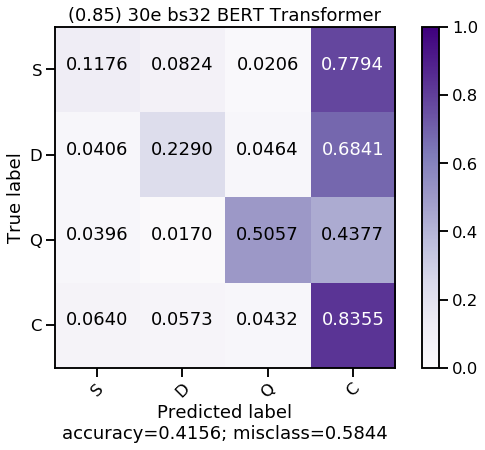

In [26]:
plot_confusion_matrix(normalize(m_temp),["S","D","Q","C"],"(0.85) 30e bs32 BERT Transformer", cmap='Purples')

[0.85] Encoder Layer Attention head Promedio 0


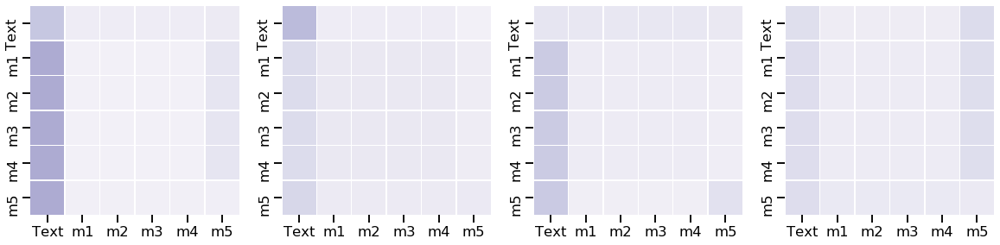

[0.85] Encoder Layer Attention head Promedio 1


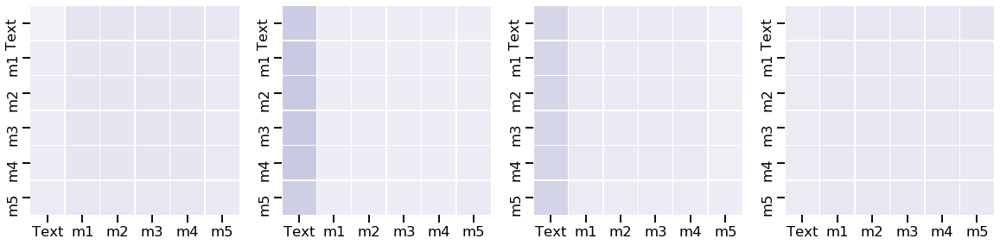

In [27]:
label=[['Text', 'm1', 'm2','m3','m4','m5']]
for layer in range(2):
    fig, axs = plt.subplots(1,4, figsize=(20, 10))
    print ("[0.85] Encoder Layer Attention head Promedio", layer)
    for head in range(4):
        at=np.zeros((6,6))
        matriz_attn= dict_attn_enc[str(layer)+str(head)]  #lista de 5 corridas en cada pos
        for m in matriz_attn:
            at+=m.numpy()
        sns.heatmap(at/5., xticklabels=label[0], yticklabels=label[0],
                    vmin=0.0, vmax=1.0, linewidths=.5, cmap="Purples", cbar=False, square=True, ax=axs[head]) #, annot=False,cbar_kws={"orientation": "horizontal","pad": 0.25})
    plt.show()

In [28]:
for h in range(2):
    for hy in range(4):
        to_mean=dict_attn_enc[str(h)+str(hy)]
        at=np.zeros((6,6))
        for m in to_mean:
            at+=m.numpy()
        global_attn.append(at/5.)
        
np.save("Attn_BERT_85_30e_bs32.npy", global_attn)

## Best??



BUSCANDO MEJOR BEST CIARP 0 


Entrenando Run # 1
Pesos de clases: [1. 1. 1. 1.]





Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.2500, dtype=torch.float64) 	F-macro_val: tensor(0.1753, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.6944, dtype=torch.float64) 	F-macro_val: tensor(0.5666, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.7014, dtype=torch.float64) 	F-macro_val: tensor(0.5706, dtype=torch.float64)
Testing run # 1
SE TUVIERON QUE REPETIR 3 EJEMPLOS


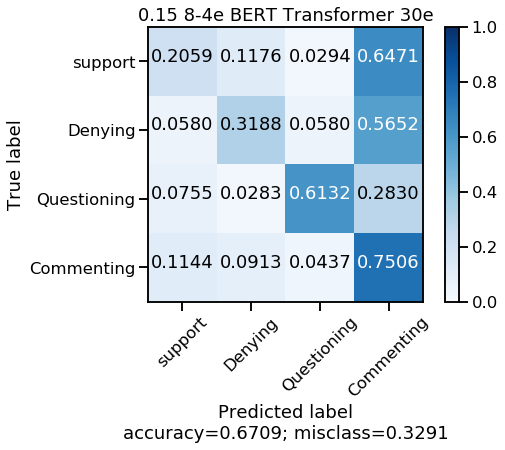

Test_ acc: 0.6709108716944172
Test_ f1 none: [0.15300546 0.25433526 0.61611374 0.79186441]
Test_ f1 macro: 0.4538297188629929
Entrenando Run # 2
Pesos de clases: [1. 1. 1. 1.]
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.1667, dtype=torch.float64) 	F-macro_val: tensor(0.1339, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.6910, dtype=torch.float64) 	F-macro_val: tensor(0.5330, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.6979, dtype=torch.float64) 	F-macro_val: tensor(0.5469, dtype=torch.float64)
Testing run # 2
SE TUVIERON QUE REPETIR 3 EJEMPLOS


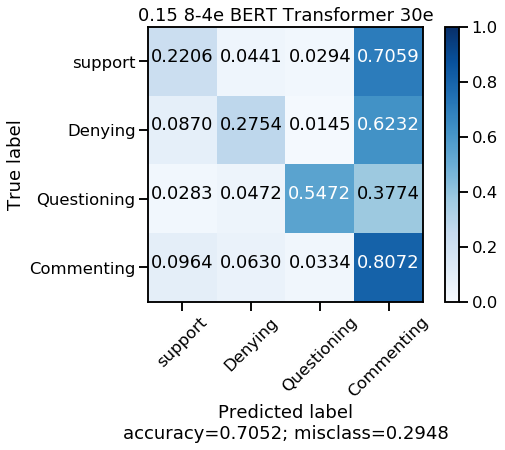

Test_ acc: 0.7051909892262488
Test_ f1 none: [0.17964072 0.26206897 0.60103627 0.81717632]
Test_ f1 macro: 0.4649805677529485
Entrenando Run # 3
Pesos de clases: [1. 1. 1. 1.]
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.2083, dtype=torch.float64) 	F-macro_val: tensor(0.1913, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.7014, dtype=torch.float64) 	F-macro_val: tensor(0.5429, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.6840, dtype=torch.float64) 	F-macro_val: tensor(0.5401, dtype=torch.float64)
Testing run # 3
SE TUVIERON QUE REPETIR 3 EJEMPLOS


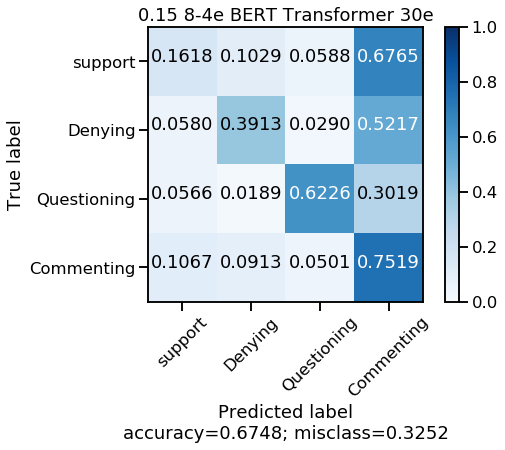

Test_ acc: 0.6748285994123409
Test_ f1 none: [0.12790698 0.30681818 0.60829493 0.79214624]
Test_ f1 macro: 0.4587915829552883
Entrenando Run # 4
Pesos de clases: [1. 1. 1. 1.]
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.2049, dtype=torch.float64) 	F-macro_val: tensor(0.1540, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.6458, dtype=torch.float64) 	F-macro_val: tensor(0.5107, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.6736, dtype=torch.float64) 	F-macro_val: tensor(0.5180, dtype=torch.float64)
Testing run # 4
SE TUVIERON QUE REPETIR 3 EJEMPLOS


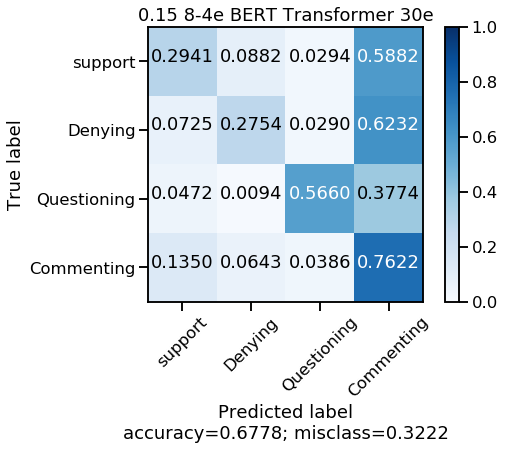

Test_ acc: 0.6777668952007836
Test_ f1 none: [0.19704433 0.26206897 0.6        0.79384203]
Test_ f1 macro: 0.4632388338246253
Entrenando Run # 5
Pesos de clases: [1. 1. 1. 1.]
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.2708, dtype=torch.float64) 	F-macro_val: tensor(0.2402, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.6562, dtype=torch.float64) 	F-macro_val: tensor(0.4962, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.6562, dtype=torch.float64) 	F-macro_val: tensor(0.4965, dtype=torch.float64)
Testing run # 5
SE TUVIERON QUE REPETIR 3 EJEMPLOS


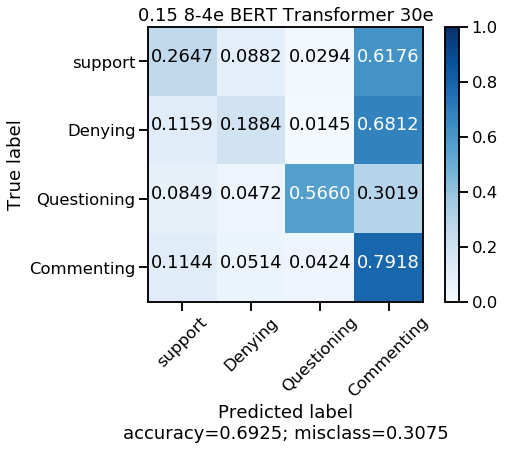

Test_ acc: 0.692458374142997
Test_ f1 none: [0.1875     0.19548872 0.59405941 0.81320132]
Test_ f1 macro: 0.4475623619692796


BUSCANDO MEJOR BEST CIARP 1 


Entrenando Run # 1
Pesos de clases: [1. 1. 1. 1.]
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.1910, dtype=torch.float64) 	F-macro_val: tensor(0.1247, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.7118, dtype=torch.float64) 	F-macro_val: tensor(0.5552, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.7153, dtype=torch.float64) 	F-macro_val: tensor(0.5409, dtype=torch.float64)
Testing run # 1
SE TUVIERON QUE REPETIR 3 EJEMPLOS


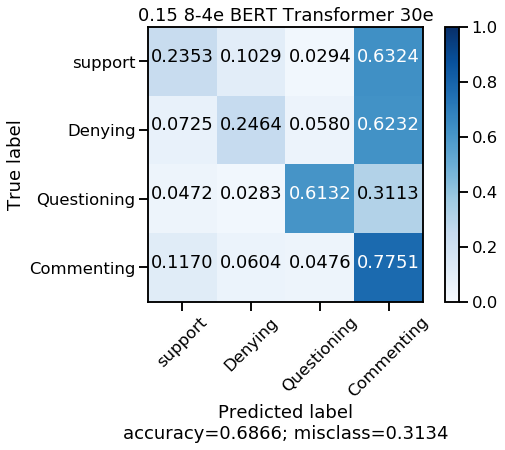

Test_ acc: 0.6865817825661117
Test_ f1 none: [0.17297297 0.23776224 0.60747664 0.804     ]
Test_ f1 macro: 0.4555529615623073
Entrenando Run # 2
Pesos de clases: [1. 1. 1. 1.]
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.1181, dtype=torch.float64) 	F-macro_val: tensor(0.0881, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.6944, dtype=torch.float64) 	F-macro_val: tensor(0.5161, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.7049, dtype=torch.float64) 	F-macro_val: tensor(0.5387, dtype=torch.float64)
Testing run # 2
SE TUVIERON QUE REPETIR 3 EJEMPLOS


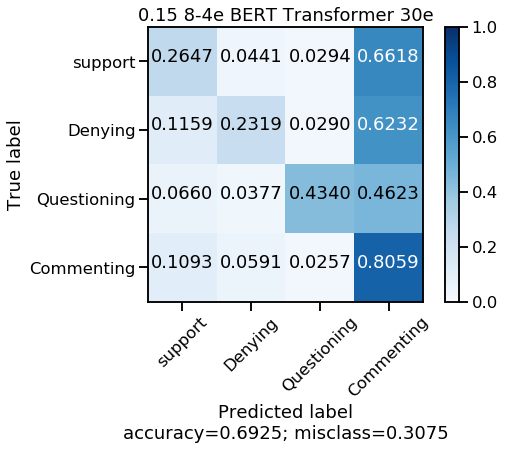

Test_ acc: 0.692458374142997
Test_ f1 none: [0.19354839 0.23188406 0.52272727 0.81322957]
Test_ f1 macro: 0.4403473224448743
Entrenando Run # 3
Pesos de clases: [1. 1. 1. 1.]
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.3021, dtype=torch.float64) 	F-macro_val: tensor(0.2014, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.6875, dtype=torch.float64) 	F-macro_val: tensor(0.5246, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.6632, dtype=torch.float64) 	F-macro_val: tensor(0.5127, dtype=torch.float64)
Testing run # 3
SE TUVIERON QUE REPETIR 3 EJEMPLOS


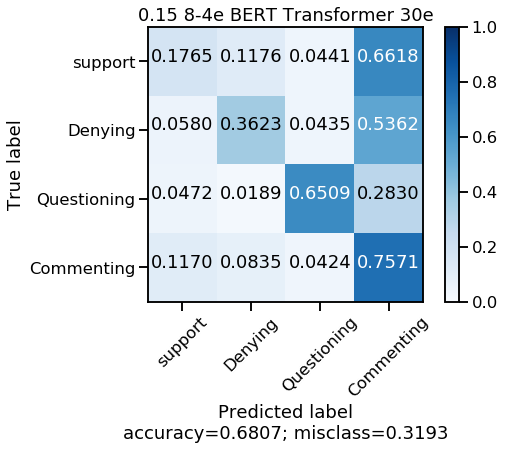

Test_ acc: 0.6807051909892262
Test_ f1 none: [0.13333333 0.29585799 0.64485981 0.79648411]
Test_ f1 macro: 0.4676338113672148
Entrenando Run # 4
Pesos de clases: [1. 1. 1. 1.]
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.1562, dtype=torch.float64) 	F-macro_val: tensor(0.1208, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.6840, dtype=torch.float64) 	F-macro_val: tensor(0.5302, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.6944, dtype=torch.float64) 	F-macro_val: tensor(0.5300, dtype=torch.float64)
Testing run # 4
SE TUVIERON QUE REPETIR 3 EJEMPLOS


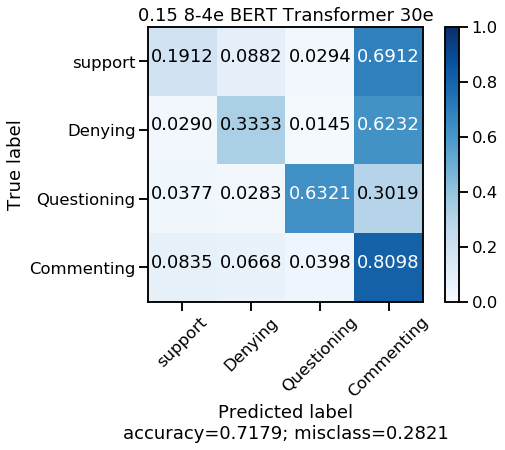

Test_ acc: 0.7179236043095005
Test_ f1 none: [0.17105263 0.30065359 0.647343   0.82352941]
Test_ f1 macro: 0.48564465832099435
Entrenando Run # 5
Pesos de clases: [1. 1. 1. 1.]
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.1944, dtype=torch.float64) 	F-macro_val: tensor(0.1777, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.6910, dtype=torch.float64) 	F-macro_val: tensor(0.5211, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.6875, dtype=torch.float64) 	F-macro_val: tensor(0.5203, dtype=torch.float64)
Testing run # 5
SE TUVIERON QUE REPETIR 3 EJEMPLOS


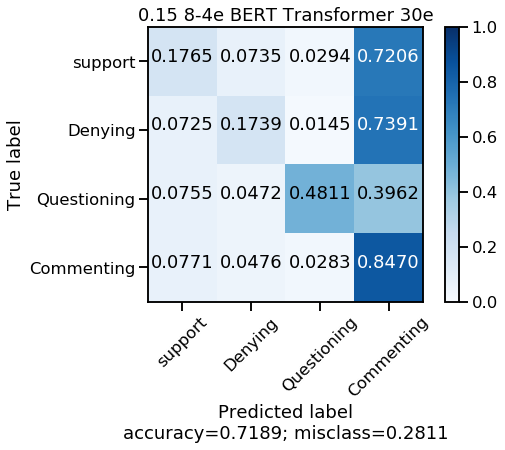

Test_ acc: 0.7189030362389814
Test_ f1 none: [0.15686275 0.1875     0.56043956 0.83470551]
Test_ f1 macro: 0.4348769538384848


BUSCANDO MEJOR BEST CIARP 2 


Entrenando Run # 1
Pesos de clases: [1. 1. 1. 1.]
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.5000, dtype=torch.float64) 	F-macro_val: tensor(0.2414, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.7222, dtype=torch.float64) 	F-macro_val: tensor(0.5700, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.6979, dtype=torch.float64) 	F-macro_val: tensor(0.5580, dtype=torch.float64)
Testing run # 1
SE TUVIERON QUE REPETIR 3 EJEMPLOS


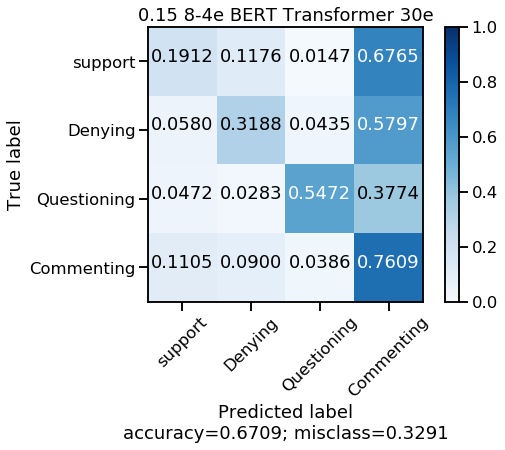

Test_ acc: 0.6709108716944172
Test_ f1 none: [0.14772727 0.25581395 0.58585859 0.79144385]
Test_ f1 macro: 0.4452109155854026
Entrenando Run # 2
Pesos de clases: [1. 1. 1. 1.]
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.2847, dtype=torch.float64) 	F-macro_val: tensor(0.1993, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.6806, dtype=torch.float64) 	F-macro_val: tensor(0.5250, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.6944, dtype=torch.float64) 	F-macro_val: tensor(0.5382, dtype=torch.float64)
Testing run # 2
SE TUVIERON QUE REPETIR 3 EJEMPLOS


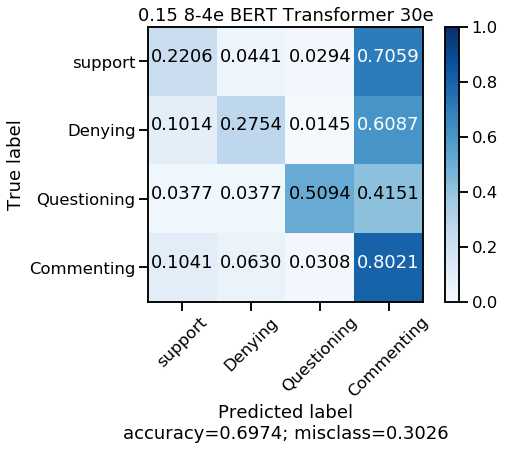

Test_ acc: 0.6973555337904016
Test_ f1 none: [0.17142857 0.26388889 0.57754011 0.8125    ]
Test_ f1 macro: 0.45633939181733296
Entrenando Run # 3
Pesos de clases: [1. 1. 1. 1.]
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.2153, dtype=torch.float64) 	F-macro_val: tensor(0.1856, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.6667, dtype=torch.float64) 	F-macro_val: tensor(0.5182, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.6736, dtype=torch.float64) 	F-macro_val: tensor(0.5322, dtype=torch.float64)
Testing run # 3
SE TUVIERON QUE REPETIR 3 EJEMPLOS


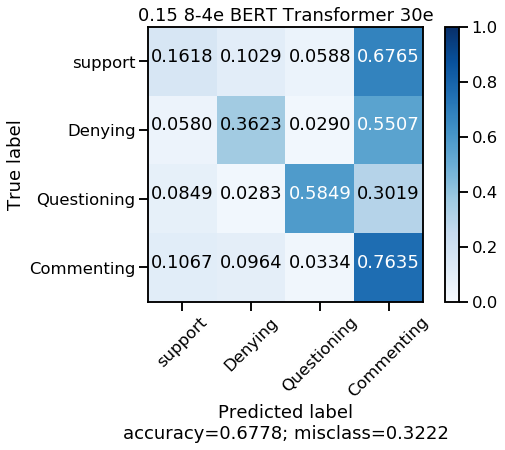

Test_ acc: 0.6777668952007836
Test_ f1 none: [0.12571429 0.27932961 0.62       0.7983871 ]
Test_ f1 macro: 0.4558577478567567
Entrenando Run # 4
Pesos de clases: [1. 1. 1. 1.]
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.2431, dtype=torch.float64) 	F-macro_val: tensor(0.1807, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.6667, dtype=torch.float64) 	F-macro_val: tensor(0.5049, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.6806, dtype=torch.float64) 	F-macro_val: tensor(0.5177, dtype=torch.float64)
Testing run # 4
SE TUVIERON QUE REPETIR 3 EJEMPLOS


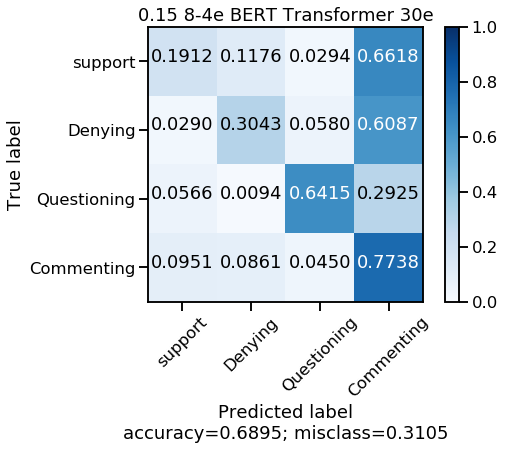

Test_ acc: 0.6895200783545543
Test_ f1 none: [0.1595092  0.25301205 0.63255814 0.80373832]
Test_ f1 macro: 0.462204426984663
Entrenando Run # 5
Pesos de clases: [1. 1. 1. 1.]
agregando predicciones Train
agregando predicciones Val
agregando predicciones Test
Creando modelo con salida Softmax
Epoch 0 	acc_val: tensor(0.0903, dtype=torch.float64) 	F-macro_val: tensor(0.0868, dtype=torch.float64)
Epoch 10 	acc_val: tensor(0.6597, dtype=torch.float64) 	F-macro_val: tensor(0.4671, dtype=torch.float64)
Epoch 20 	acc_val: tensor(0.6667, dtype=torch.float64) 	F-macro_val: tensor(0.4948, dtype=torch.float64)
Testing run # 5
SE TUVIERON QUE REPETIR 3 EJEMPLOS


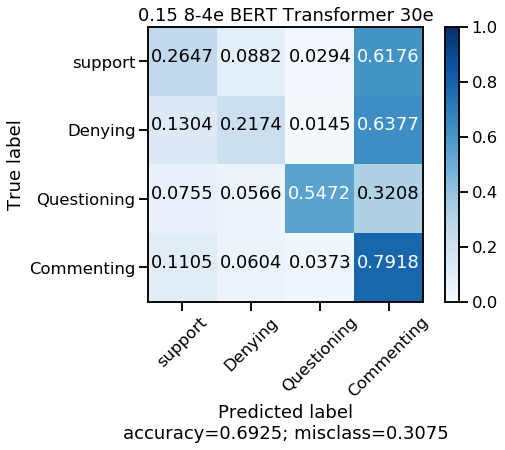

Test_ acc: 0.692458374142997
Test_ f1 none: [0.19047619 0.20979021 0.59183673 0.81373844]
Test_ f1 macro: 0.45146039404390037


In [13]:
## menos epochs 
for best in range(3):
    print ("\n\nBUSCANDO MEJOR BEST CIARP",best,"\n\n")
    
    global_accs=[]
    global_fnones=[]
    global_fmacros=[]
    global_cms=[]
    global_attn=[]
    dict_attn_enc={'00':[], '01':[], '02':[], '03':[], '10':[], '11':[], '12':[], '13':[]}
    prob=0.15

    for trans in range(1,6): 
        print ("Entrenando Run #", trans)
        macro_augmented= np.load('../new_glove_augmented/stance/Aumento_'+str(trans)+'-run_'+str(prob)+'_app1_Top1.npy', allow_pickle=True)
        ids_train=macro_augmented[:,0]
        tws_train=macro_augmented[:,1]
        labels_train=macro_augmented[:,2]
        class_weights= compute_class_weight('balanced', np.unique(labels_train), labels_train)
        print ("Pesos de clases:", class_weights)

        etiq=labels_train.copy()
        sentences = tws_train
        n_labels = np.array(etiq)
        y_train=to_categorical(n_labels,num_classes=4)

        input_ids = []
        for sent in sentences:
            encoded_tok=[]
            for wd in sent:
                try: 
                    encoded_tok.append(Word2Index_valid[wd])
                except: 
                    continue 
            input_ids.append(encoded_tok)
        input_ids = pad_sequences(input_ids, maxlen=MAX_LEN, dtype="long", 
                                  value=0, truncating="post", padding="post")

        shape=np.asarray(input_ids).shape
        x_train=np.zeros((shape[0], shape[1], g_dim))
        j=0
        for in_id in input_ids:
            x_train[j]=M_GLOVE_space[in_id]
            j+=1

        cnn1 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'/cnn1_'+str(trans)+'-exec_app1_Top_1_8e.h5')
        cnn2 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'/cnn2_'+str(trans)+'-exec_app1_Top_1_8e.h5')
        rnn1 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'/rnn1_'+str(trans)+'-exec_app1_Top_1_4e.h5')
        rnn2 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'/rnn2_'+str(trans)+'-exec_app1_Top_1_8e.h5')
        rnn3 = load_model('../new_glove_augmented/stance_baselines/'+str(prob)+'/rnn3_'+str(trans)+'-exec_app1_Top_1_4e.h5')

        list_models=['cnn1', 'cnn2', 'rnn1', 'rnn2', 'rnn3']
        index_models=np.arange(5)
        dict_models=dict((key, value) for (key, value) in zip(index_models,list_models))
        modelos=[cnn1, cnn2, rnn1, rnn2, rnn3]
        ind=np.arange(5)
        dict_trainedModel=dict((key, value) for (key, value) in zip(ind,modelos))

        bs=32
        b_dim=768
        predicciones_all=[]
        predicciones_all_val=[]
        predicciones_all_test=[]

        print ("agregando predicciones Train")
        for i in dict_trainedModel.keys(): 
            a_evaluar=dict_models[i]
            predicciones_all.append(dict_trainedModel[i].predict(x_train, batch_size=bs))
        print ("agregando predicciones Val")
        for i in dict_trainedModel.keys(): 
            a_evaluar=dict_models[i]
            predicciones_all_val.append(dict_trainedModel[i].predict(x_val, batch_size=bs))
        print ("agregando predicciones Test")
        for i in dict_trainedModel.keys(): 
            a_evaluar=dict_models[i]
            predicciones_all_test.append(dict_trainedModel[i].predict(x_test, batch_size=bs))

        matrix=np.asarray(predicciones_all)
        matrix_val=np.asarray(predicciones_all_val)
        matrix_test=np.asarray(predicciones_all_test)
        new_matrix=np.concatenate([matrix,matrix_val,matrix_test], axis=1)
        espacio=[np.ones(b_dim)]
        Ks= ortho_group.rvs(dim=b_dim)
        random=np.random.randint(Ks.shape[0], size=4)
        K_list=Ks[random]
        K_list_ext=espacio+list(K_list)
        index_embeddings=[0,1,2,3,4]
        lab_str_embeddings=['','','','','']

        for i in range(len(sentences)):
            ide=ids_train[i]
            tw_tr=tws_train[i]
            clase=dict_cl[labels_train[i]]
            final=' '
            frase=[final.join(tw_tr)]
            try: 
                vector= bc.encode(frase)[0]  
                #norm=np.linalg.norm(vector)
                final_bert= vector #/ norm
            except: 
                final_bert= np.zeros(b_dim)

            index_embeddings.append(i+5)
            lab_str_embeddings.append(clase)
            K_list_ext.append(final_bert)


        objs_val=val['Tw_id']      #df_val['Unnamed: 0'].values
        objs_test=test['Tw_id']    #np.arange(df_test.shape[0])
        lab_val=val['Label']
        lab_test=test['Label']
        tw_val=val['Tweet']
        tw_test=test['Tweet']
        llaves=np.concatenate([objs_val,objs_test])
        clases=np.concatenate([lab_val,lab_test])
        sent_all=np.concatenate([tw_val,tw_test])

        for num in range(len(llaves)):
            i=llaves[num]
            clase=clases[num]
            tw_tr=sent_all[num]
            #vector=np.load("../BaS_Original/Original/"+str(i)+".npy")
            encoded_tok, tokens_valid =my_tokenizer(cleaner(tw_tr)[1])
            final=' '
            frase=[final.join(tokens_valid)]
            try: 
                vector= bc.encode(frase)[0]    
                #norm=np.linalg.norm(vector)
                final_bert= vector #/ norm
            except: 
                final_bert= np.zeros(b_dim)

            index_embeddings.append(num+5+train.shape[0])
            lab_str_embeddings.append(clase)
            K_list_ext.append(final_bert)

        K_list_new= np.asarray(K_list_ext, dtype='float32')

        ###################################### TRANSFORMER ###############################
        hist_train_loss=[]
        hist_train_acc=[]
        hist_train_fma=[]
        hist_val_loss=[]
        hist_val_acc=[]
        hist_val_fma=[]

        V = 4
        pesos = torch.from_numpy(class_weights).float()
        criterion = FocalLoss(weights=pesos)
        model = make_model_concat(4, N=2,d_model=b_dim, d_ff=128, h=4, dropout=0.35)
        model_opt = NoamOpt(model.src_embed[0].d_model, 1, 6000, torch.optim.Adam(model.parameters(), lr=0, betas=(0.9, 0.98), eps=1e-5))

        for epoch in range(30):
            model.train()
            DATA=data_gen(bs, 'Train', 5, new_matrix)
            loss_train, acc_train,fma_train, f_none, cm_train=run_epoch(DATA, model, SimpleLossComputeFL(criterion, model_opt), 'Train')
            hist_train_loss.append(loss_train)
            hist_train_acc.append(acc_train)
            hist_train_fma.append(fma_train)

            model.eval()
            loss_val, acc_val,fma_val, f_val_none, cm_val=run_epoch(data_gen(bs, 'Val', 5, new_matrix), model, SimpleLossComputeFL(criterion, None),'Val')
            if epoch%10==0:
                print ("Epoch",epoch, "\tacc_val:",acc_val, "\tF-macro_val:",fma_val)
            hist_val_loss.append(loss_val)
            hist_val_acc.append(acc_val)
            hist_val_fma.append(fma_val)

        model.eval()
        print ("Testing run #",trans)
        predicciones = run_epoch(data_gen(bs, 'Test', 5, new_matrix), model, SimpleLossComputeFL(criterion, None),'Test')
        predicciones=np.concatenate(predicciones, axis=-1)

        glo_acc=accuracy_score(etiq_t, predicciones[:-3])
        glo_fno=f1_score(etiq_t,predicciones[:-3], average=None)
        glo_fma=f1_score(etiq_t,predicciones[:-3], average='macro')

        glo_cm=confusion_matrix(etiq_t, predicciones[:-3])
        plot_confusion_matrix(glo_cm,["support","Denying","Questioning","Commenting"],"0.15 8-4e BERT Transformer 30e")
        global_accs.append(glo_acc)
        global_fnones.append(glo_fno)
        global_fmacros.append(glo_fma)
        global_cms.append(glo_cm)
        print("Test_ acc:",glo_acc) 
        print("Test_ f1 none:",glo_fno) 
        print("Test_ f1 macro:",glo_fma) 

